In [1]:
# Generative A.I course by Javier Ideami
# Basic GAN Notebook

# Read a fun article about GANS that I wrote in medium:
# https://towardsdatascience.com/leonardo-and-the-gan-dream-f69e8553e0af?sk=c1fdf85e94c48acd61df451babc41dfe

# import the libraries
import torch, pdb
from torch.utils.data import DataLoader
from torch import nn
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import
from tqdm.auto import tqdm
import matplotlib.pyplot as plt

In [2]:
# visualization function
def show(tensor, ch=1, size=(28,28), num=16):
  # tensor: 128 x 784
  data=tensor.detach().cpu().view(-1,ch,*size) # 128 x 1 x 28 x 28
  grid = make_grid(data[:num], nrow=4).permute(1,2,0)   # 1 x 28 x 28  = 28 x 28 x 1
  plt.imshow(grid)
  plt.show()


In [3]:
# setup of the main parameters and hyperparameters
epochs = 500
cur_step = 0
info_step = 300
mean_gen_loss = 0
mean_disc_loss = 0

z_dim = 64
lr = 0.00001
loss_func = nn.BCEWithLogitsLoss()

bs = 128
device = 'cpu'

dataloader = DataLoader(MNIST('.', download=True, transform=transforms.ToTensor()),shuffle=True, batch_size=bs)

# number of steps = 60000 / 128 = 468.75

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 16336944.85it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 480805.95it/s]


Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 1224854.99it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 5446120.29it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [4]:
# declare our models

# Generator
def genBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.BatchNorm1d(out),
      nn.ReLU(inplace=True)
  )

class Generator(nn.Module):
  def __init__(self, z_dim=64, i_dim=784, h_dim=128):
    super().__init__()
    self.gen = nn.Sequential(
        genBlock(z_dim, h_dim), # 64, 128
        genBlock(h_dim, h_dim*2), # 128, 256
        genBlock(h_dim*2, h_dim*4), # 256 x 512
        genBlock(h_dim*4, h_dim*8), # 512, 1024
        nn.Linear(h_dim*8, i_dim), # 1024, 784 (28x28)
        nn.Sigmoid(),
    )

  def forward(self, noise):
       return self.gen(noise)

def gen_noise(number, z_dim):
  return torch.randn(number, z_dim).to(device)

## Discriminator
def discBlock(inp, out):
  return nn.Sequential(
      nn.Linear(inp, out),
      nn.LeakyReLU(0.2)
  )

class Discriminator(nn.Module):
  def __init__(self, i_dim=784, h_dim=256):
    super().__init__()
    self.disc=nn.Sequential(
        discBlock(i_dim, h_dim*4), # 784, 1024
        discBlock(h_dim*4, h_dim*2), # 1024, 512
        discBlock(h_dim*2, h_dim), # 512, 256
        nn.Linear(h_dim, 1) # 256, 1
    )

  def forward(self, image):
      return self.disc(image)

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [6]:
gen

Generator(
  (gen): Sequential(
    (0): Sequential(
      (0): Linear(in_features=64, out_features=128, bias=True)
      (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Linear(in_features=128, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (2): Sequential(
      (0): Linear(in_features=256, out_features=512, bias=True)
      (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (3): Sequential(
      (0): Linear(in_features=512, out_features=1024, bias=True)
      (1): BatchNorm1d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (4): Linear(in_features=1024, out_features=784, bias=True)
    (5): Sigmoid()
  )
)

In [7]:
disc

Discriminator(
  (disc): Sequential(
    (0): Sequential(
      (0): Linear(in_features=784, out_features=1024, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (1): Sequential(
      (0): Linear(in_features=1024, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (2): Sequential(
      (0): Linear(in_features=512, out_features=256, bias=True)
      (1): LeakyReLU(negative_slope=0.2)
    )
    (3): Linear(in_features=256, out_features=1, bias=True)
  )
)

torch.Size([128, 1, 28, 28]) torch.Size([128])
tensor([3, 2, 4, 8, 2, 6, 3, 9, 8, 9])


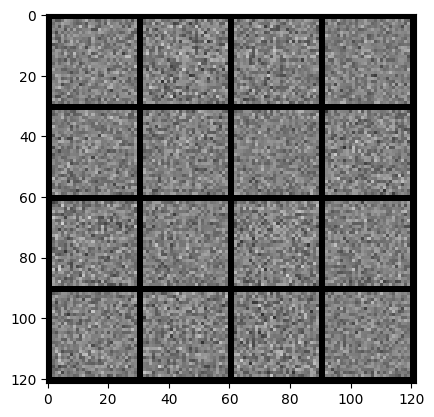

In [8]:
x,y=next(iter(dataloader))
print(x.shape, y.shape)
print(y[:10])

noise = gen_noise(bs, z_dim)
fake = gen(noise)
show(fake)

In [9]:
# calculating the loss

# generator loss
def calc_gen_loss(loss_func, gen, disc, number, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   pred = disc(fake)
   targets=torch.ones_like(pred)
   gen_loss=loss_func(pred,targets)

   return gen_loss


def calc_disc_loss(loss_func, gen, disc, number, real, z_dim):
   noise = gen_noise(number, z_dim)
   fake = gen(noise)
   disc_fake = disc(fake.detach())
   disc_fake_targets=torch.zeros_like(disc_fake)
   disc_fake_loss=loss_func(disc_fake, disc_fake_targets)

   disc_real = disc(real)
   disc_real_targets=torch.ones_like(disc_real)
   disc_real_loss=loss_func(disc_real, disc_real_targets)

   disc_loss=(disc_fake_loss+disc_real_loss)/2

   return disc_loss




  0%|          | 0/469 [00:00<?, ?it/s]

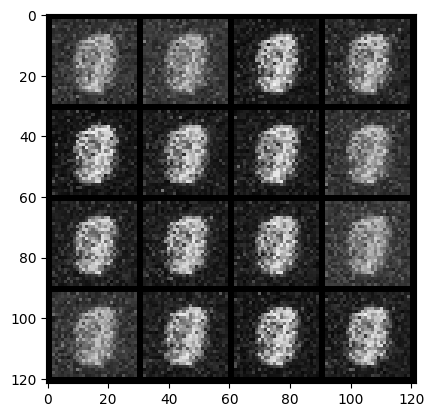

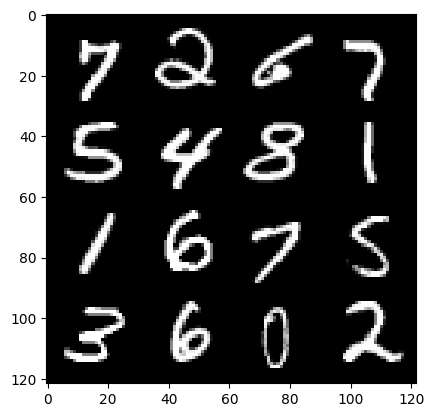

0: step 300 / Gen loss: 1.8099974685907363 / disc_loss: 0.3410174500942231


  0%|          | 0/469 [00:00<?, ?it/s]

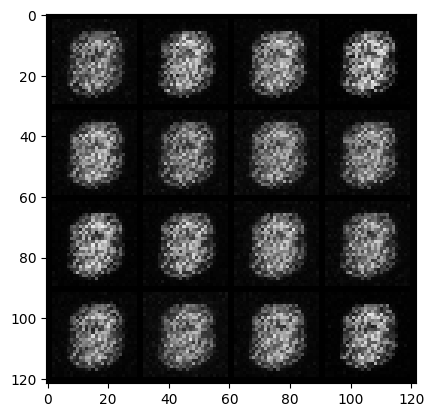

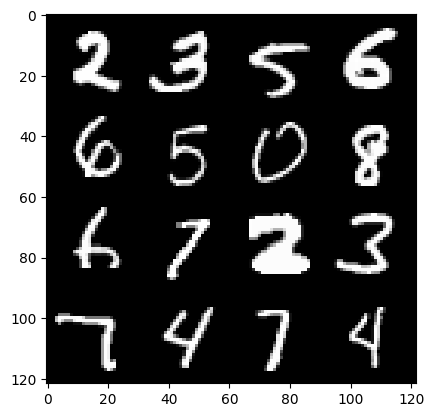

1: step 600 / Gen loss: 3.340544071197511 / disc_loss: 0.11500928382078808


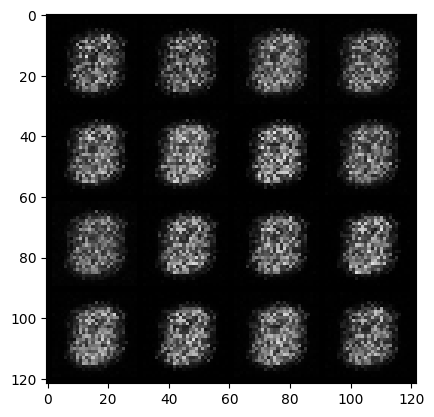

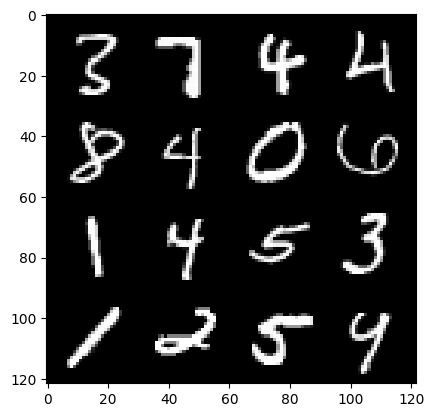

1: step 900 / Gen loss: 3.289677890141806 / disc_loss: 0.05970204966763655


  0%|          | 0/469 [00:00<?, ?it/s]

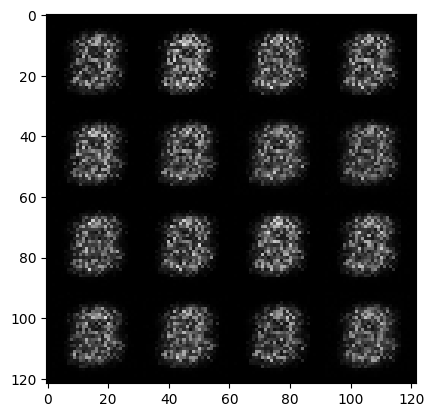

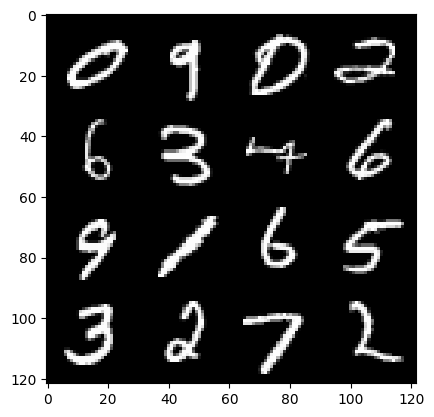

2: step 1200 / Gen loss: 3.370416155656179 / disc_loss: 0.04177401057754953


  0%|          | 0/469 [00:00<?, ?it/s]

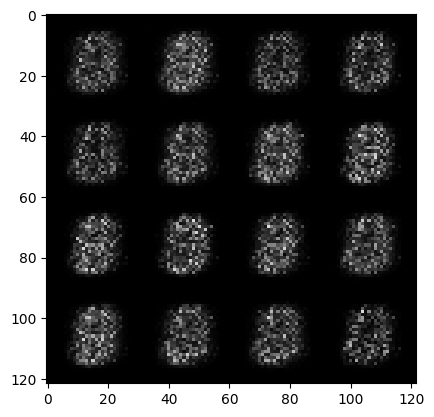

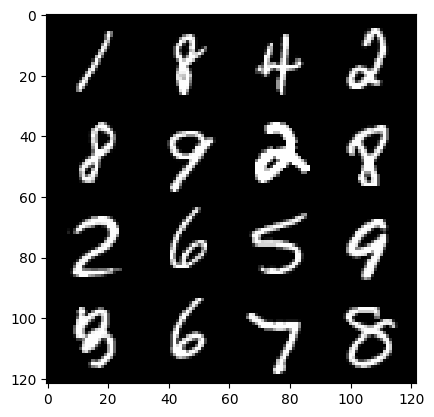

3: step 1500 / Gen loss: 3.3795346172650675 / disc_loss: 0.038631611031790546


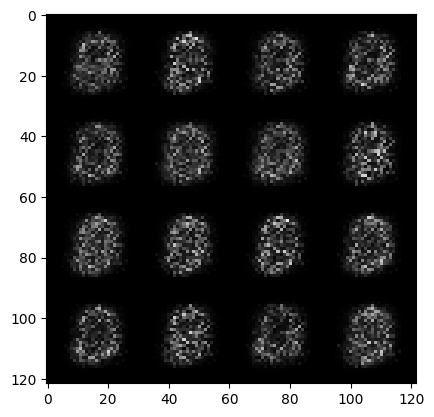

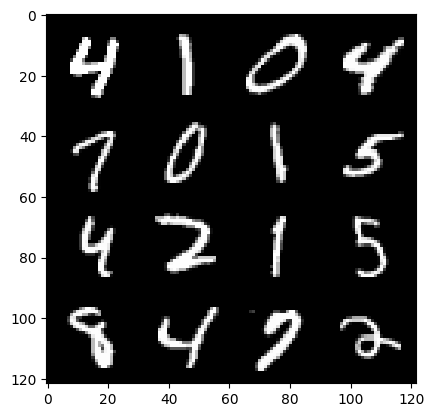

3: step 1800 / Gen loss: 3.5178253897031184 / disc_loss: 0.03811121760557094


  0%|          | 0/469 [00:00<?, ?it/s]

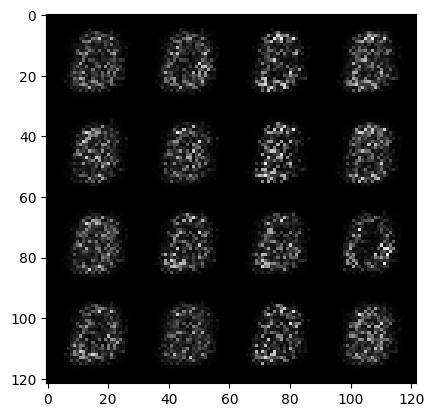

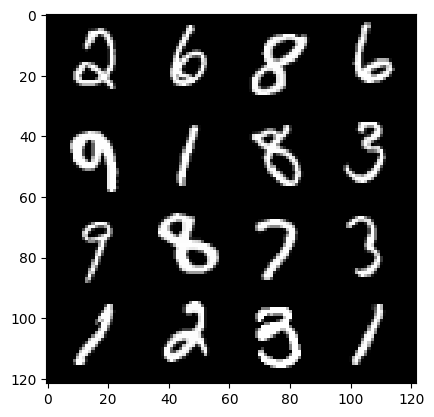

4: step 2100 / Gen loss: 3.834809006055197 / disc_loss: 0.03319057969376444


  0%|          | 0/469 [00:00<?, ?it/s]

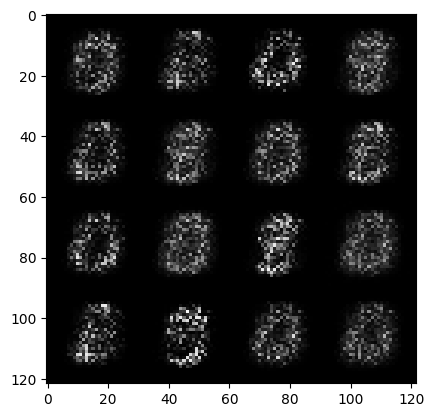

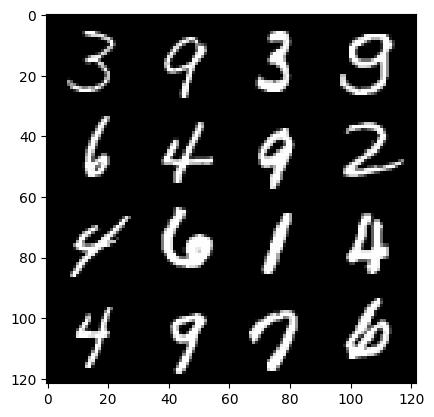

5: step 2400 / Gen loss: 4.1496499379475935 / disc_loss: 0.029602778734018394


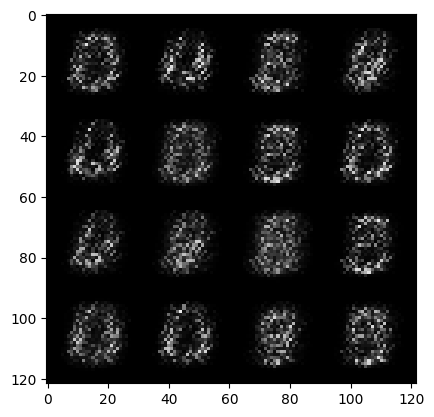

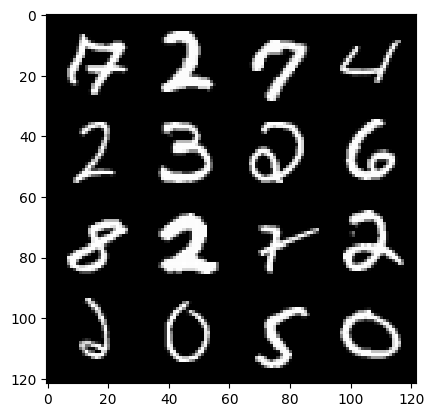

5: step 2700 / Gen loss: 4.6019110202789255 / disc_loss: 0.023170040867601816


  0%|          | 0/469 [00:00<?, ?it/s]

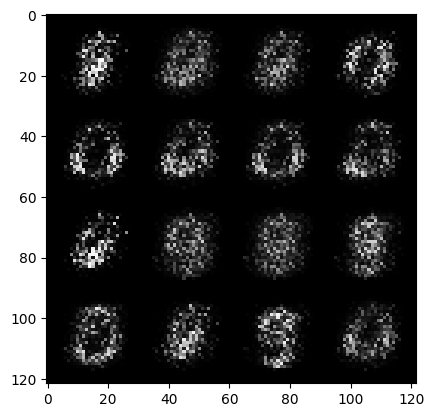

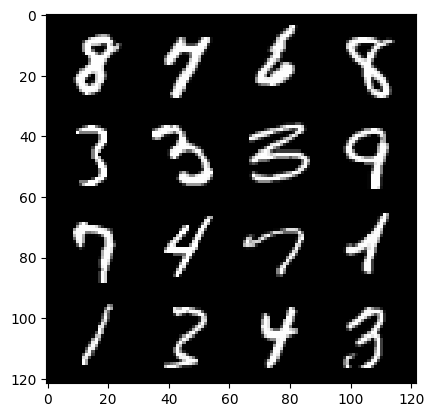

6: step 3000 / Gen loss: 4.931543906529741 / disc_loss: 0.02229204996488987


  0%|          | 0/469 [00:00<?, ?it/s]

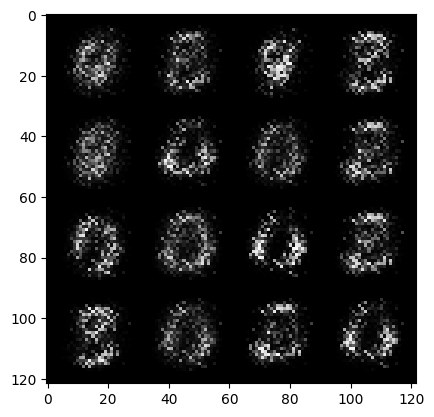

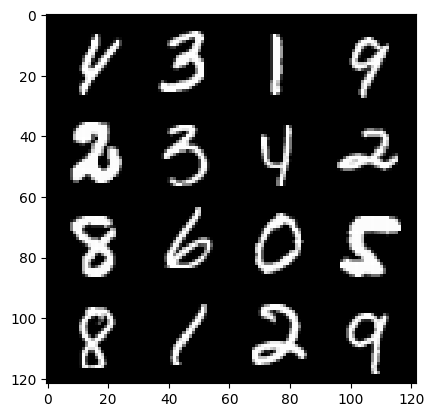

7: step 3300 / Gen loss: 5.224630950291949 / disc_loss: 0.021460744061817732


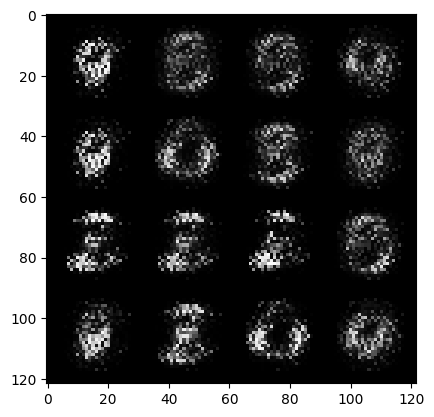

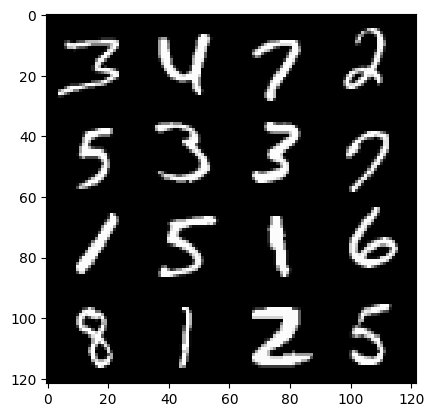

7: step 3600 / Gen loss: 5.87263445854187 / disc_loss: 0.017821602304466076


  0%|          | 0/469 [00:00<?, ?it/s]

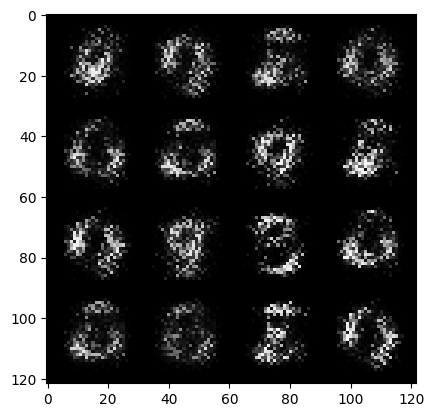

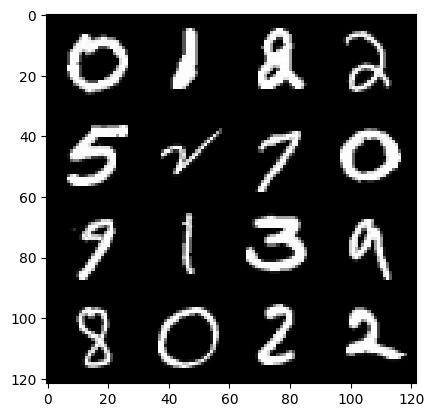

8: step 3900 / Gen loss: 5.764416554768878 / disc_loss: 0.016523540103808042


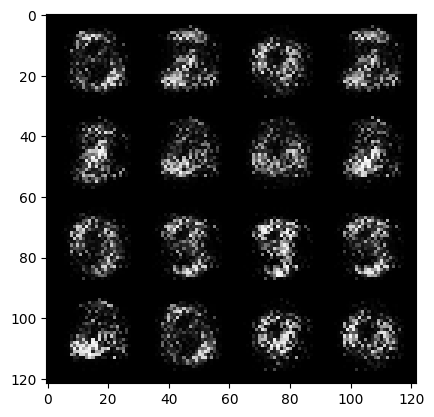

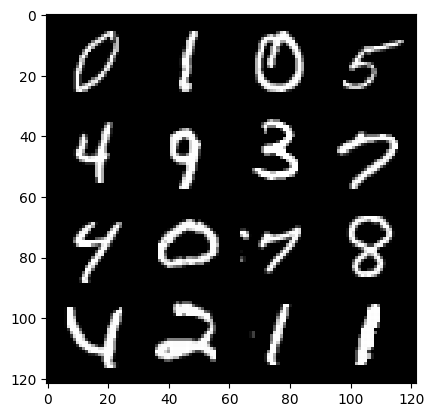

8: step 4200 / Gen loss: 5.544405706723529 / disc_loss: 0.015073377171841774


  0%|          | 0/469 [00:00<?, ?it/s]

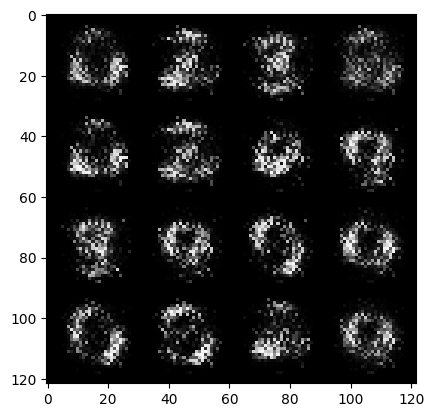

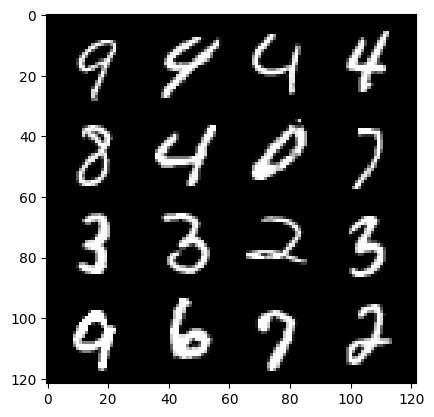

9: step 4500 / Gen loss: 5.902967303593954 / disc_loss: 0.013954863933225467


  0%|          | 0/469 [00:00<?, ?it/s]

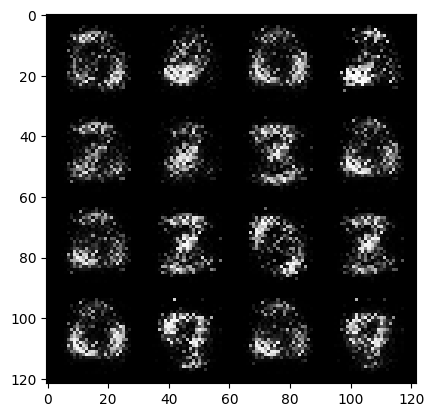

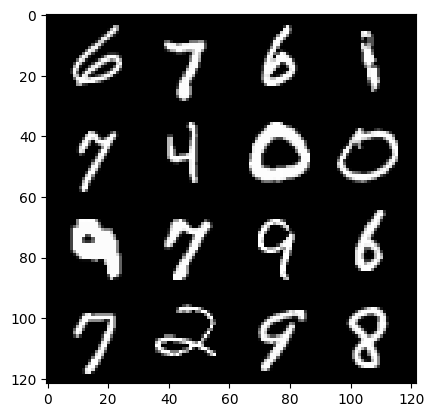

10: step 4800 / Gen loss: 6.5043778832753505 / disc_loss: 0.011986065963283186


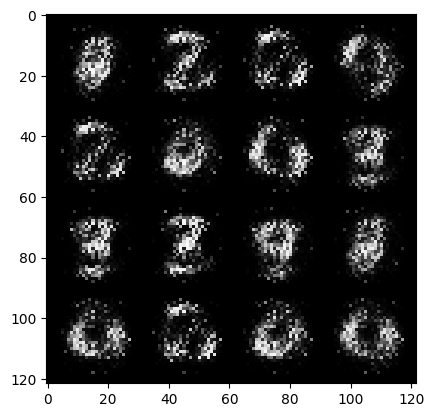

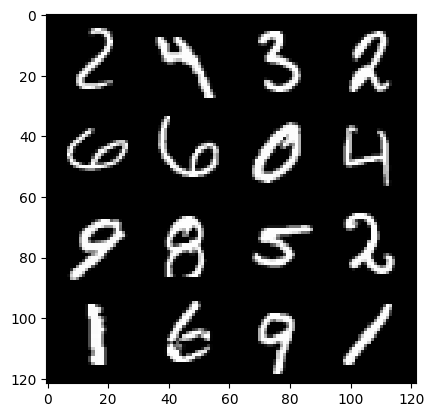

10: step 5100 / Gen loss: 6.392925294240316 / disc_loss: 0.011762921888536454


  0%|          | 0/469 [00:00<?, ?it/s]

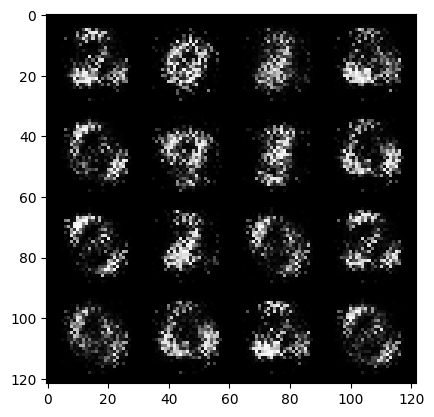

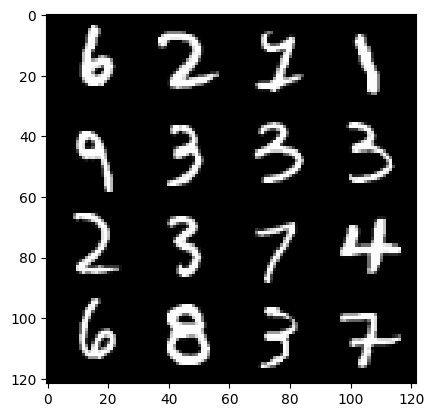

11: step 5400 / Gen loss: 6.35832615057628 / disc_loss: 0.011447303949389614


  0%|          | 0/469 [00:00<?, ?it/s]

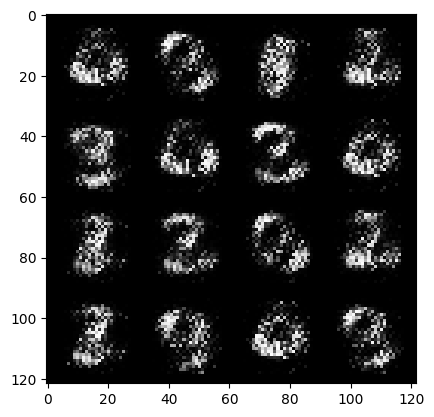

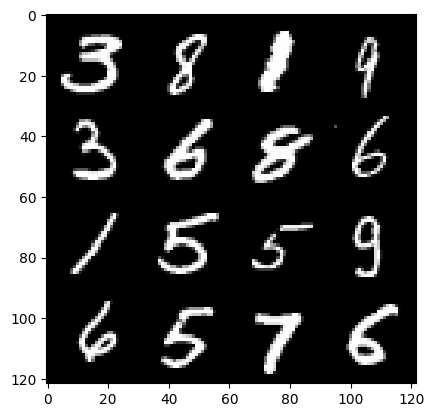

12: step 5700 / Gen loss: 6.3360696140925095 / disc_loss: 0.008827699619190148


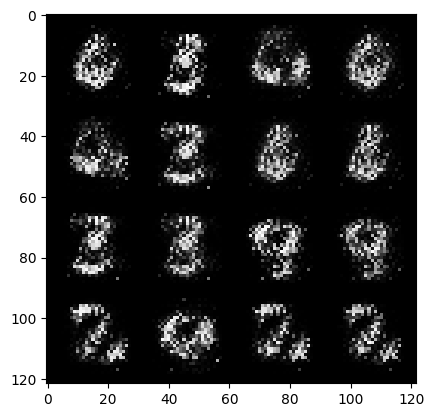

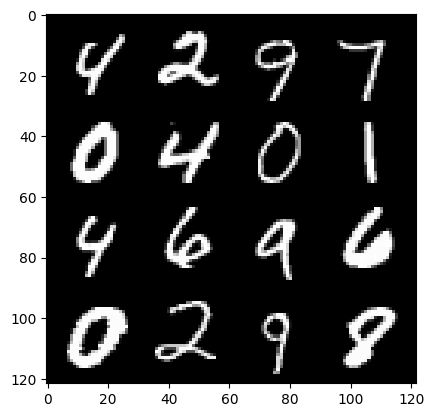

12: step 6000 / Gen loss: 6.869396828015648 / disc_loss: 0.008155705858953305


  0%|          | 0/469 [00:00<?, ?it/s]

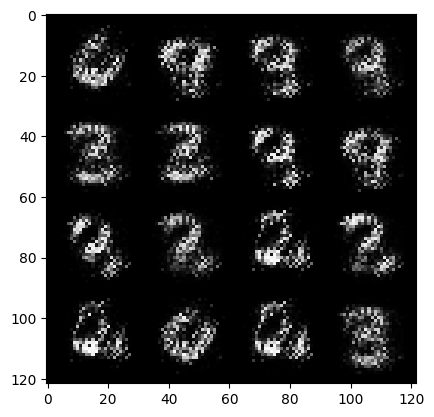

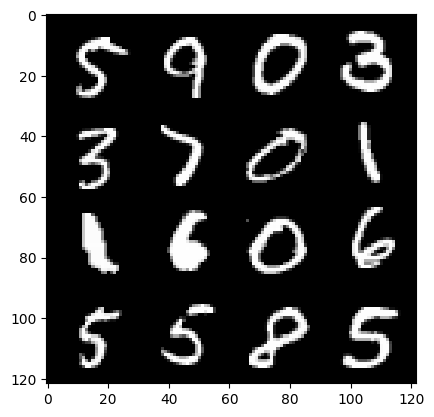

13: step 6300 / Gen loss: 7.0745288054148325 / disc_loss: 0.010084249173135806


  0%|          | 0/469 [00:00<?, ?it/s]

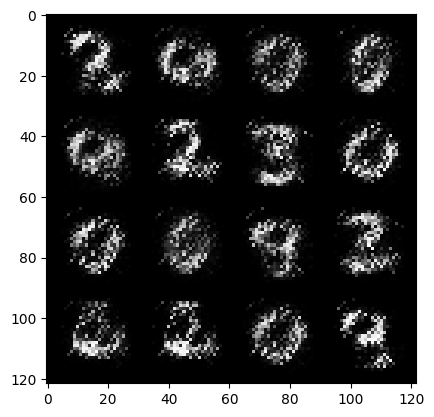

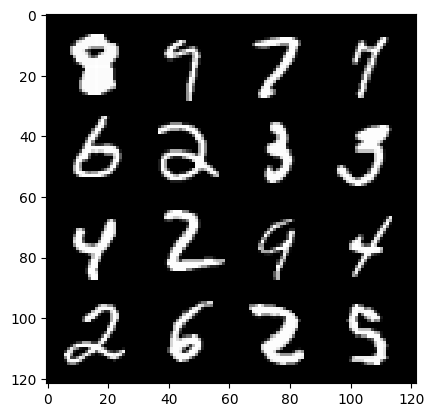

14: step 6600 / Gen loss: 7.2462838268280025 / disc_loss: 0.009691556418159353


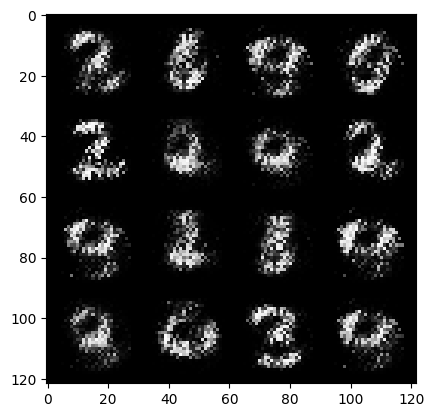

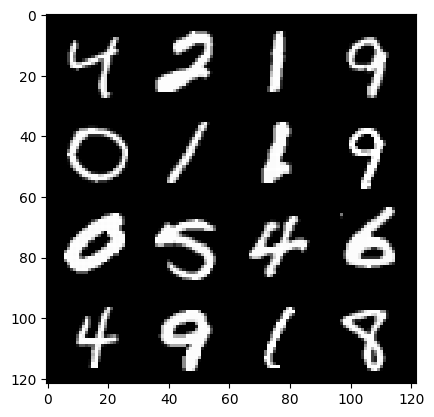

14: step 6900 / Gen loss: 7.038956538836163 / disc_loss: 0.011518025226735817


  0%|          | 0/469 [00:00<?, ?it/s]

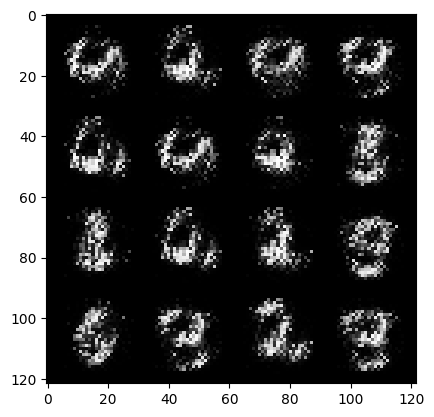

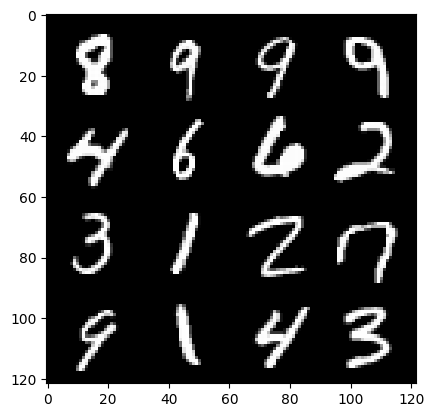

15: step 7200 / Gen loss: 6.75085489114126 / disc_loss: 0.01016006191493944


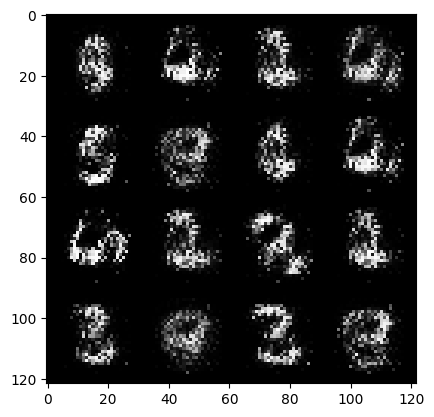

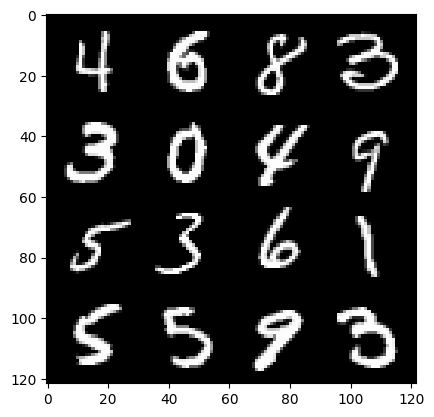

15: step 7500 / Gen loss: 7.138468054135644 / disc_loss: 0.007858425231728078


  0%|          | 0/469 [00:00<?, ?it/s]

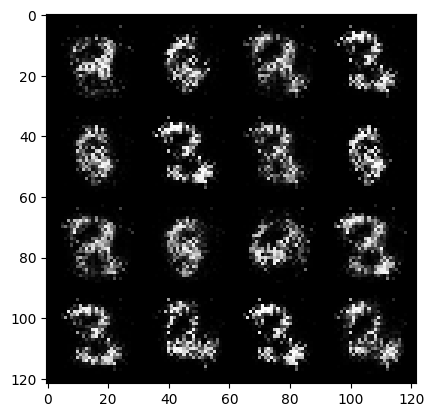

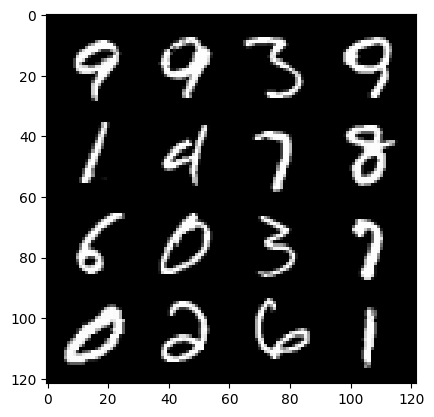

16: step 7800 / Gen loss: 7.360845193862913 / disc_loss: 0.007602043001291659


  0%|          | 0/469 [00:00<?, ?it/s]

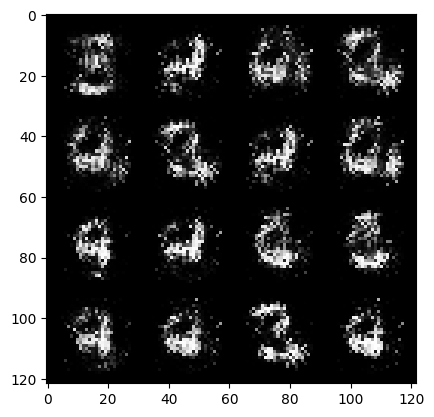

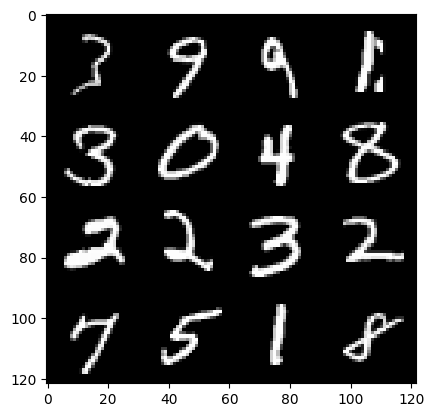

17: step 8100 / Gen loss: 7.761652787526451 / disc_loss: 0.008670683608700828


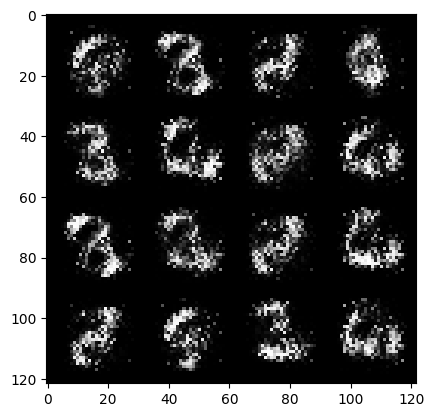

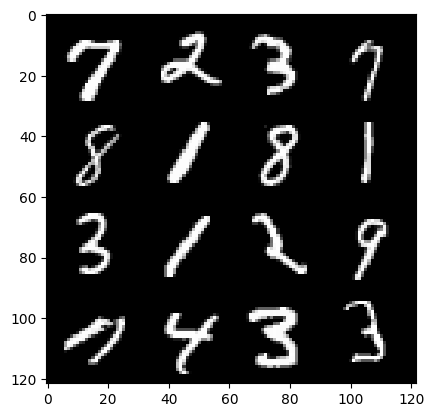

17: step 8400 / Gen loss: 7.521929429372154 / disc_loss: 0.01008756029109159


  0%|          | 0/469 [00:00<?, ?it/s]

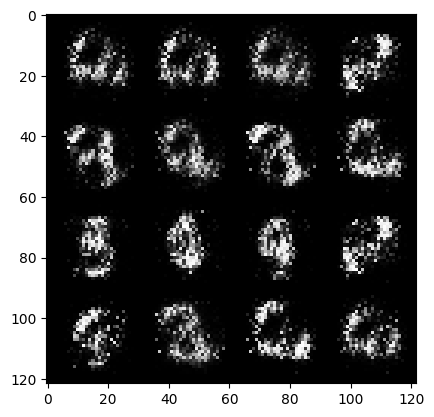

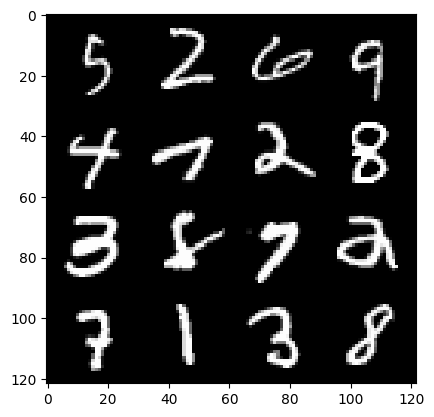

18: step 8700 / Gen loss: 7.610941942532865 / disc_loss: 0.009601810839958484


  0%|          | 0/469 [00:00<?, ?it/s]

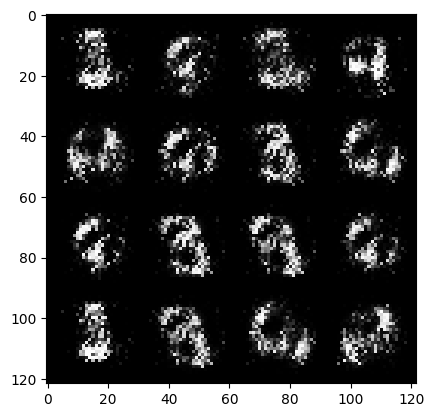

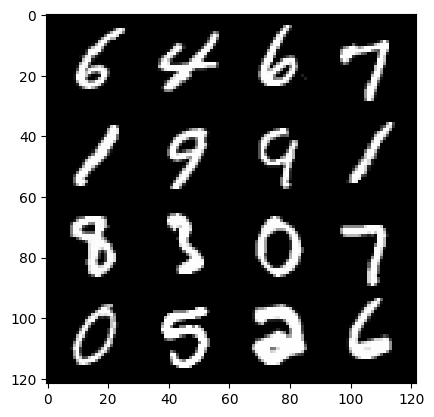

19: step 9000 / Gen loss: 7.596300198237098 / disc_loss: 0.009624340570687


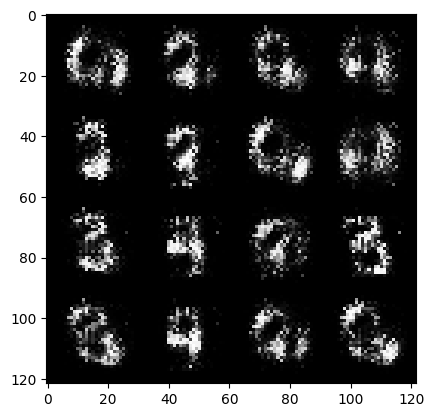

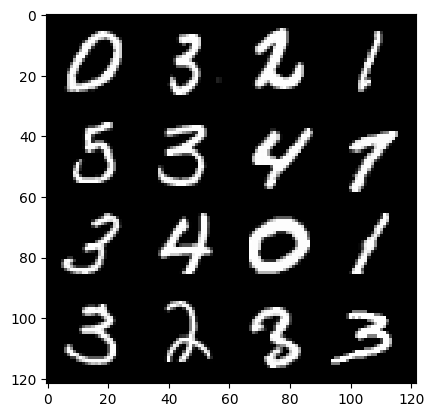

19: step 9300 / Gen loss: 7.618218426704403 / disc_loss: 0.010499210645599909


  0%|          | 0/469 [00:00<?, ?it/s]

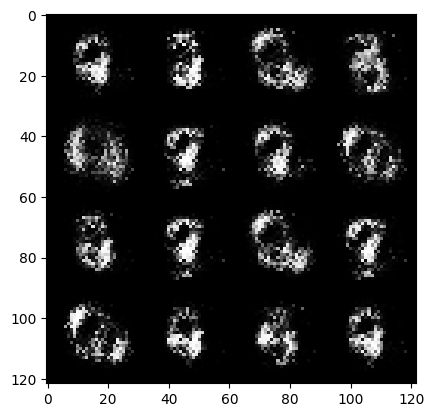

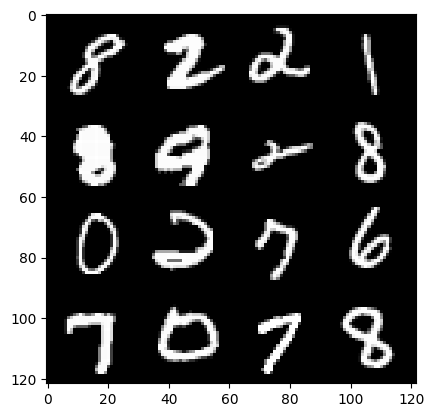

20: step 9600 / Gen loss: 7.56457156499227 / disc_loss: 0.010293026492387678


  0%|          | 0/469 [00:00<?, ?it/s]

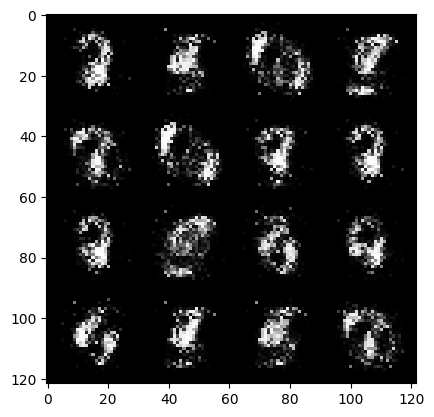

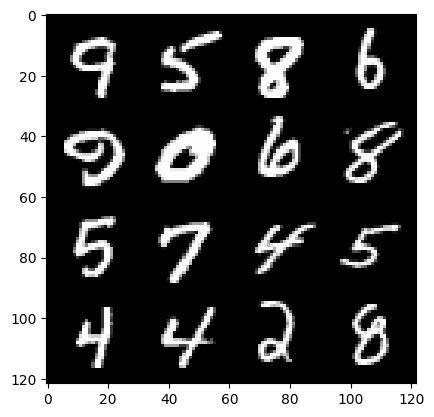

21: step 9900 / Gen loss: 7.250652270317072 / disc_loss: 0.010866976939917849


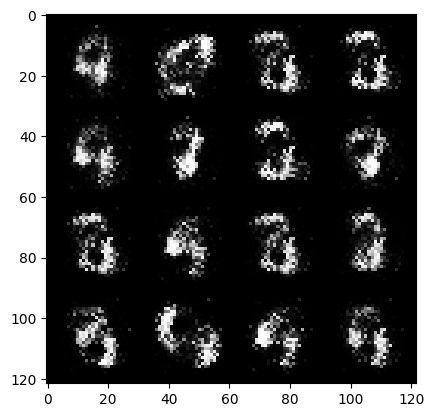

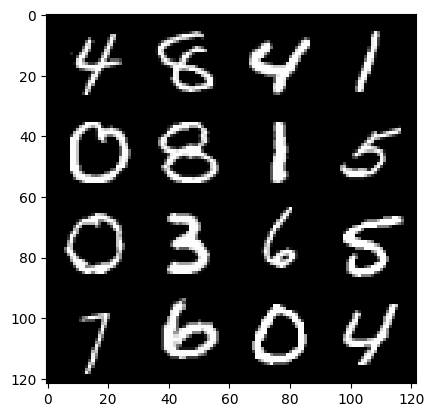

21: step 10200 / Gen loss: 7.5089123010635355 / disc_loss: 0.010873639027898507


  0%|          | 0/469 [00:00<?, ?it/s]

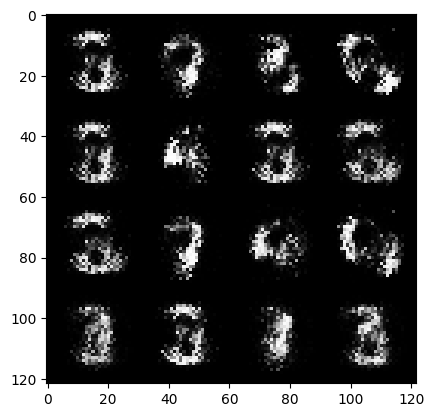

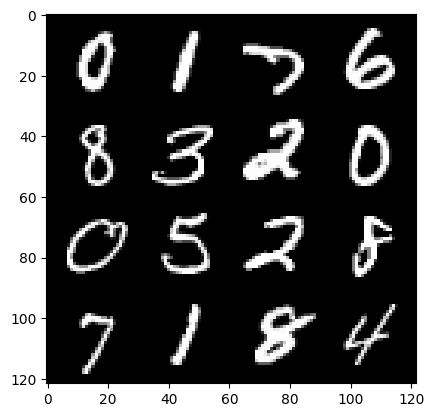

22: step 10500 / Gen loss: 7.50728791077932 / disc_loss: 0.011613134089857334


  0%|          | 0/469 [00:00<?, ?it/s]

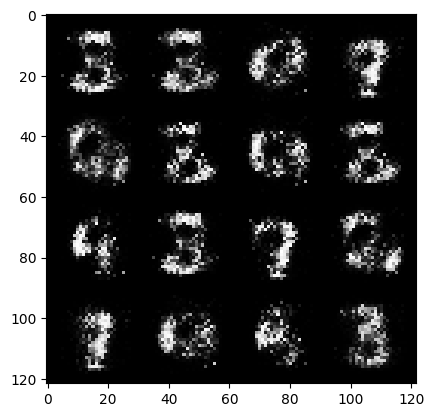

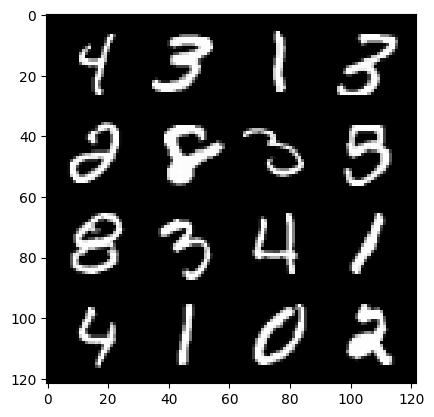

23: step 10800 / Gen loss: 7.04969388008118 / disc_loss: 0.013307353489799419


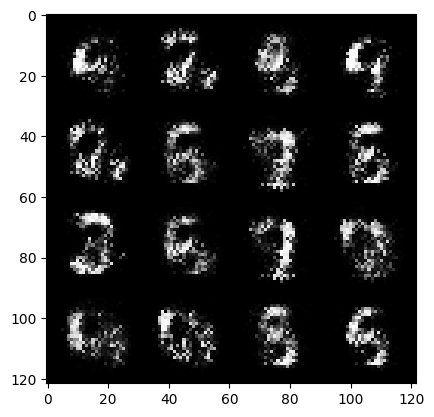

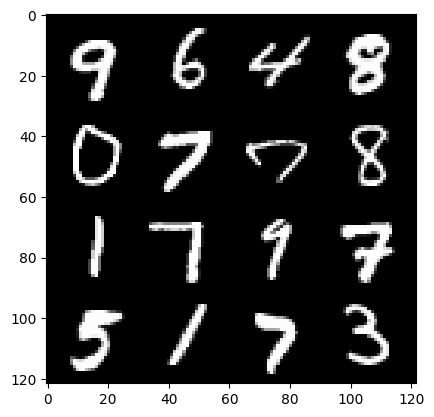

23: step 11100 / Gen loss: 7.590750676790876 / disc_loss: 0.011099105773804088


  0%|          | 0/469 [00:00<?, ?it/s]

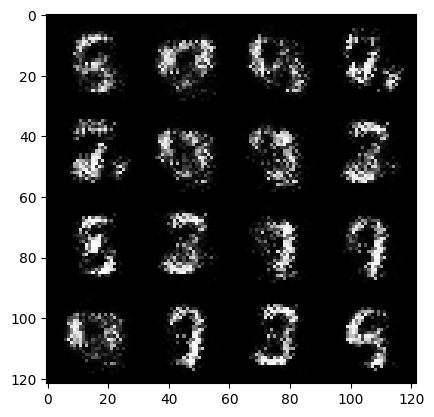

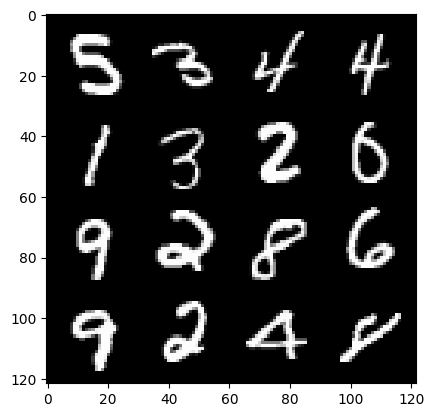

24: step 11400 / Gen loss: 7.6019760592778525 / disc_loss: 0.012569630125847957


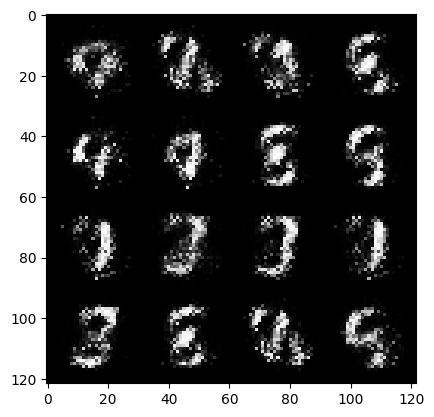

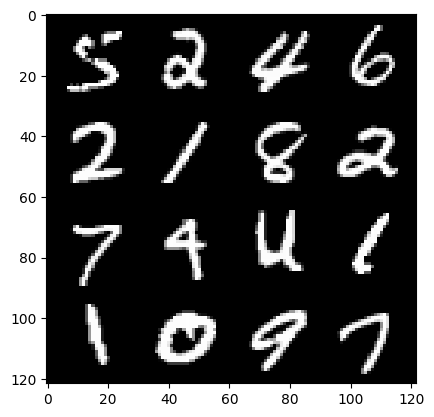

24: step 11700 / Gen loss: 7.347279621760049 / disc_loss: 0.01138281082424025


  0%|          | 0/469 [00:00<?, ?it/s]

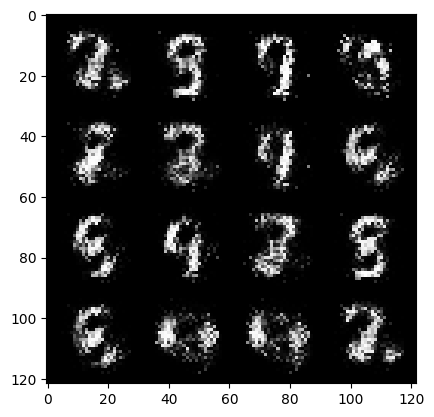

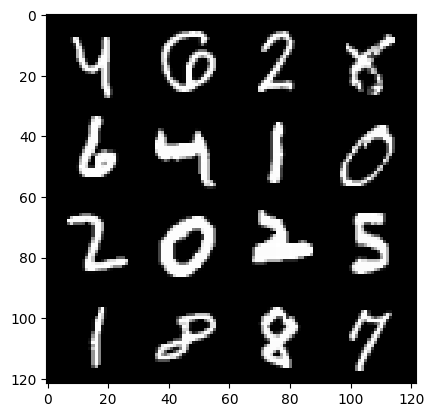

25: step 12000 / Gen loss: 7.199015844662983 / disc_loss: 0.012424490215101587


  0%|          | 0/469 [00:00<?, ?it/s]

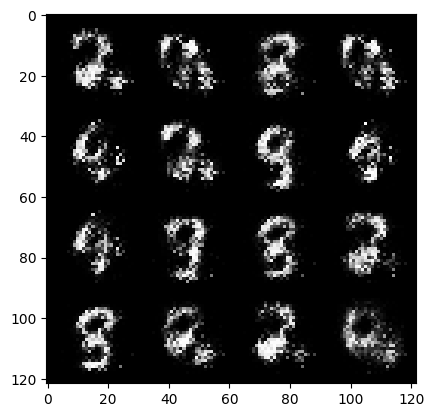

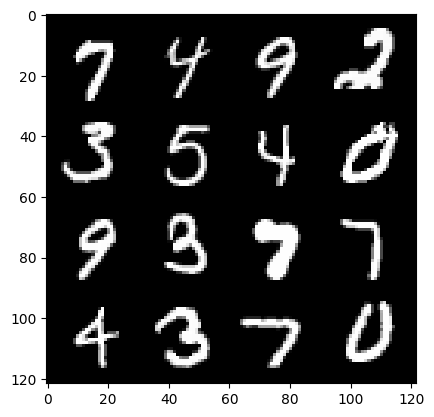

26: step 12300 / Gen loss: 7.347066138585405 / disc_loss: 0.011027767556952318


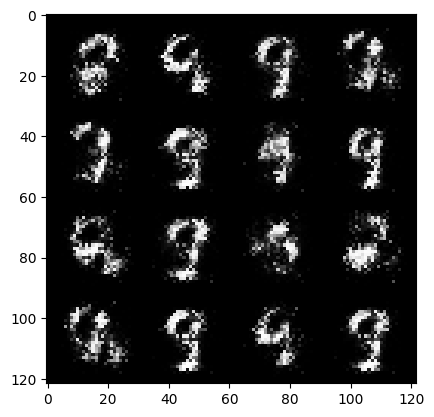

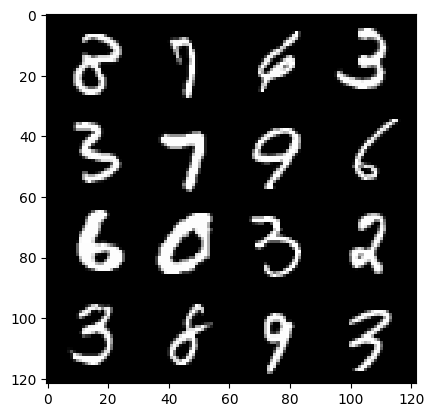

26: step 12600 / Gen loss: 7.695163606007892 / disc_loss: 0.010851858040162667


  0%|          | 0/469 [00:00<?, ?it/s]

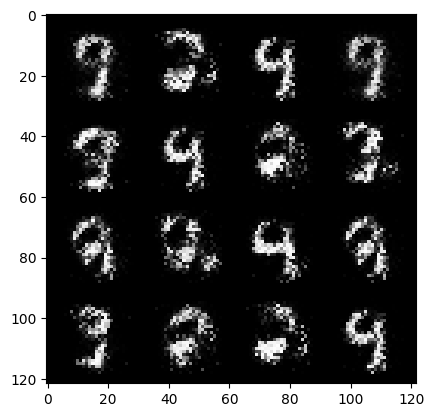

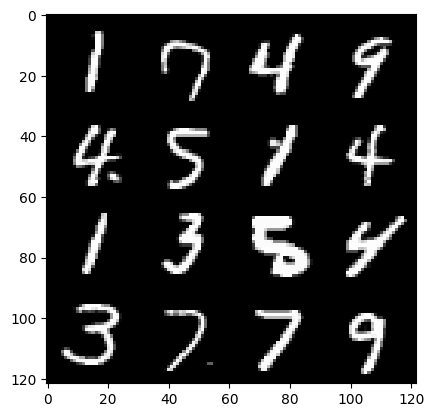

27: step 12900 / Gen loss: 7.188555010159809 / disc_loss: 0.014695466422320658


  0%|          | 0/469 [00:00<?, ?it/s]

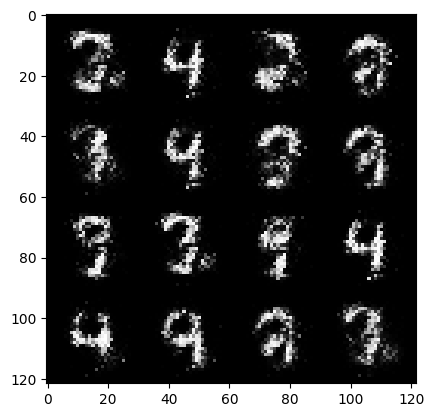

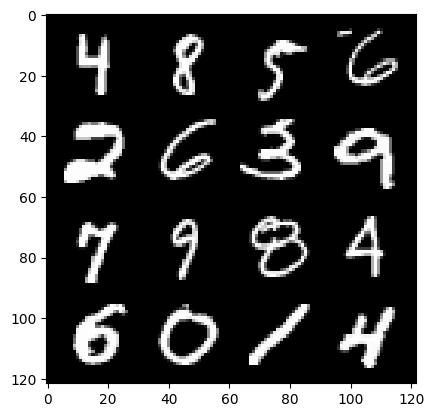

28: step 13200 / Gen loss: 7.0970032914479555 / disc_loss: 0.015178270847536627


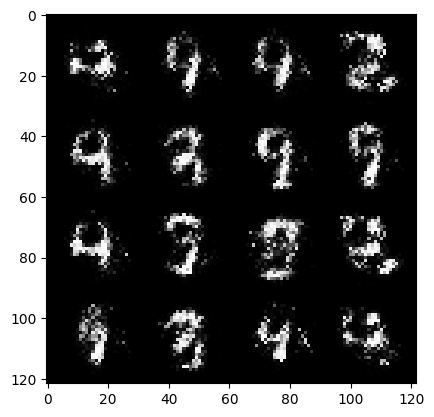

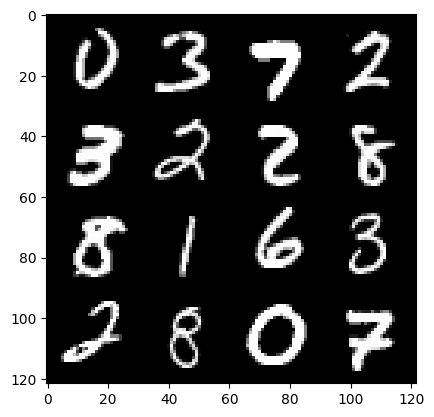

28: step 13500 / Gen loss: 6.714430468877155 / disc_loss: 0.01621727749084433


  0%|          | 0/469 [00:00<?, ?it/s]

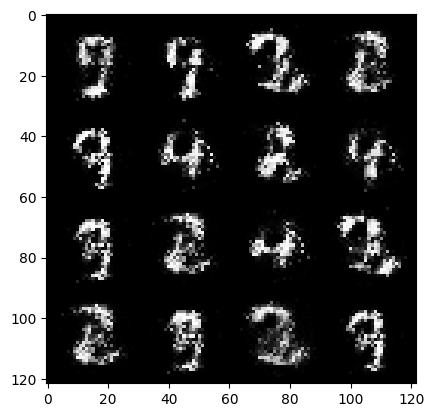

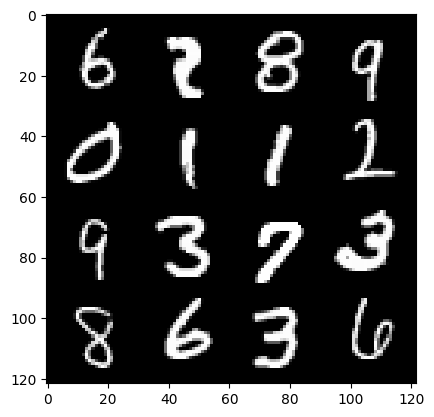

29: step 13800 / Gen loss: 6.9193072191874165 / disc_loss: 0.015002643961925057


  0%|          | 0/469 [00:00<?, ?it/s]

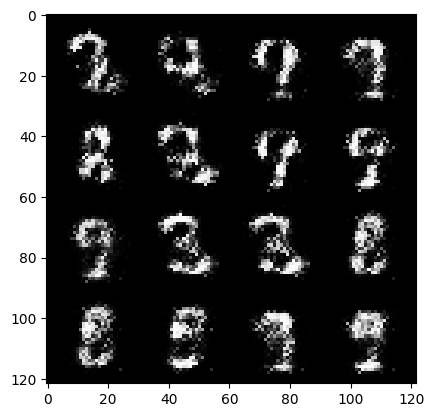

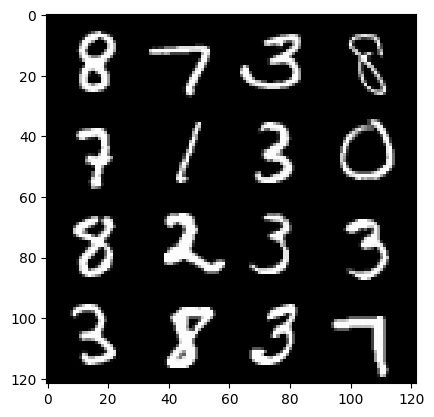

30: step 14100 / Gen loss: 6.832813541094463 / disc_loss: 0.016848494621614616


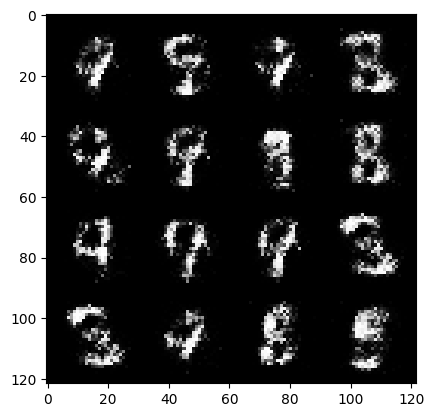

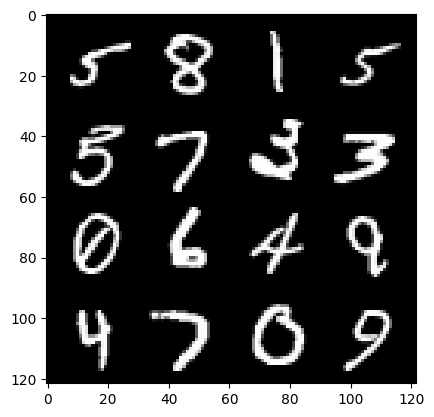

30: step 14400 / Gen loss: 6.78324848016103 / disc_loss: 0.018468579601806902


  0%|          | 0/469 [00:00<?, ?it/s]

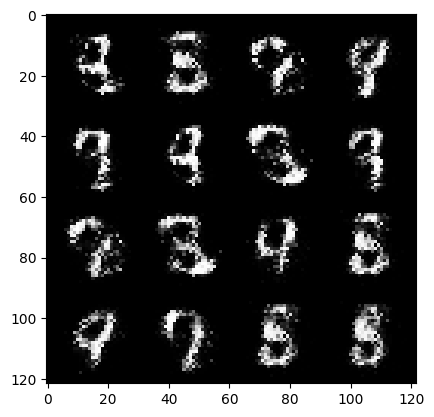

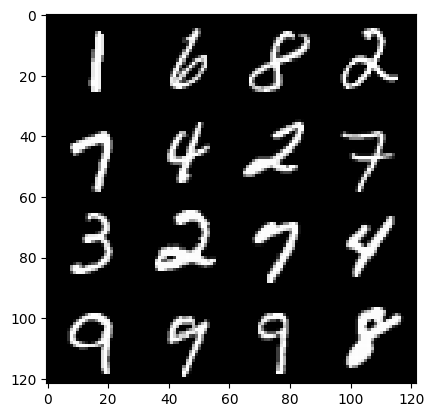

31: step 14700 / Gen loss: 6.7763818868001255 / disc_loss: 0.01870145408747096


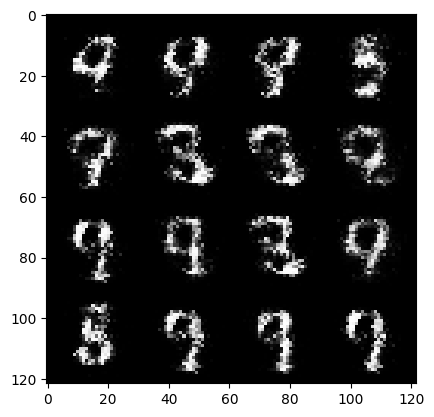

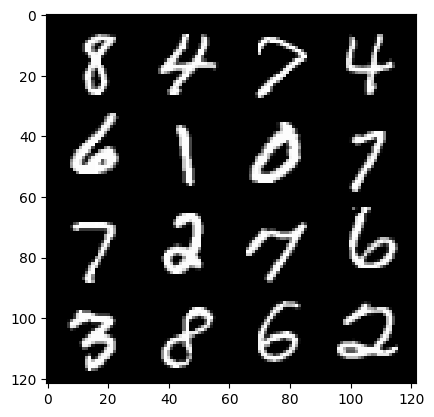

31: step 15000 / Gen loss: 6.6457540591557835 / disc_loss: 0.01677027616184205


  0%|          | 0/469 [00:00<?, ?it/s]

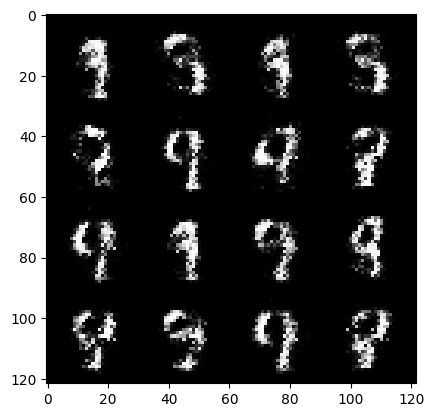

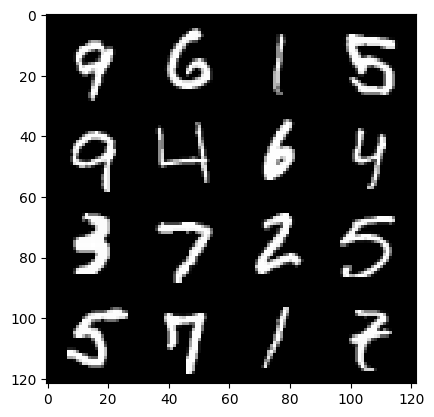

32: step 15300 / Gen loss: 6.356889692942299 / disc_loss: 0.023067497932352136


  0%|          | 0/469 [00:00<?, ?it/s]

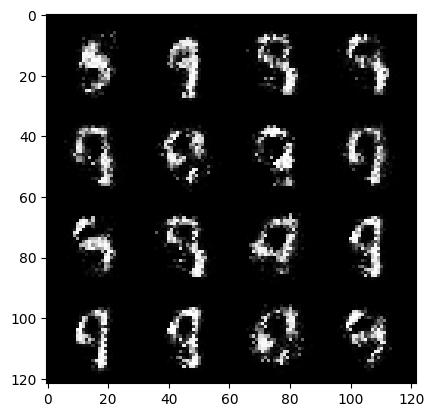

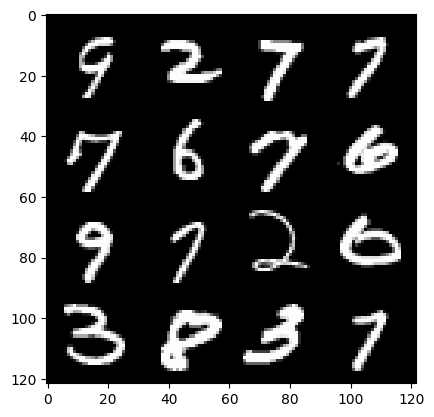

33: step 15600 / Gen loss: 6.3777881240844705 / disc_loss: 0.02208267393444354


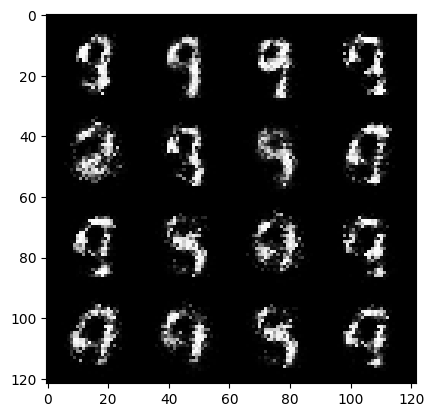

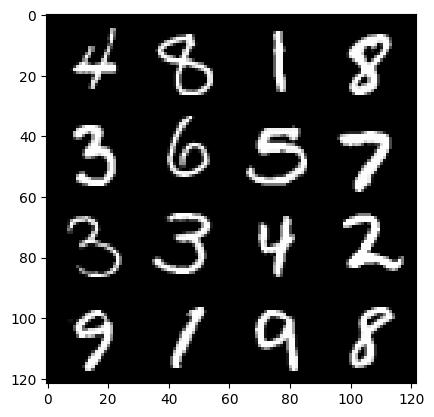

33: step 15900 / Gen loss: 5.924770080248513 / disc_loss: 0.023811010457575325


  0%|          | 0/469 [00:00<?, ?it/s]

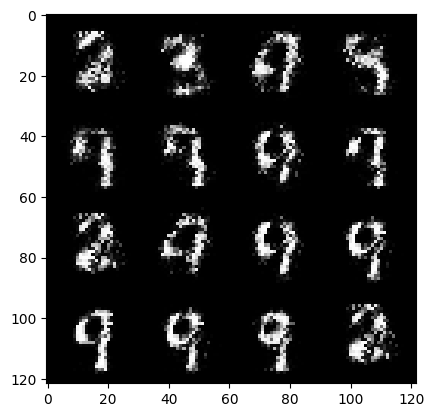

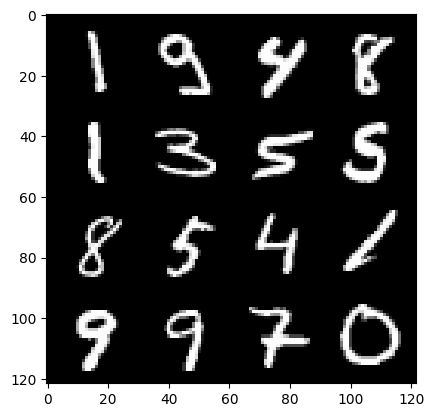

34: step 16200 / Gen loss: 6.087773396174113 / disc_loss: 0.028079797698495317


  0%|          | 0/469 [00:00<?, ?it/s]

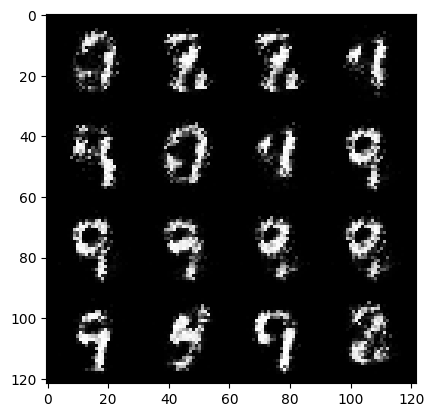

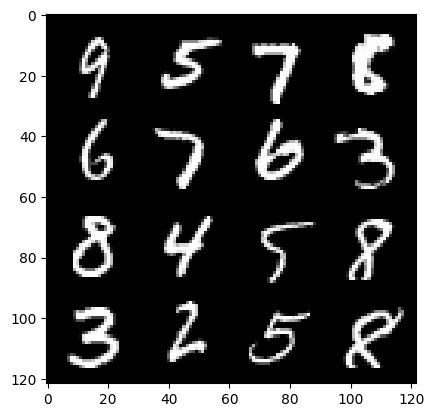

35: step 16500 / Gen loss: 6.504361612002056 / disc_loss: 0.023330681427226715


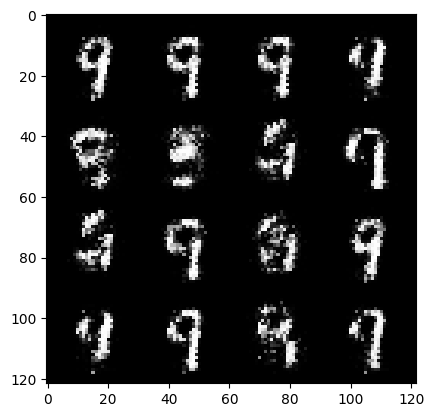

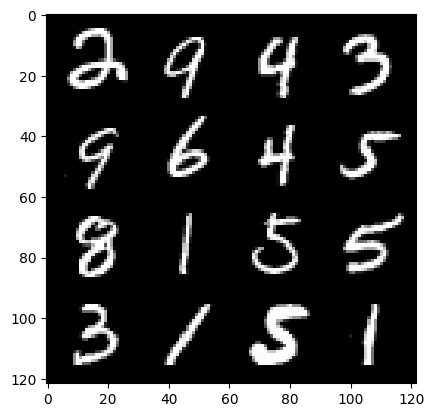

35: step 16800 / Gen loss: 6.343019676208499 / disc_loss: 0.02623009474171946


  0%|          | 0/469 [00:00<?, ?it/s]

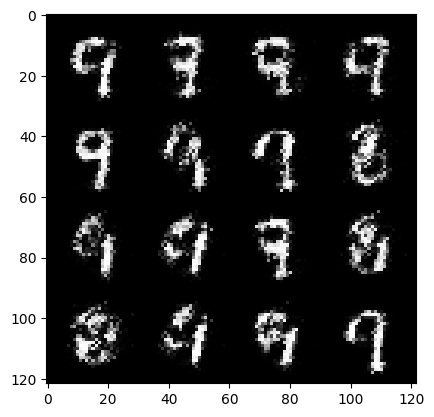

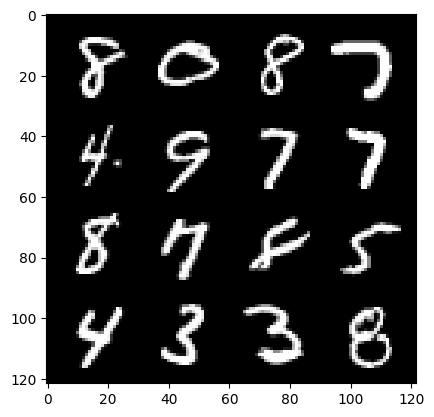

36: step 17100 / Gen loss: 6.000515236854549 / disc_loss: 0.024940428387684125


  0%|          | 0/469 [00:00<?, ?it/s]

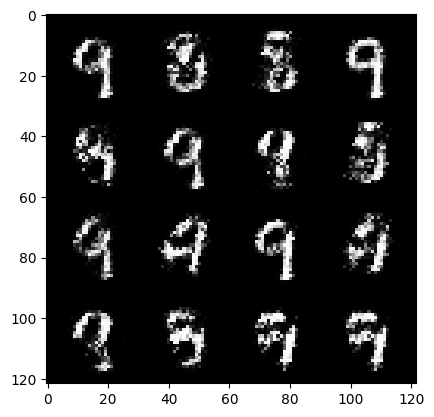

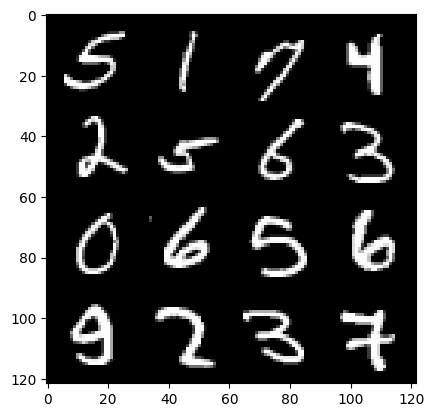

37: step 17400 / Gen loss: 6.086438703536987 / disc_loss: 0.024110403582453723


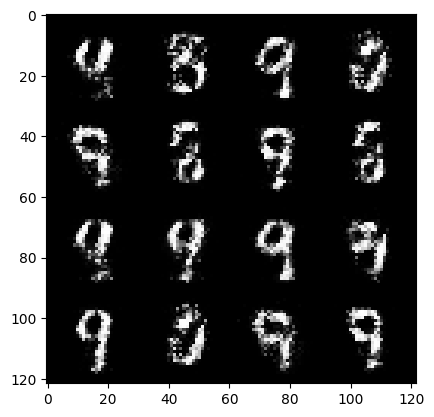

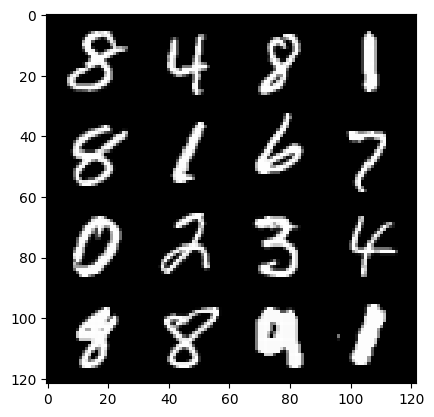

37: step 17700 / Gen loss: 5.919544712702433 / disc_loss: 0.03396936232379329


  0%|          | 0/469 [00:00<?, ?it/s]

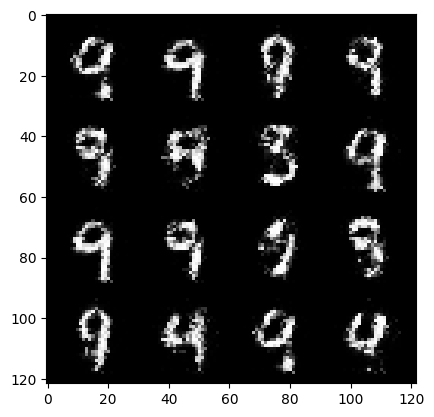

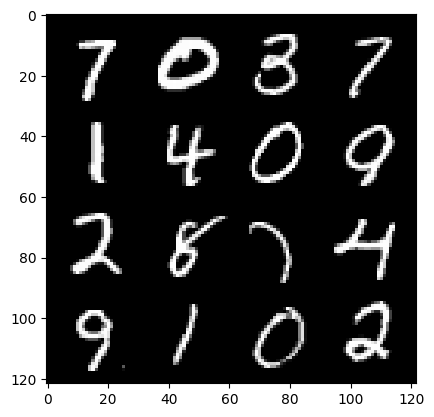

38: step 18000 / Gen loss: 5.634792675971988 / disc_loss: 0.042205079325164346


  0%|          | 0/469 [00:00<?, ?it/s]

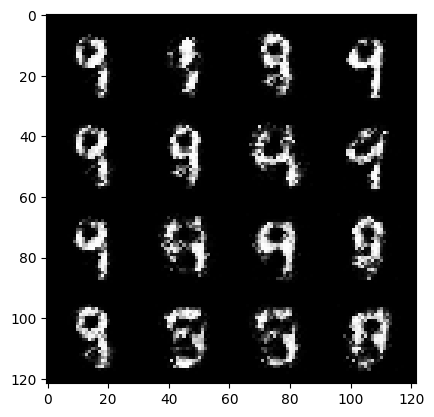

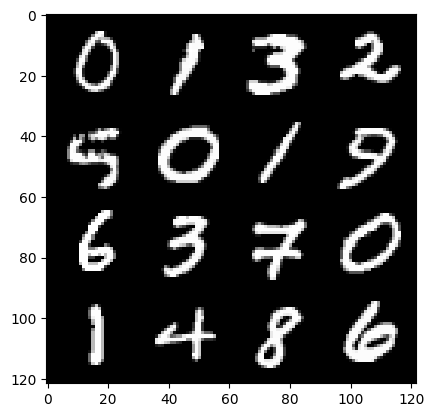

39: step 18300 / Gen loss: 5.869365220069887 / disc_loss: 0.04226371928739049


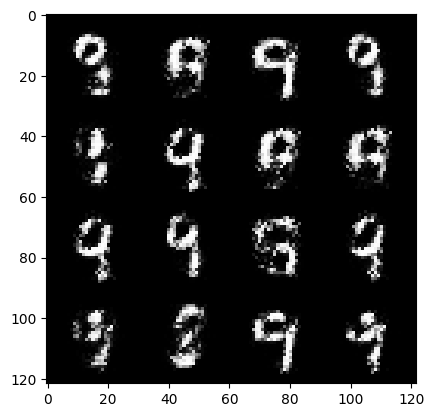

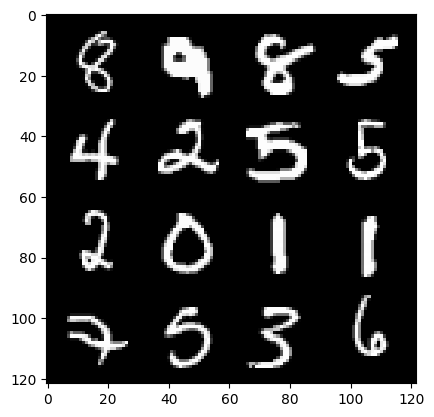

39: step 18600 / Gen loss: 5.424896823565164 / disc_loss: 0.04611234541516749


  0%|          | 0/469 [00:00<?, ?it/s]

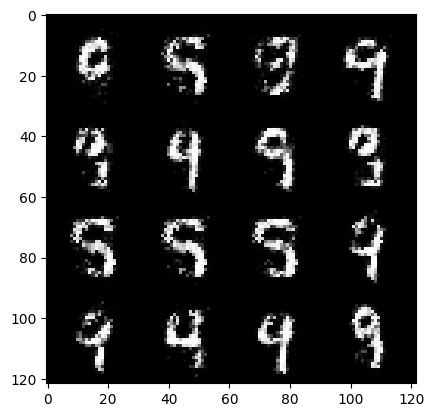

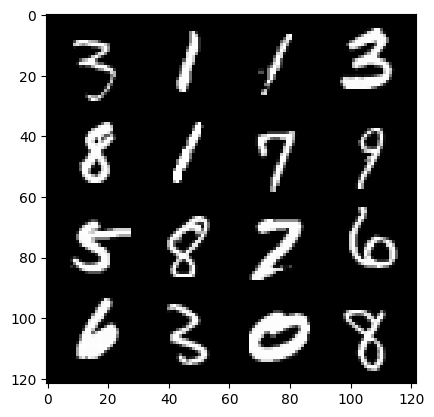

40: step 18900 / Gen loss: 5.611516265869139 / disc_loss: 0.03710801099116604


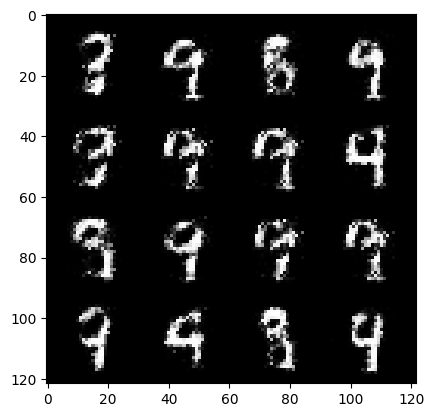

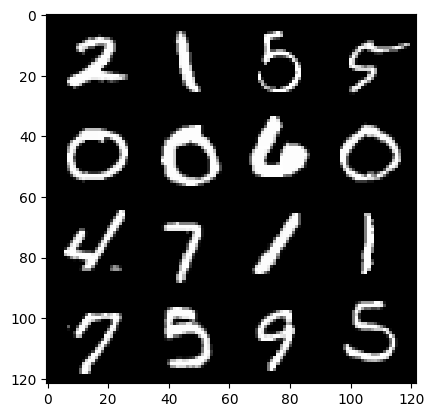

40: step 19200 / Gen loss: 5.3322366984685265 / disc_loss: 0.04515967478354772


  0%|          | 0/469 [00:00<?, ?it/s]

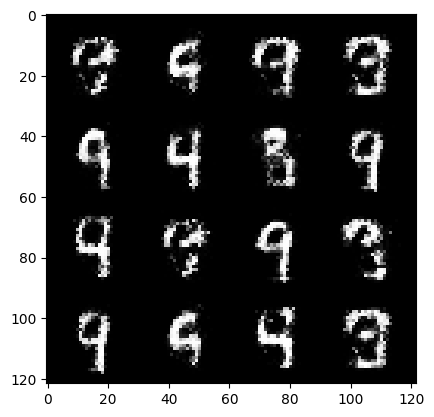

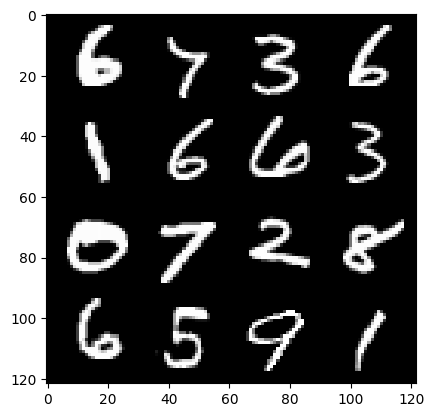

41: step 19500 / Gen loss: 5.180506490071616 / disc_loss: 0.05050554486612475


  0%|          | 0/469 [00:00<?, ?it/s]

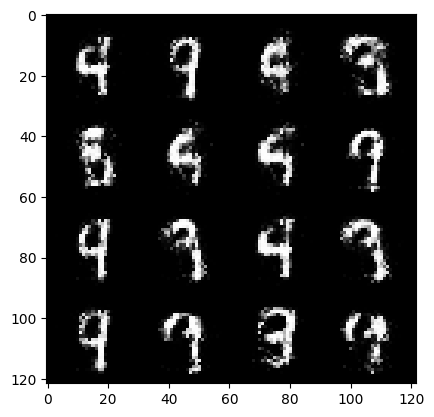

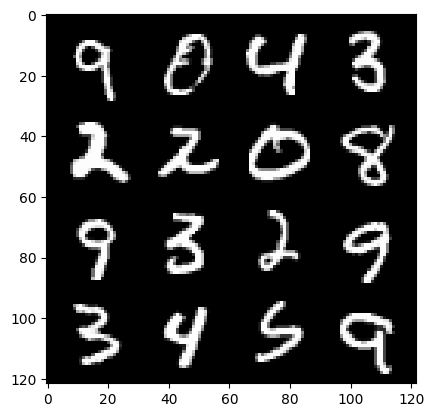

42: step 19800 / Gen loss: 5.113946757316591 / disc_loss: 0.041379231832300606


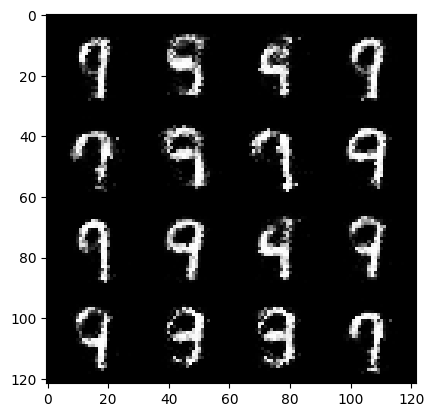

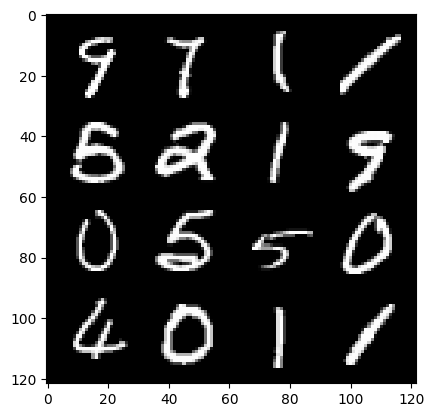

42: step 20100 / Gen loss: 5.428917398452756 / disc_loss: 0.04586975707672534


  0%|          | 0/469 [00:00<?, ?it/s]

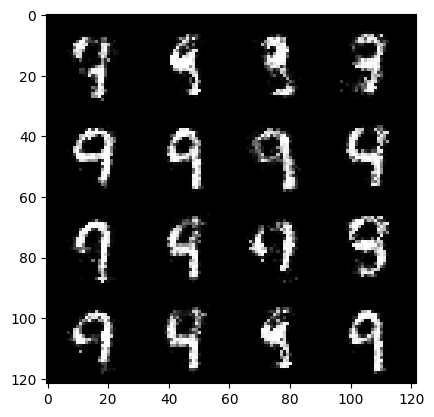

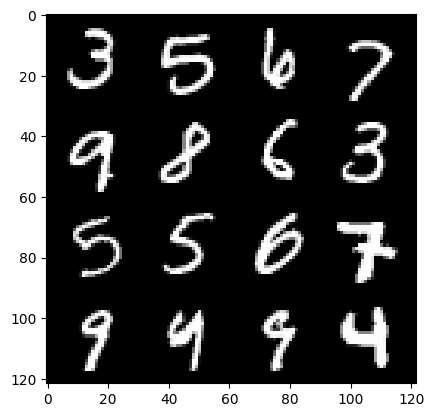

43: step 20400 / Gen loss: 5.44750495592753 / disc_loss: 0.05022440257482233


  0%|          | 0/469 [00:00<?, ?it/s]

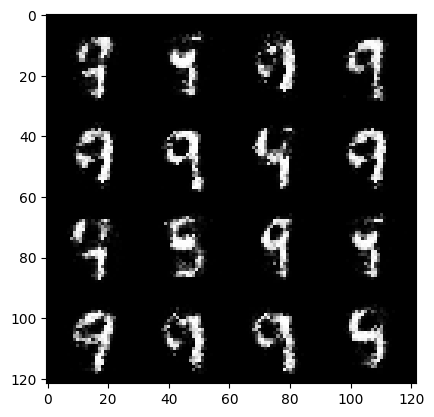

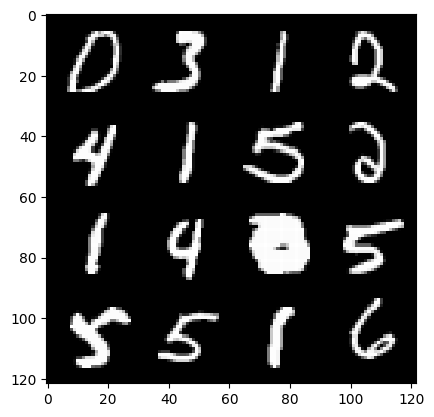

44: step 20700 / Gen loss: 4.969658420085907 / disc_loss: 0.0644177531357855


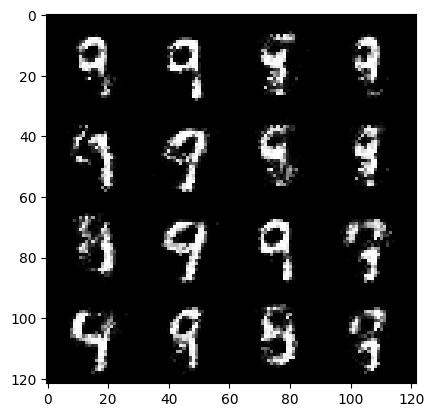

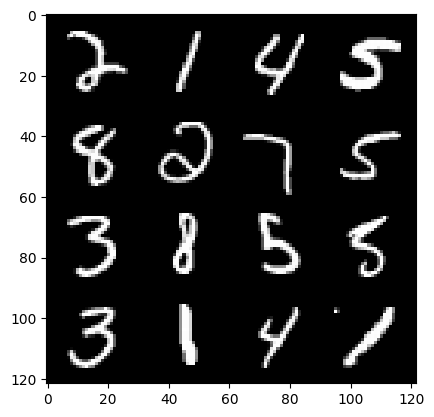

44: step 21000 / Gen loss: 4.797248345216118 / disc_loss: 0.06282124804953729


  0%|          | 0/469 [00:00<?, ?it/s]

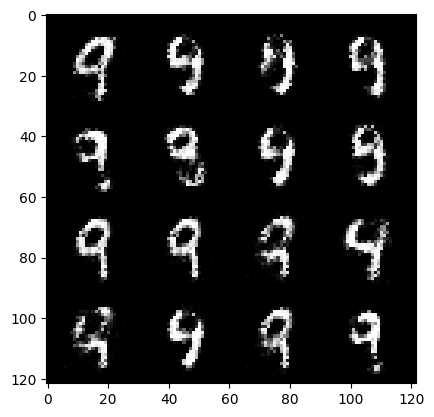

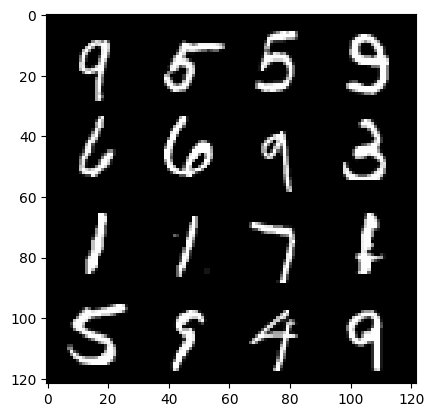

45: step 21300 / Gen loss: 4.809646570682526 / disc_loss: 0.06118015789426868


  0%|          | 0/469 [00:00<?, ?it/s]

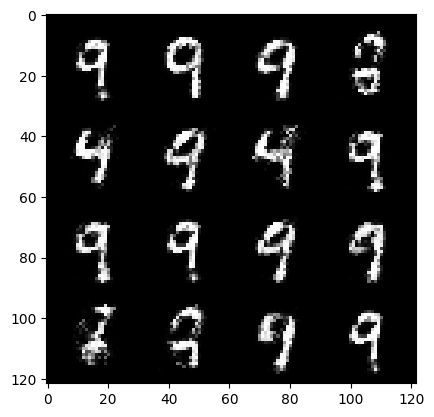

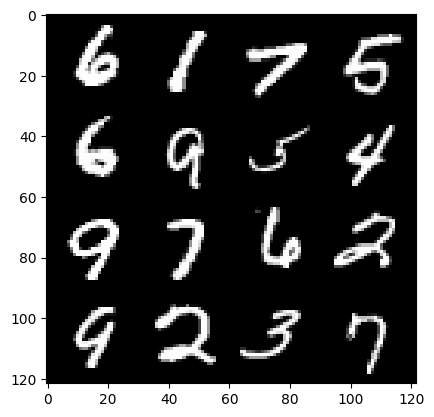

46: step 21600 / Gen loss: 4.970700759092964 / disc_loss: 0.060660363084947065


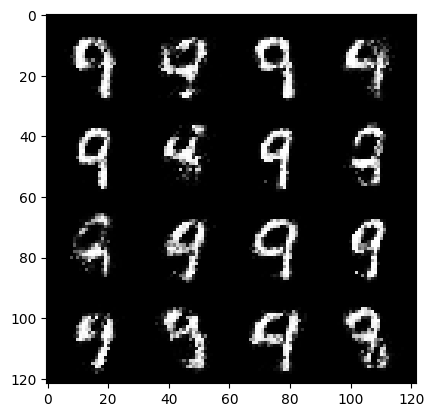

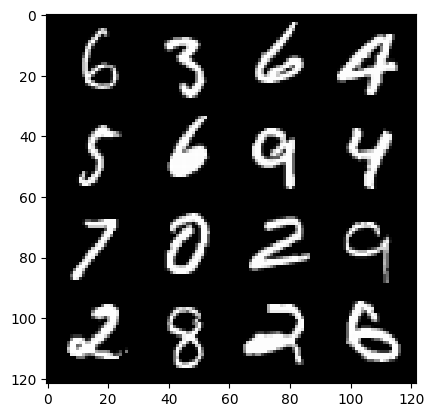

46: step 21900 / Gen loss: 4.887230207125343 / disc_loss: 0.07069606697497267


  0%|          | 0/469 [00:00<?, ?it/s]

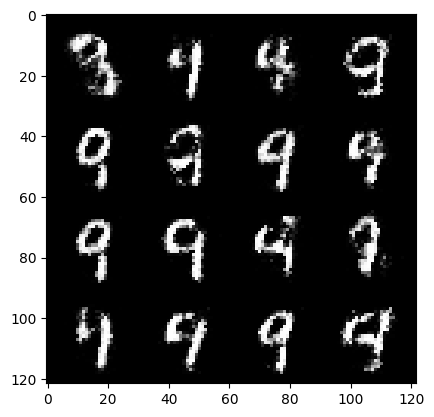

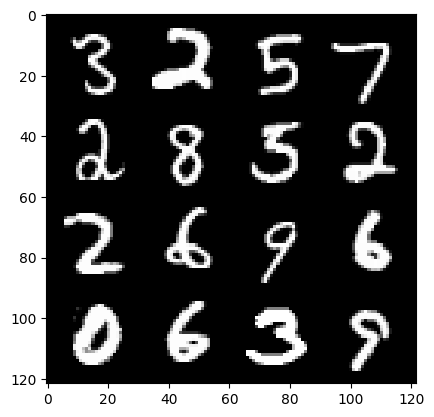

47: step 22200 / Gen loss: 4.928458873430889 / disc_loss: 0.059431978020196154


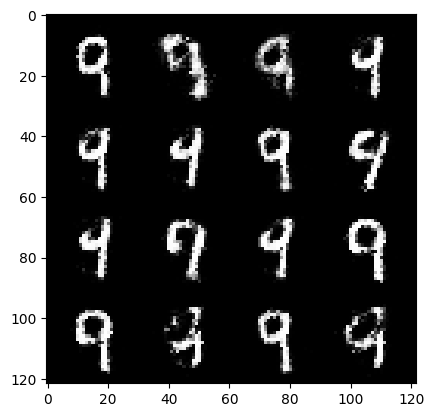

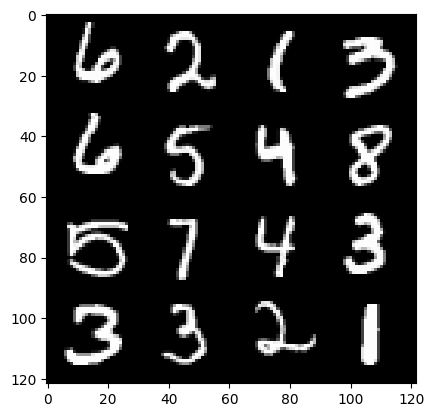

47: step 22500 / Gen loss: 4.770135687192284 / disc_loss: 0.06395096277197204


  0%|          | 0/469 [00:00<?, ?it/s]

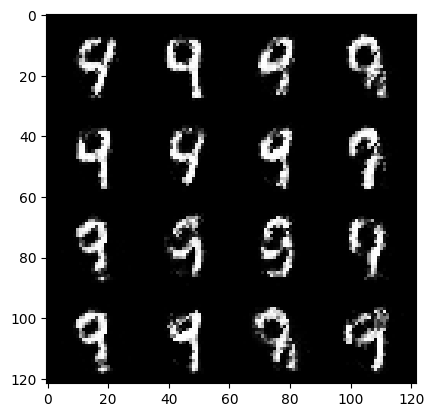

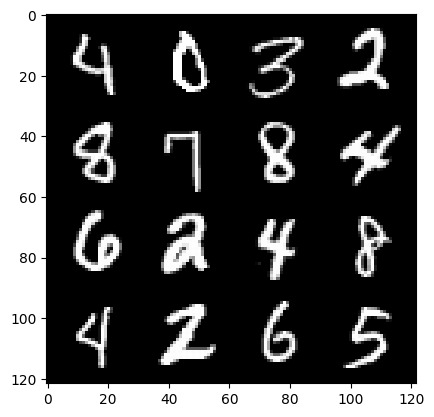

48: step 22800 / Gen loss: 4.781852800846103 / disc_loss: 0.06500945880388222


  0%|          | 0/469 [00:00<?, ?it/s]

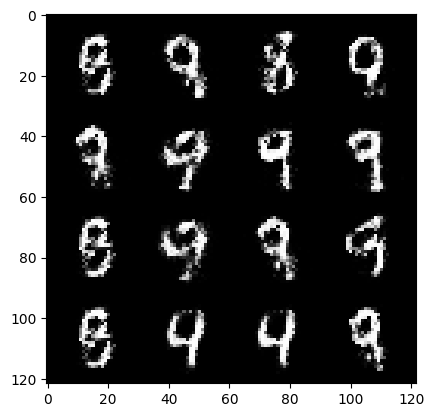

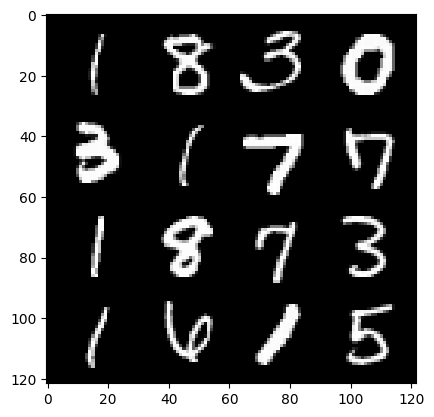

49: step 23100 / Gen loss: 4.419298333326976 / disc_loss: 0.08339793801618121


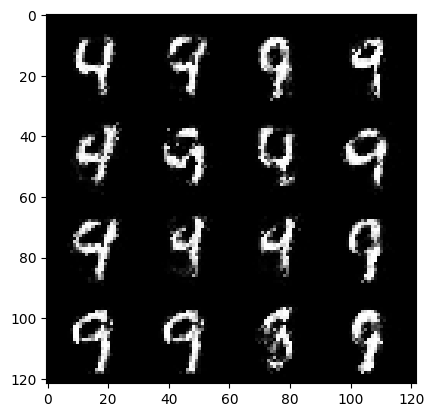

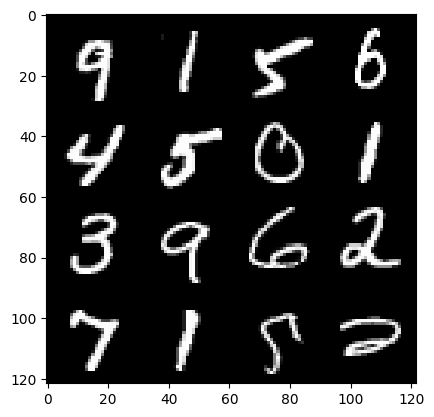

49: step 23400 / Gen loss: 4.562087729771929 / disc_loss: 0.0736376806224386


  0%|          | 0/469 [00:00<?, ?it/s]

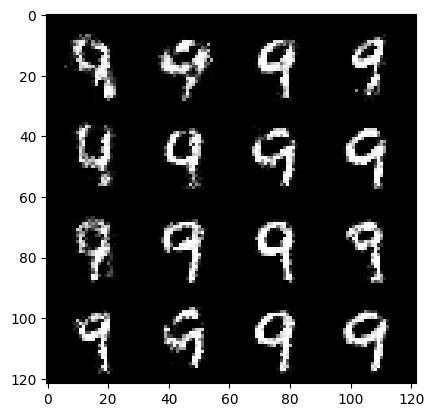

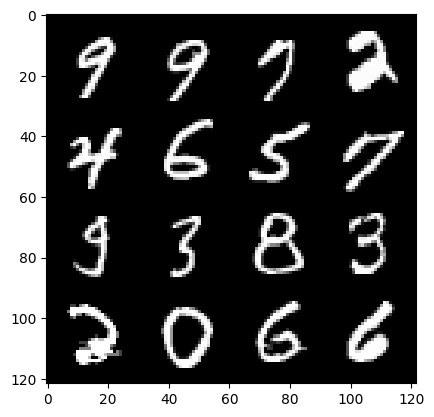

50: step 23700 / Gen loss: 4.585103475252788 / disc_loss: 0.06797945203880469


  0%|          | 0/469 [00:00<?, ?it/s]

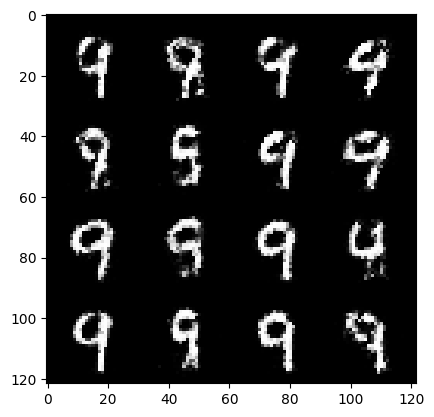

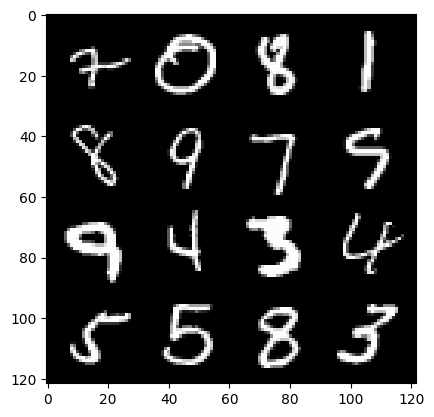

51: step 24000 / Gen loss: 4.415368671417235 / disc_loss: 0.07331863747909664


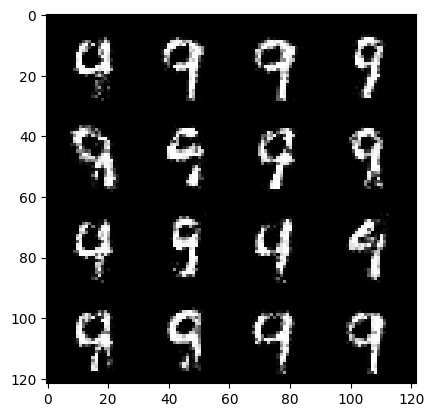

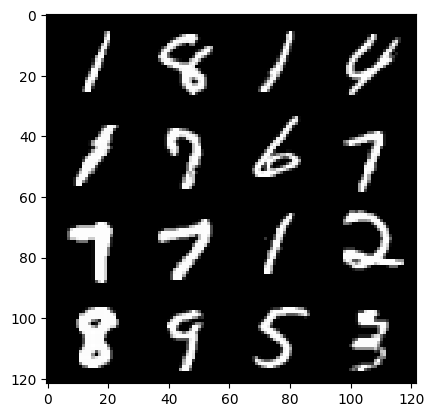

51: step 24300 / Gen loss: 4.387495494683584 / disc_loss: 0.0856305801309645


  0%|          | 0/469 [00:00<?, ?it/s]

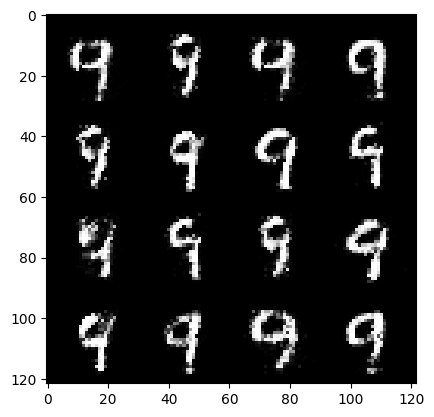

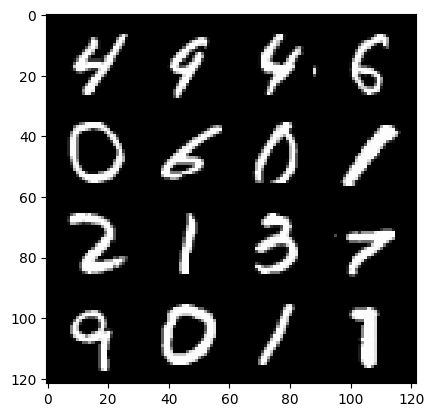

52: step 24600 / Gen loss: 4.435223812262219 / disc_loss: 0.0770552275578181


  0%|          | 0/469 [00:00<?, ?it/s]

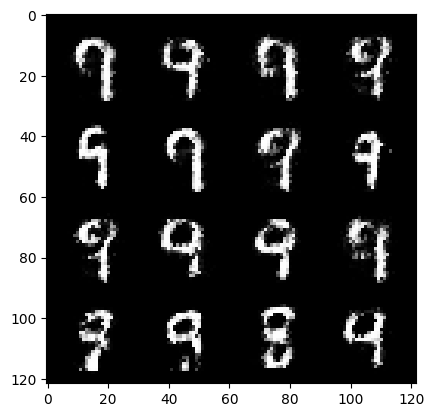

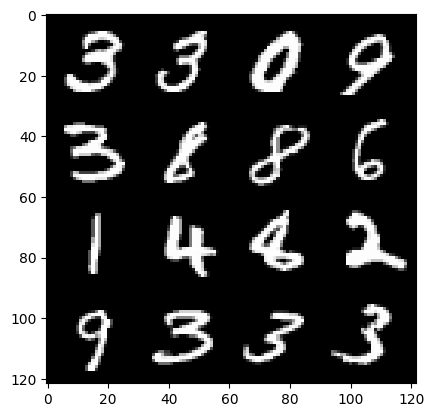

53: step 24900 / Gen loss: 4.270288667678831 / disc_loss: 0.08307836639073987


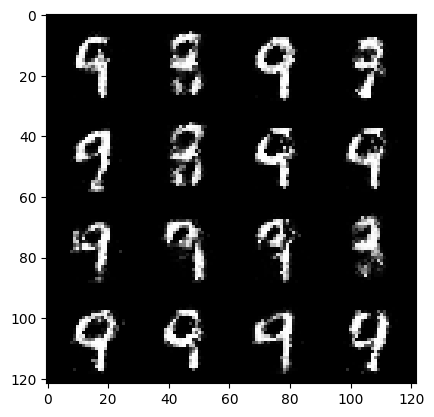

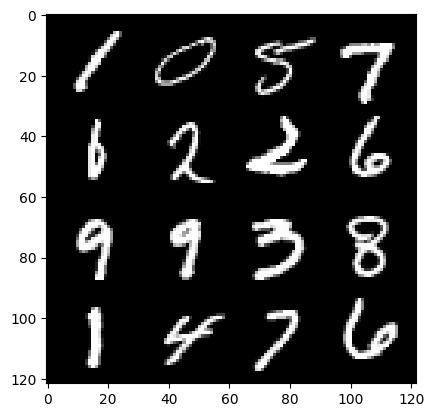

53: step 25200 / Gen loss: 4.273065783977509 / disc_loss: 0.07495343200241524


  0%|          | 0/469 [00:00<?, ?it/s]

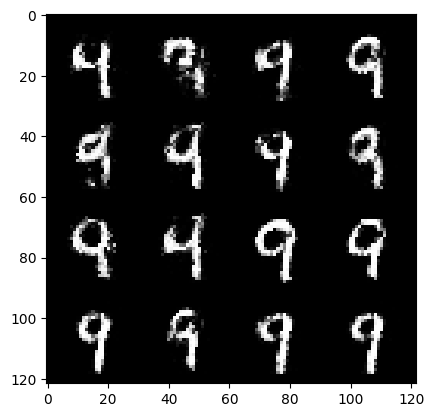

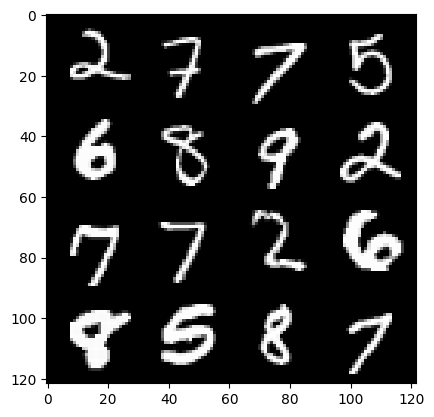

54: step 25500 / Gen loss: 4.142047797044119 / disc_loss: 0.08729719708363219


  0%|          | 0/469 [00:00<?, ?it/s]

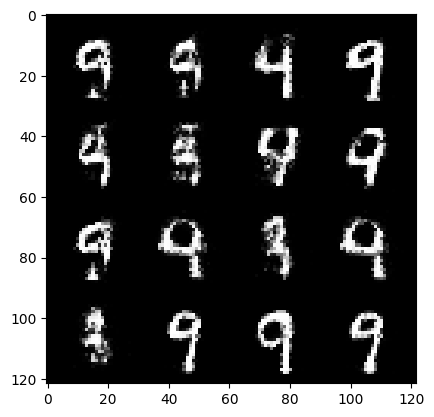

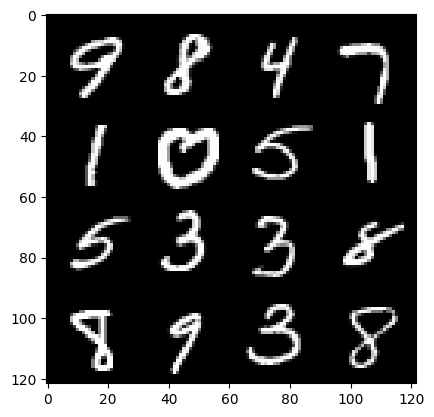

55: step 25800 / Gen loss: 4.079023284912109 / disc_loss: 0.08972677757342652


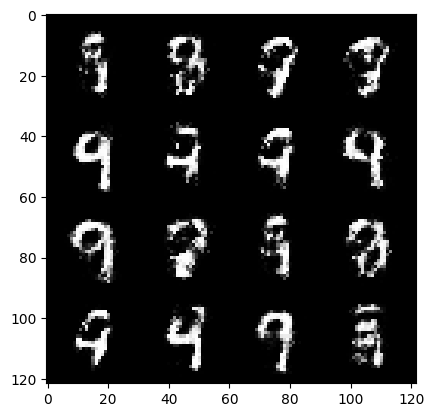

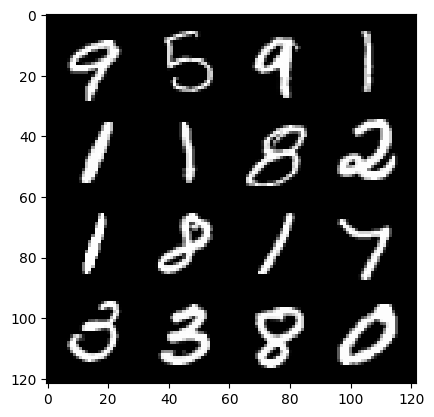

55: step 26100 / Gen loss: 4.106407902240755 / disc_loss: 0.08915133748203517


  0%|          | 0/469 [00:00<?, ?it/s]

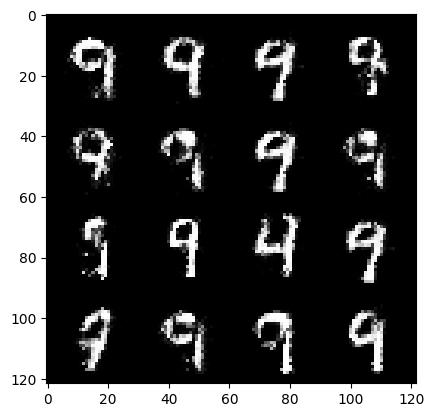

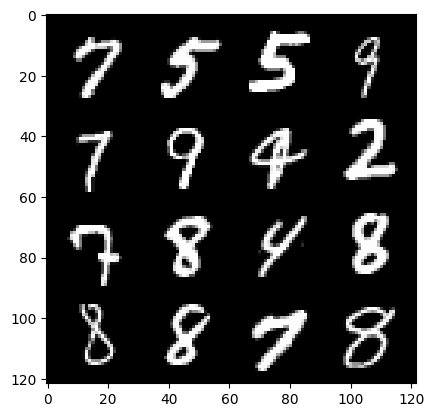

56: step 26400 / Gen loss: 4.017666540145872 / disc_loss: 0.08959369790429869


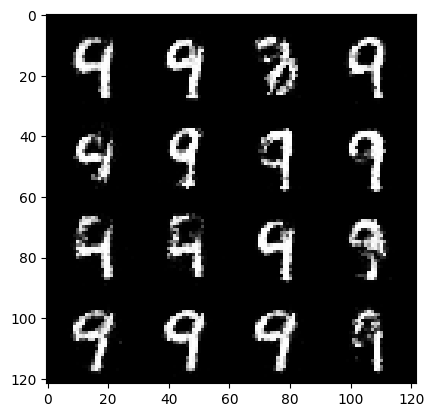

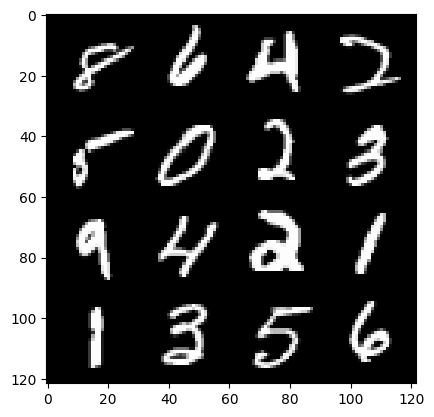

56: step 26700 / Gen loss: 3.984393712679547 / disc_loss: 0.0871941815006236


  0%|          | 0/469 [00:00<?, ?it/s]

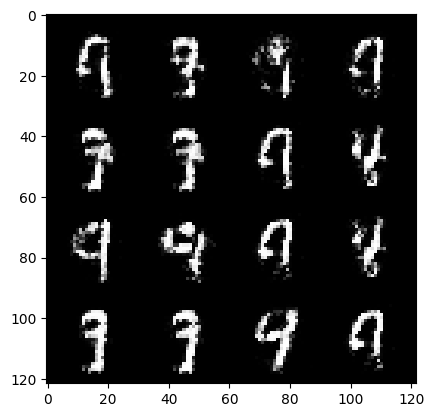

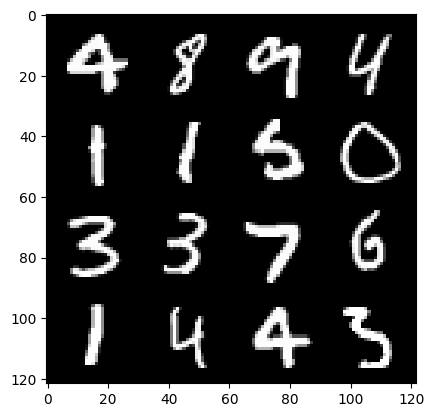

57: step 27000 / Gen loss: 4.044252296288808 / disc_loss: 0.08681404234220583


  0%|          | 0/469 [00:00<?, ?it/s]

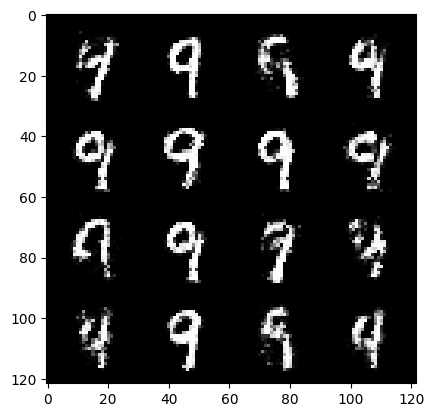

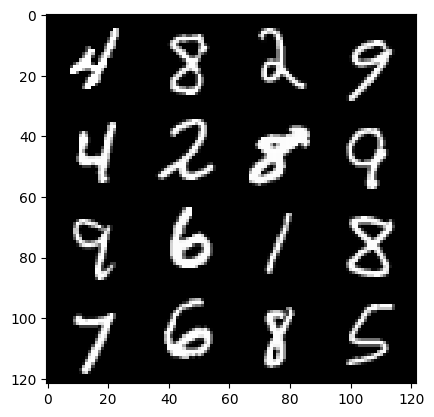

58: step 27300 / Gen loss: 4.149501654307047 / disc_loss: 0.08459653251493972


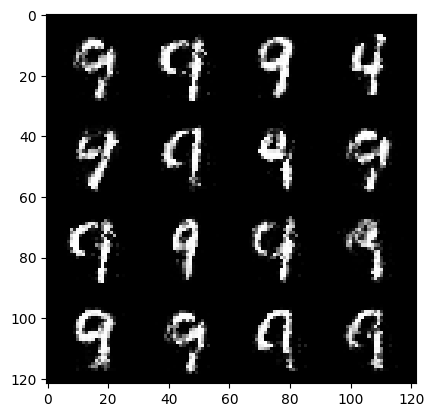

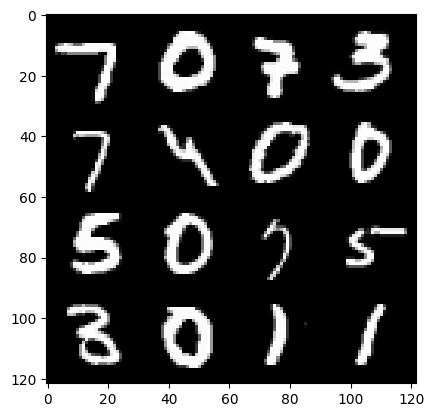

58: step 27600 / Gen loss: 4.048768684069315 / disc_loss: 0.0886773265401522


  0%|          | 0/469 [00:00<?, ?it/s]

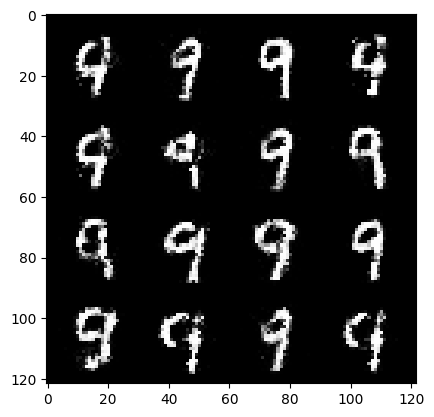

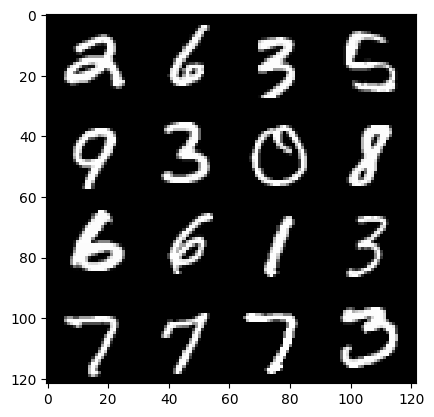

59: step 27900 / Gen loss: 4.04841640392939 / disc_loss: 0.09032772308215499


  0%|          | 0/469 [00:00<?, ?it/s]

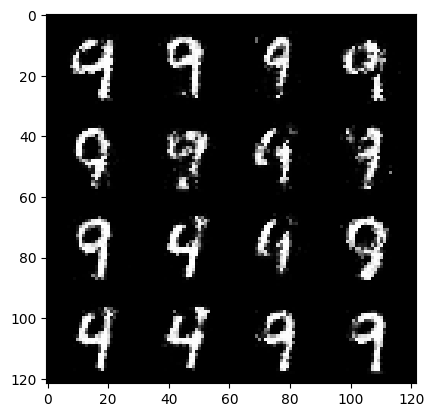

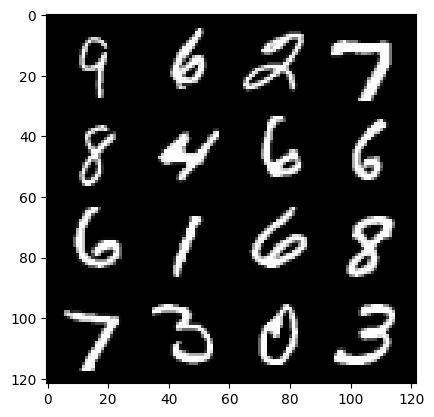

60: step 28200 / Gen loss: 3.8943698294957483 / disc_loss: 0.10199050794666019


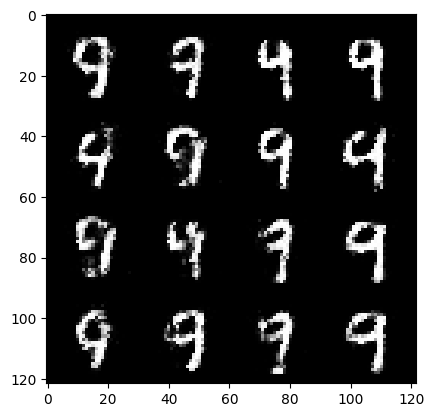

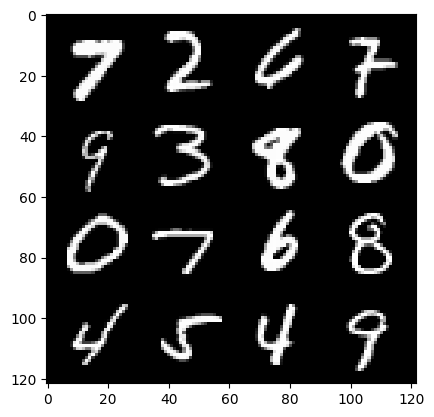

60: step 28500 / Gen loss: 3.9973059765497863 / disc_loss: 0.0972358046285808


  0%|          | 0/469 [00:00<?, ?it/s]

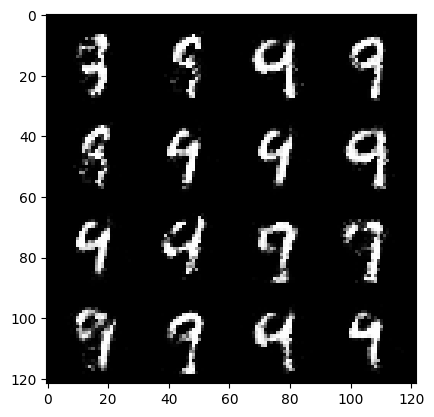

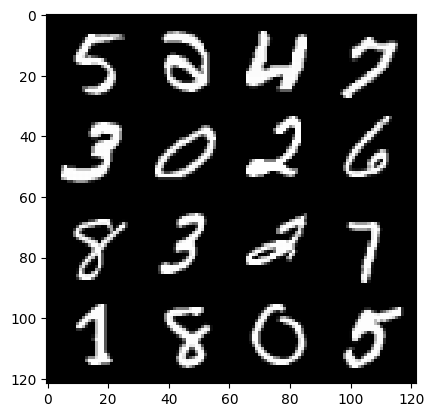

61: step 28800 / Gen loss: 3.8874801651636766 / disc_loss: 0.09656737263003984


  0%|          | 0/469 [00:00<?, ?it/s]

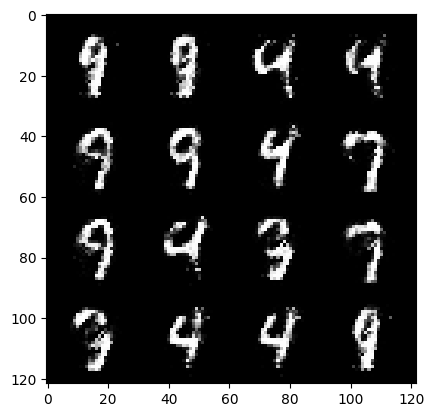

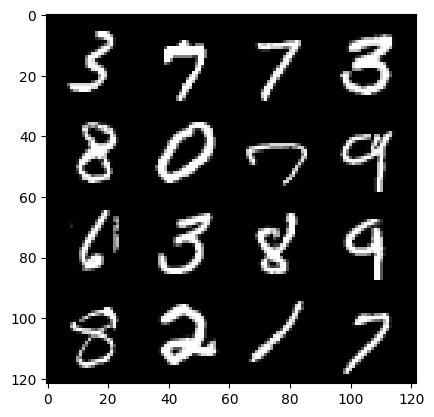

62: step 29100 / Gen loss: 3.8222655606269815 / disc_loss: 0.1058312511816621


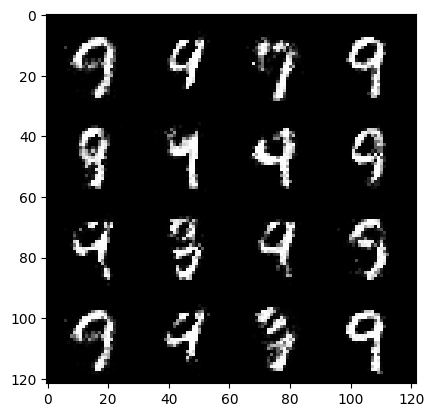

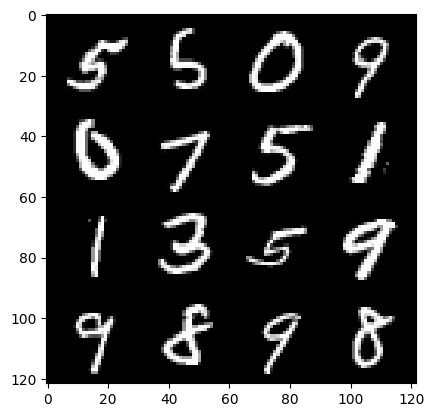

62: step 29400 / Gen loss: 3.8095676819483426 / disc_loss: 0.09779839271058638


  0%|          | 0/469 [00:00<?, ?it/s]

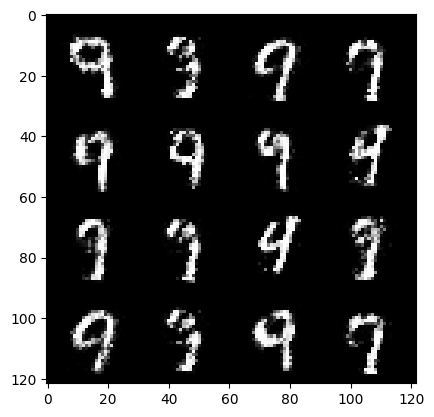

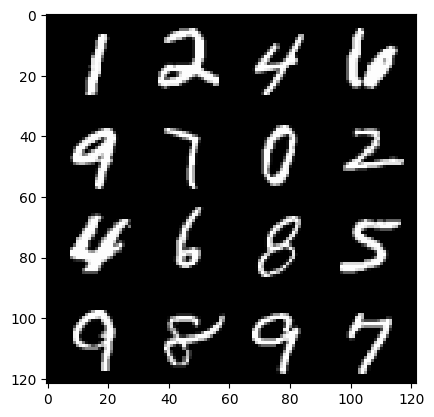

63: step 29700 / Gen loss: 3.9346655766169216 / disc_loss: 0.09696780311564605


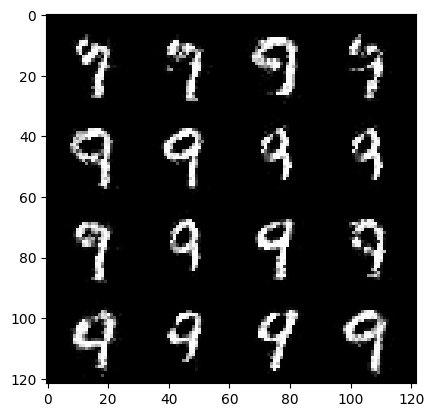

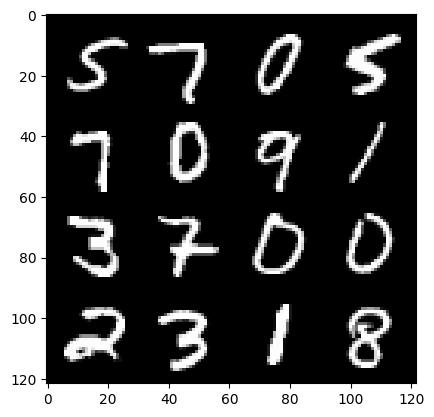

63: step 30000 / Gen loss: 3.6977442065874735 / disc_loss: 0.10862561314056325


  0%|          | 0/469 [00:00<?, ?it/s]

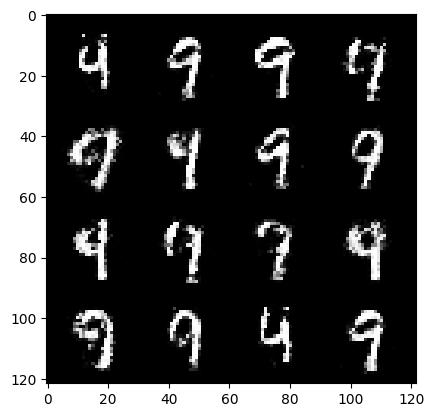

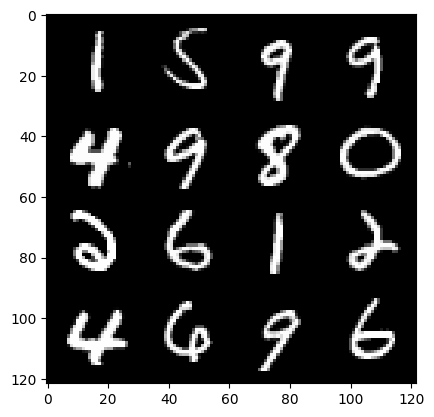

64: step 30300 / Gen loss: 3.819759624799091 / disc_loss: 0.0978860519267619


  0%|          | 0/469 [00:00<?, ?it/s]

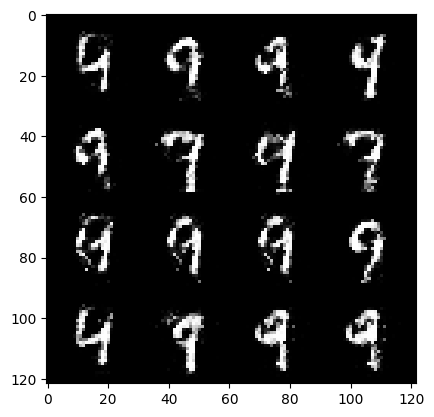

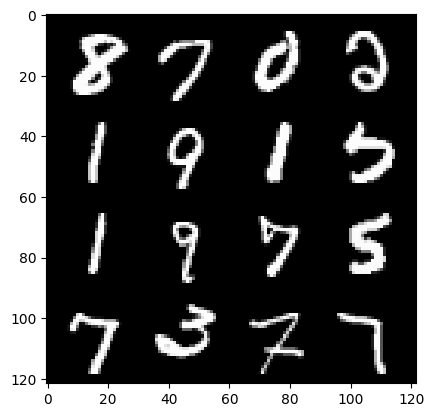

65: step 30600 / Gen loss: 3.7101515245437664 / disc_loss: 0.11318173745026193


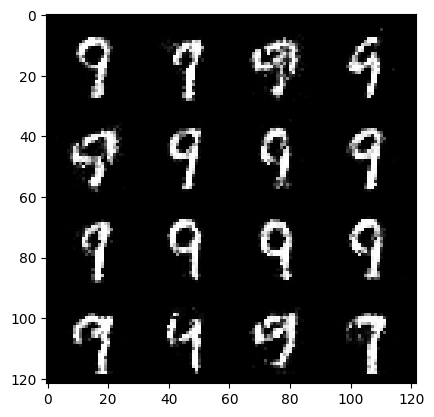

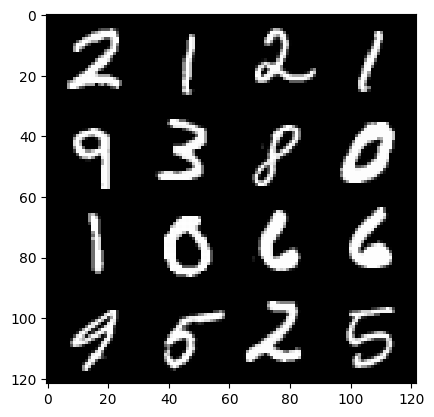

65: step 30900 / Gen loss: 3.690069309870401 / disc_loss: 0.10544487609217572


  0%|          | 0/469 [00:00<?, ?it/s]

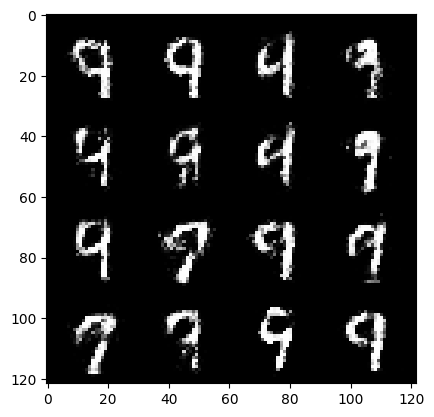

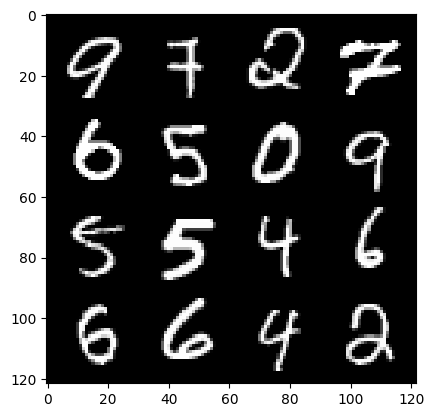

66: step 31200 / Gen loss: 3.693316466013593 / disc_loss: 0.10387762929002439


  0%|          | 0/469 [00:00<?, ?it/s]

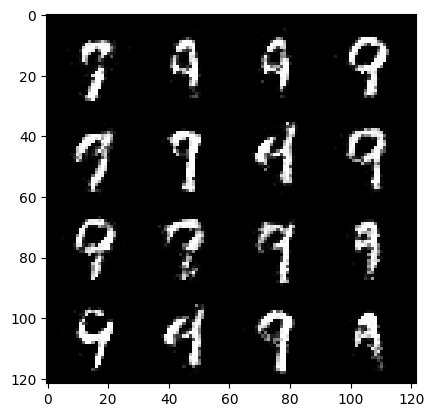

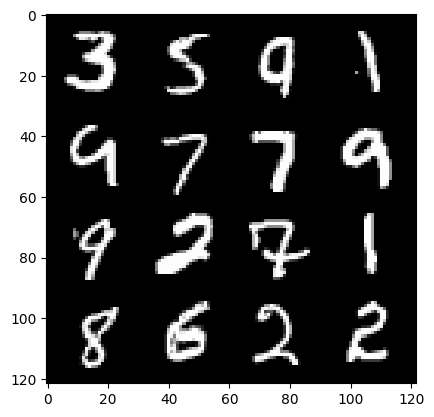

67: step 31500 / Gen loss: 3.696361707051596 / disc_loss: 0.10553205642849205


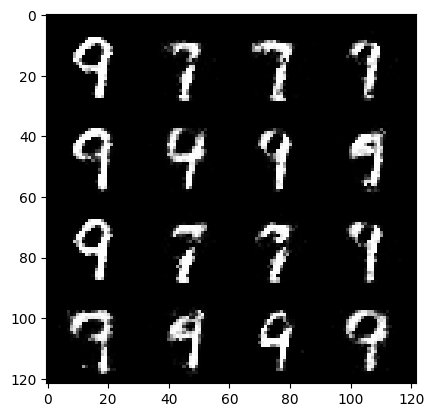

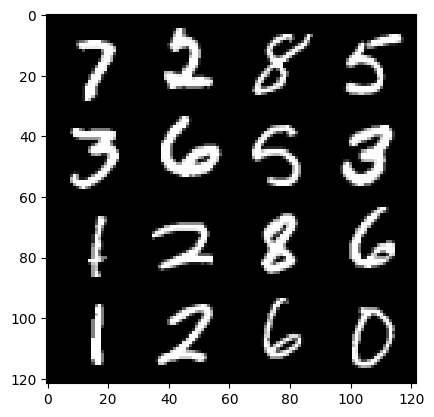

67: step 31800 / Gen loss: 3.691243645350139 / disc_loss: 0.1027325373515487


  0%|          | 0/469 [00:00<?, ?it/s]

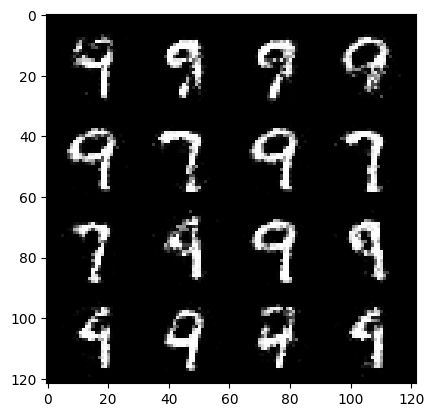

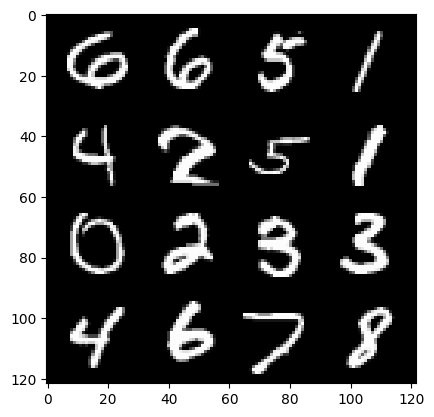

68: step 32100 / Gen loss: 3.719398278395337 / disc_loss: 0.10576869343717886


  0%|          | 0/469 [00:00<?, ?it/s]

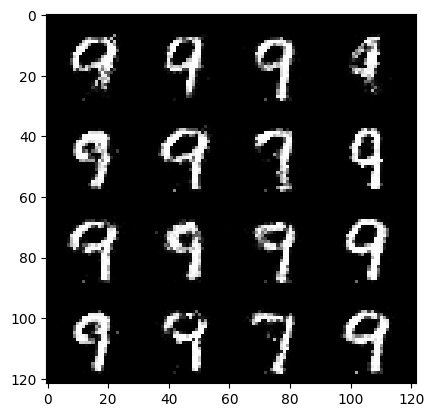

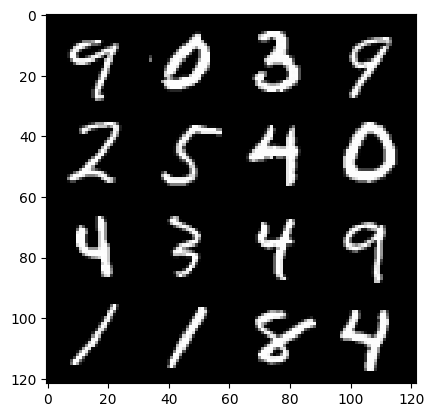

69: step 32400 / Gen loss: 3.6786484273274747 / disc_loss: 0.10989471008380254


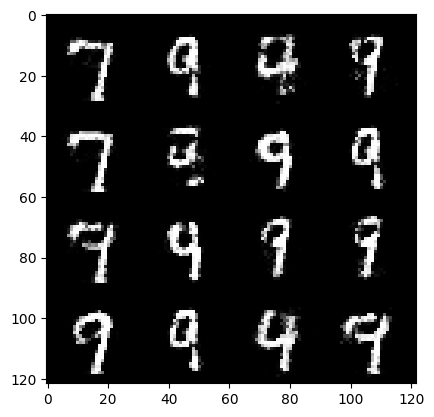

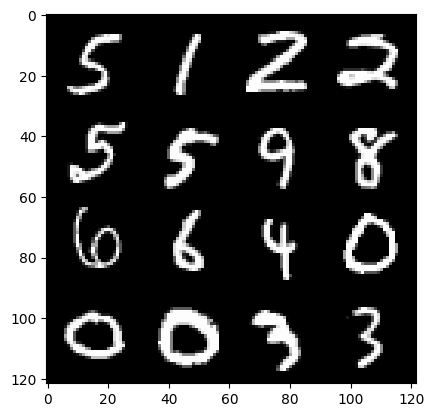

69: step 32700 / Gen loss: 3.560400339762366 / disc_loss: 0.11695185288786895


  0%|          | 0/469 [00:00<?, ?it/s]

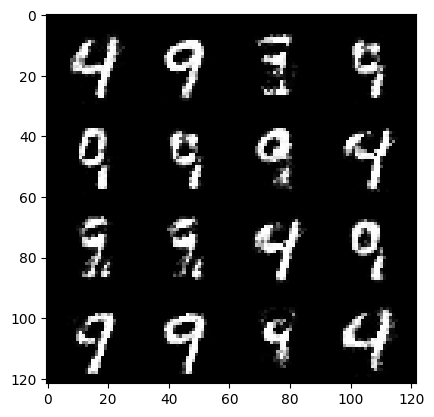

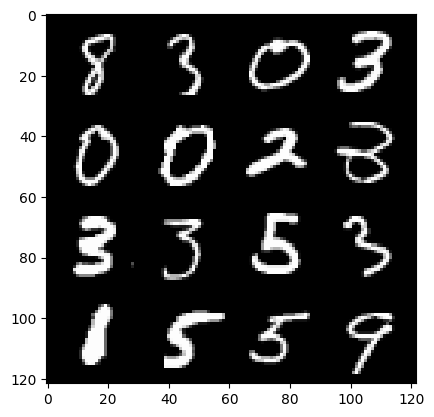

70: step 33000 / Gen loss: 3.448901765346528 / disc_loss: 0.12811785861849784


  0%|          | 0/469 [00:00<?, ?it/s]

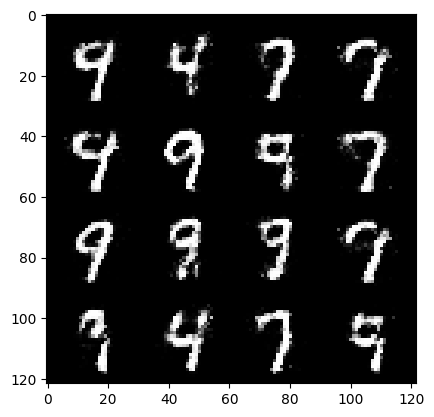

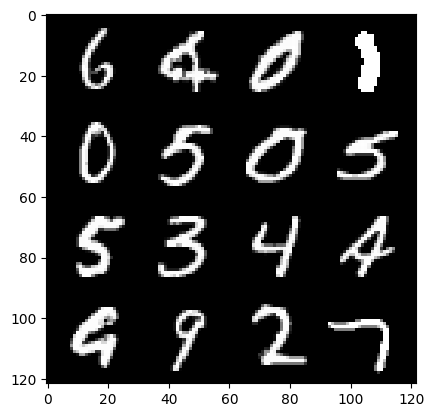

71: step 33300 / Gen loss: 3.353369599978127 / disc_loss: 0.13807222507894032


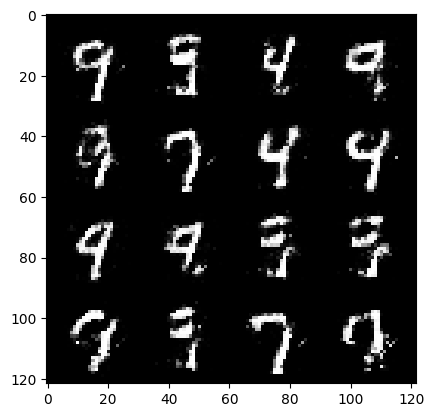

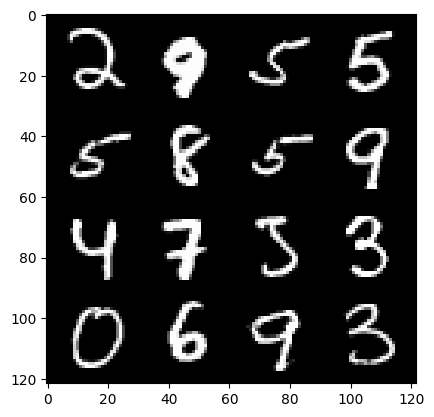

71: step 33600 / Gen loss: 3.2936038208007785 / disc_loss: 0.13240834315617878


  0%|          | 0/469 [00:00<?, ?it/s]

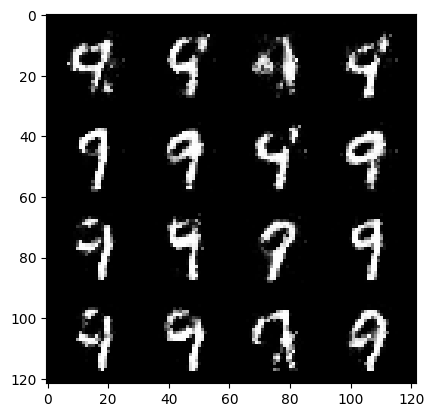

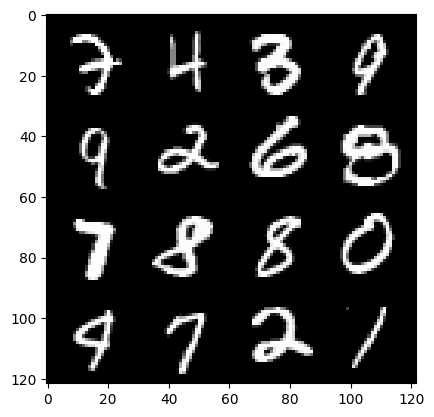

72: step 33900 / Gen loss: 3.2761410260200488 / disc_loss: 0.14131454634169735


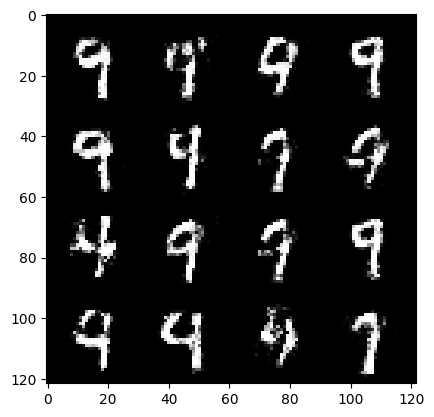

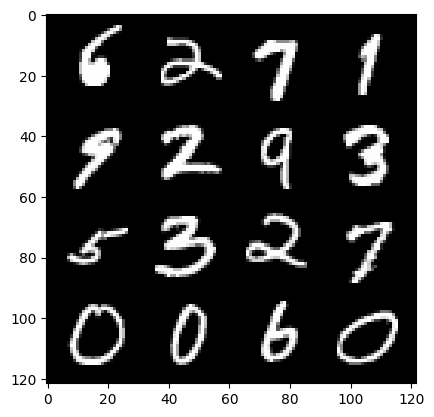

72: step 34200 / Gen loss: 3.204981516997018 / disc_loss: 0.1326851318279902


  0%|          | 0/469 [00:00<?, ?it/s]

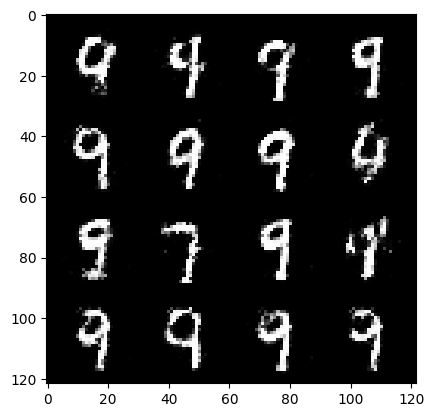

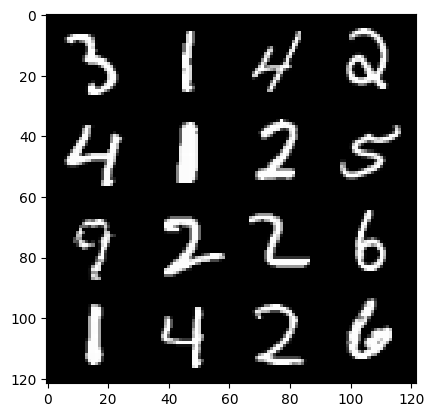

73: step 34500 / Gen loss: 3.333508491516115 / disc_loss: 0.12309454388916492


  0%|          | 0/469 [00:00<?, ?it/s]

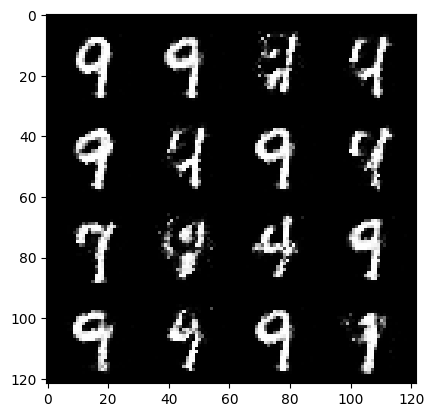

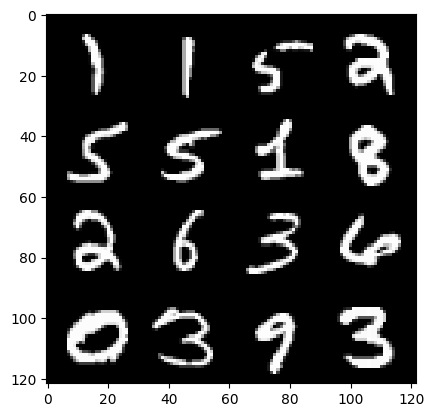

74: step 34800 / Gen loss: 3.3853615609804786 / disc_loss: 0.12328196865816907


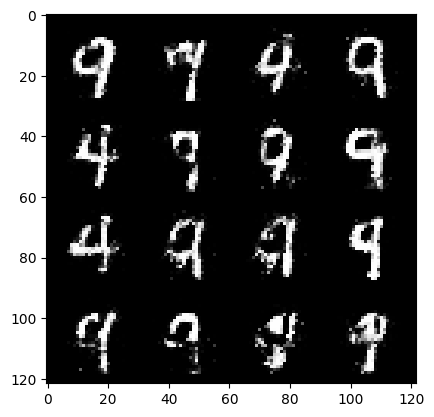

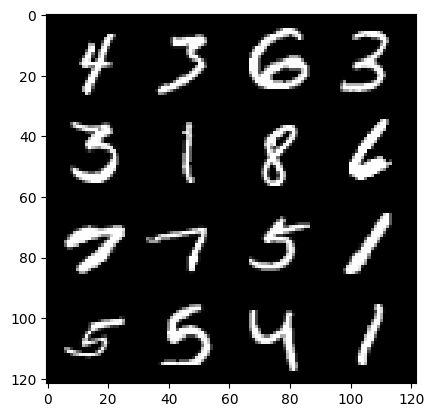

74: step 35100 / Gen loss: 3.2333184703191096 / disc_loss: 0.14507831526299322


  0%|          | 0/469 [00:00<?, ?it/s]

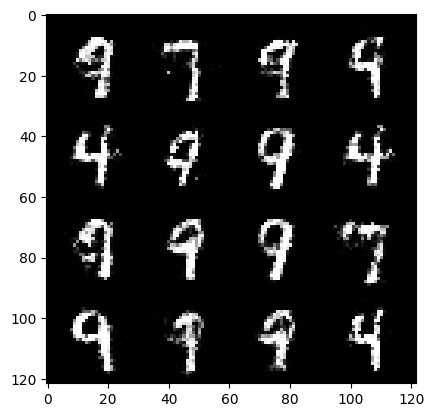

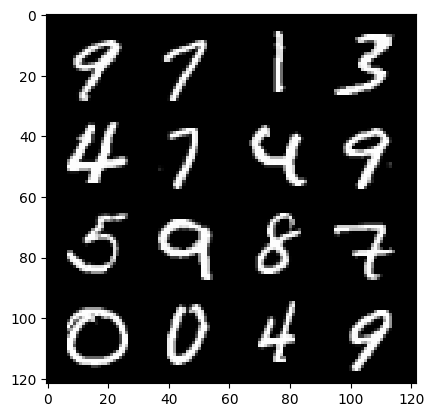

75: step 35400 / Gen loss: 3.2987224936485298 / disc_loss: 0.1330509454136094


  0%|          | 0/469 [00:00<?, ?it/s]

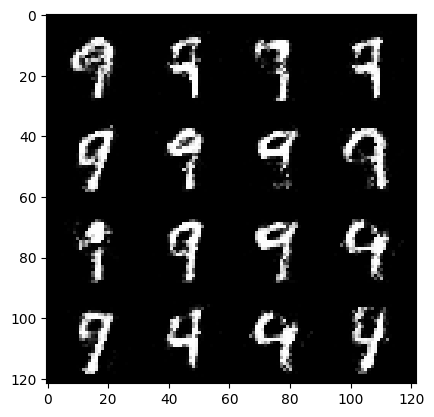

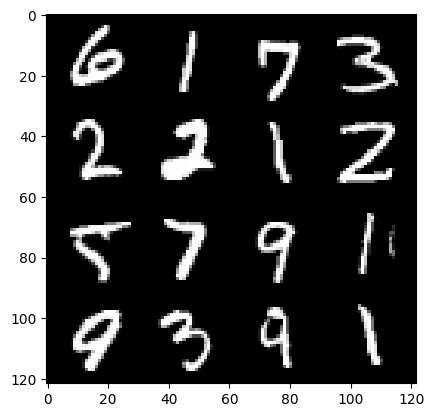

76: step 35700 / Gen loss: 3.254765428702037 / disc_loss: 0.13759797307352223


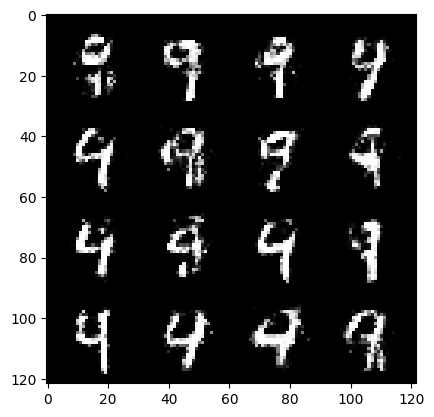

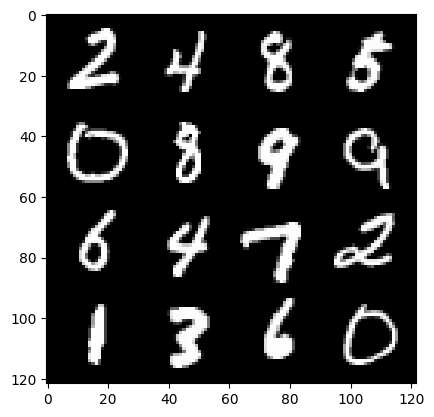

76: step 36000 / Gen loss: 3.0896466422080966 / disc_loss: 0.14625279881060127


  0%|          | 0/469 [00:00<?, ?it/s]

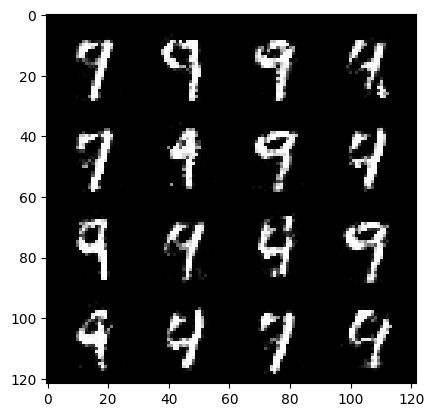

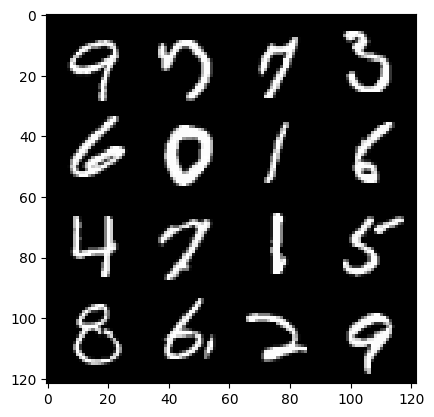

77: step 36300 / Gen loss: 3.1742453304926554 / disc_loss: 0.13883957571039596


  0%|          | 0/469 [00:00<?, ?it/s]

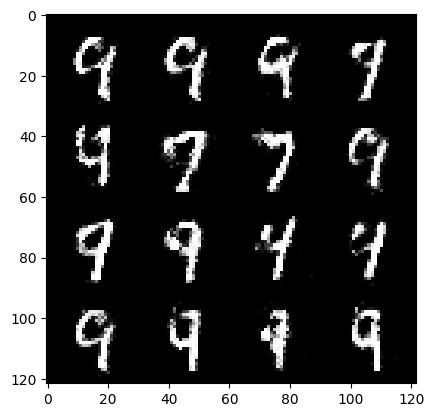

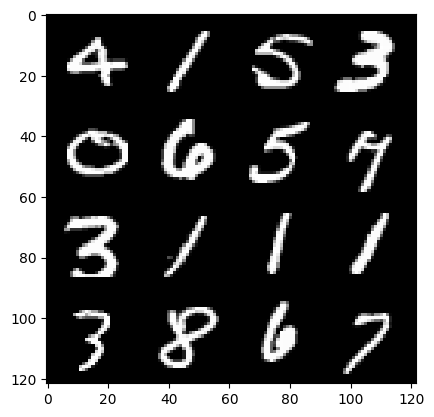

78: step 36600 / Gen loss: 3.245018379688264 / disc_loss: 0.12498694927742089


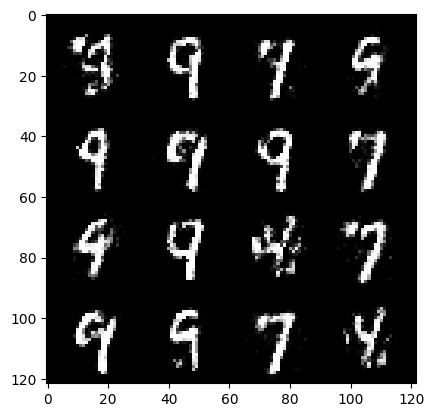

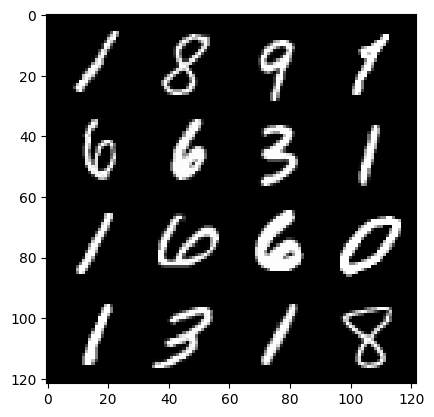

78: step 36900 / Gen loss: 3.457632649739581 / disc_loss: 0.11959895605842268


  0%|          | 0/469 [00:00<?, ?it/s]

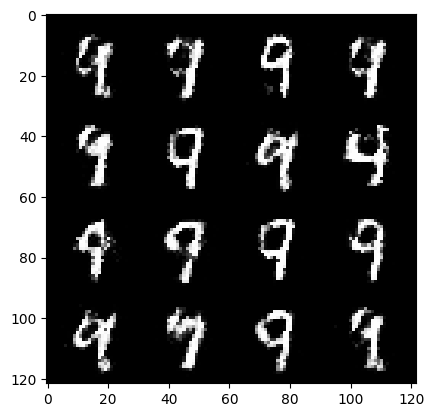

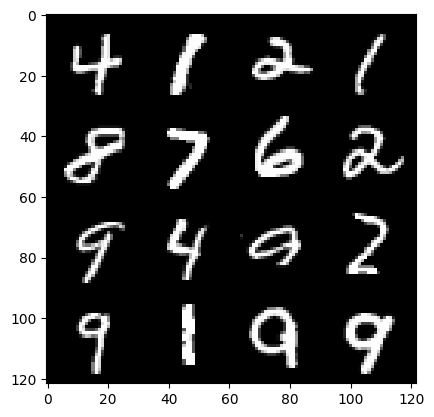

79: step 37200 / Gen loss: 3.3282320284843463 / disc_loss: 0.13280960368613395


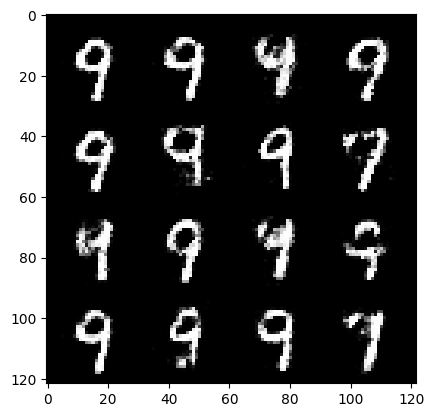

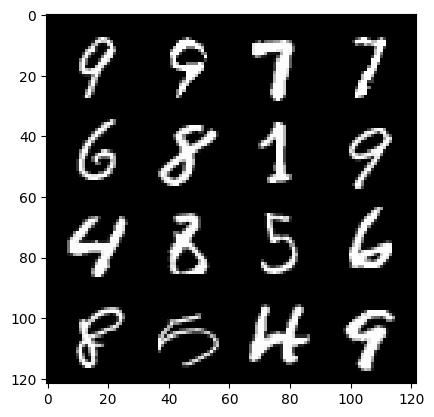

79: step 37500 / Gen loss: 3.16270575205485 / disc_loss: 0.13860314300904675


  0%|          | 0/469 [00:00<?, ?it/s]

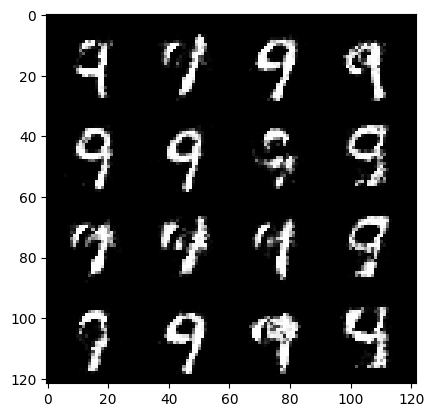

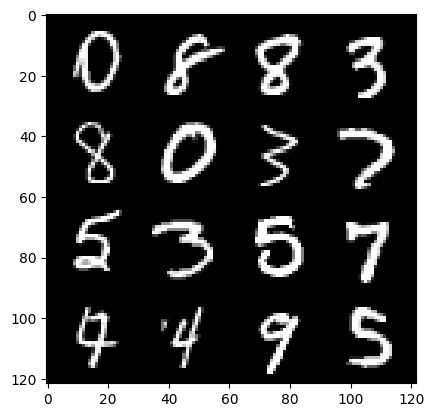

80: step 37800 / Gen loss: 3.175200983683268 / disc_loss: 0.1317439910024404


  0%|          | 0/469 [00:00<?, ?it/s]

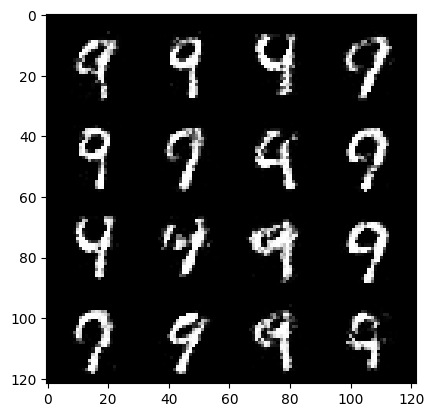

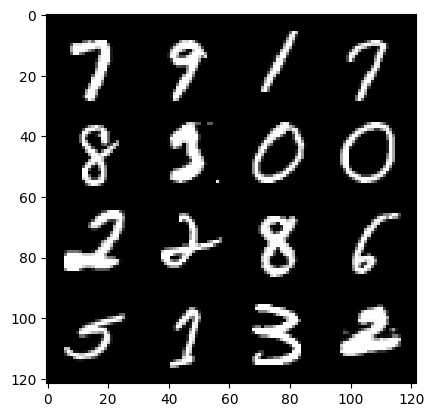

81: step 38100 / Gen loss: 3.2560292291641217 / disc_loss: 0.12274089363714057


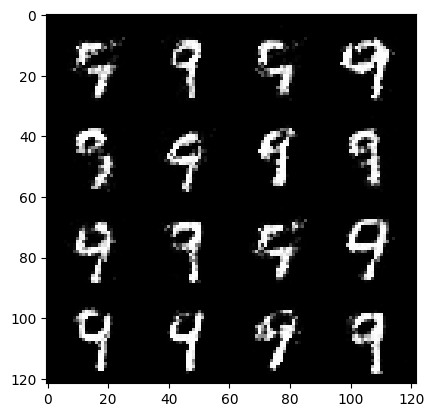

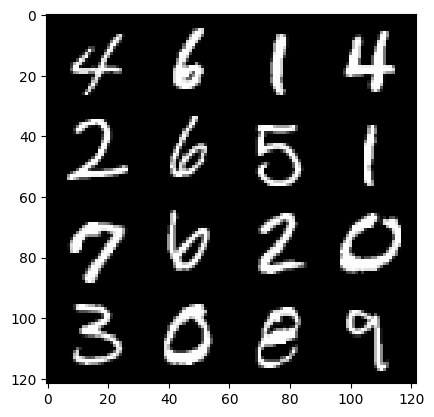

81: step 38400 / Gen loss: 3.274783148765566 / disc_loss: 0.13279440417885777


  0%|          | 0/469 [00:00<?, ?it/s]

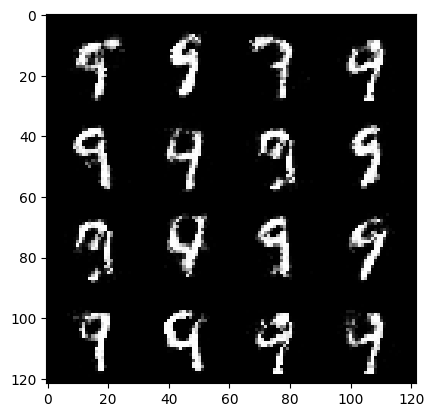

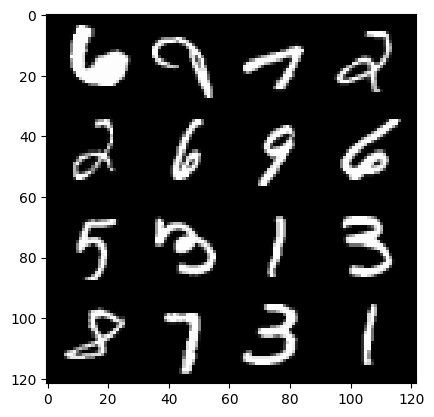

82: step 38700 / Gen loss: 3.2198835698763517 / disc_loss: 0.14285547710955146


  0%|          | 0/469 [00:00<?, ?it/s]

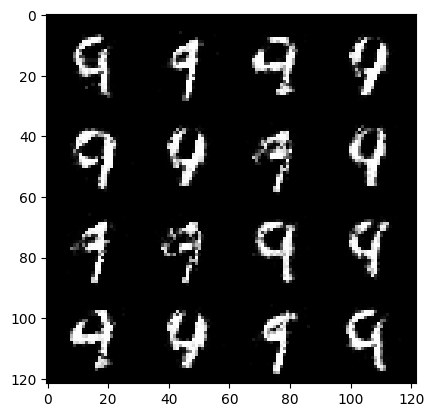

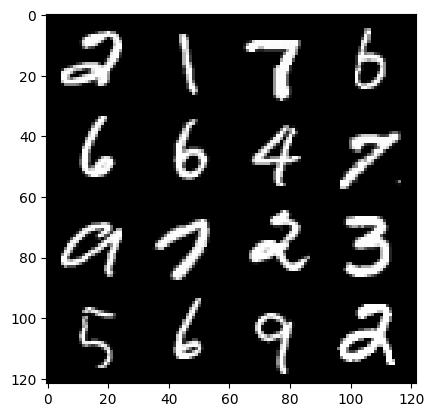

83: step 39000 / Gen loss: 3.090159729321797 / disc_loss: 0.14146830176313718


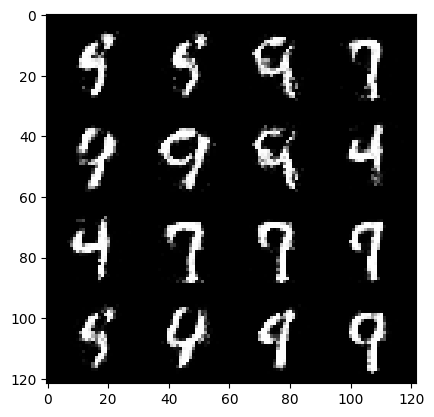

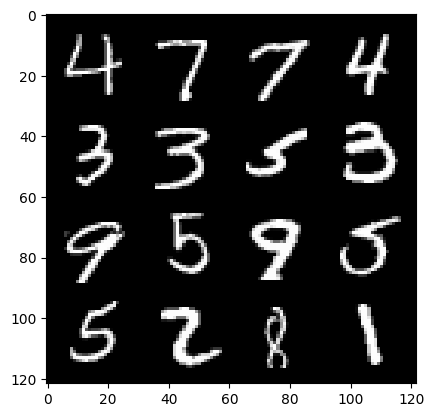

83: step 39300 / Gen loss: 3.18862508535385 / disc_loss: 0.1421617417906721


  0%|          | 0/469 [00:00<?, ?it/s]

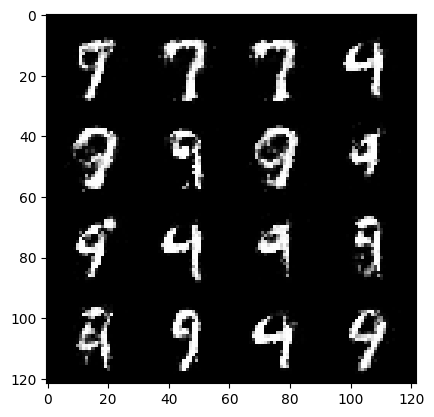

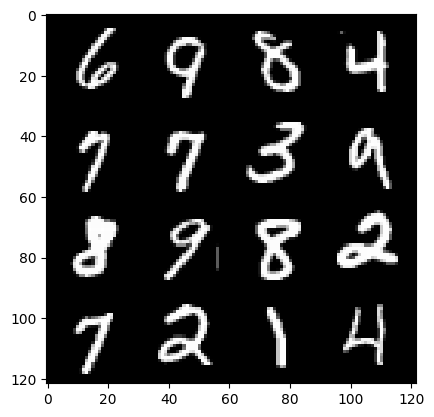

84: step 39600 / Gen loss: 3.1414601063728305 / disc_loss: 0.1410806226481994


  0%|          | 0/469 [00:00<?, ?it/s]

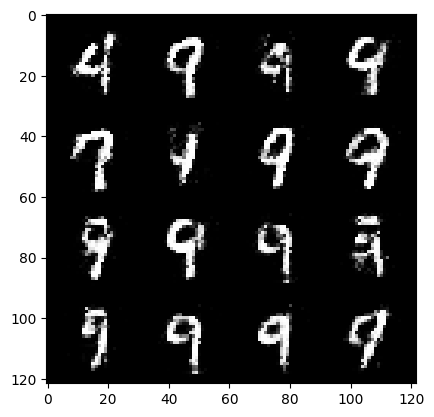

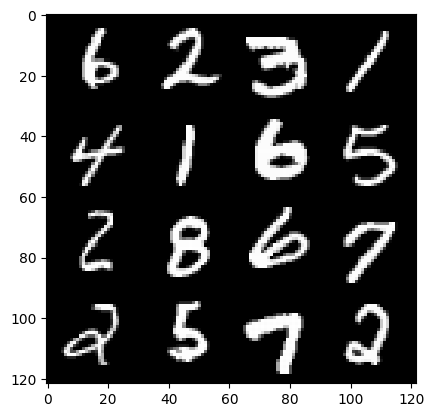

85: step 39900 / Gen loss: 3.146841901143391 / disc_loss: 0.13856483043481913


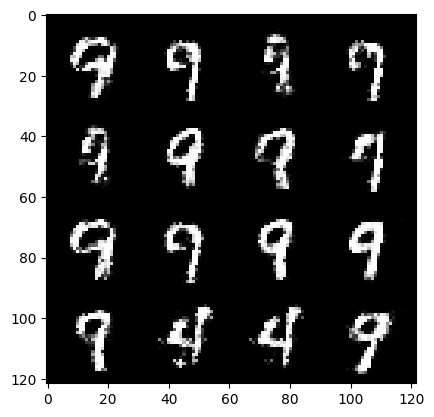

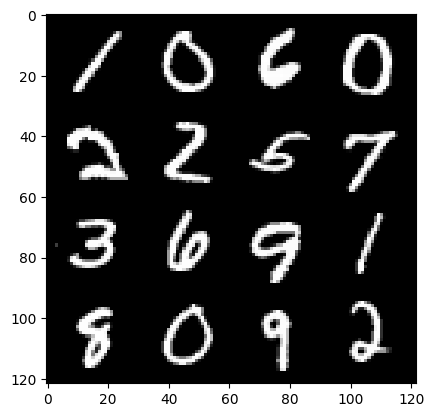

85: step 40200 / Gen loss: 3.1118332823117565 / disc_loss: 0.1459292476127544


  0%|          | 0/469 [00:00<?, ?it/s]

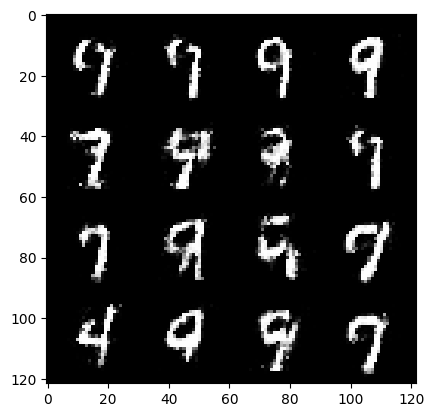

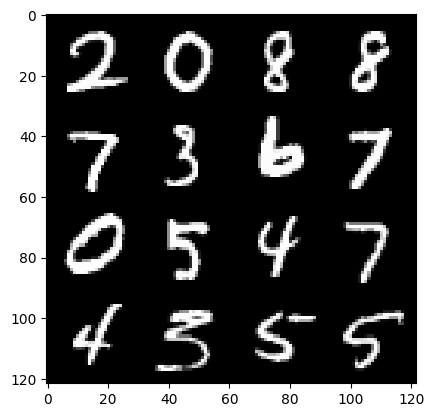

86: step 40500 / Gen loss: 2.994607987403868 / disc_loss: 0.15872956300775212


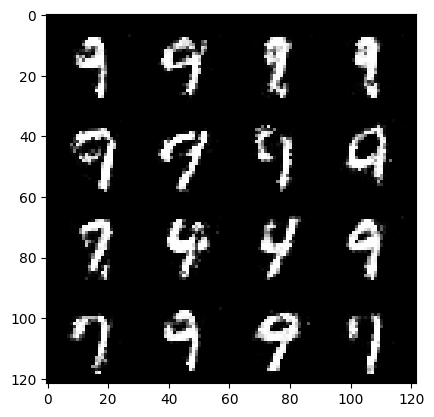

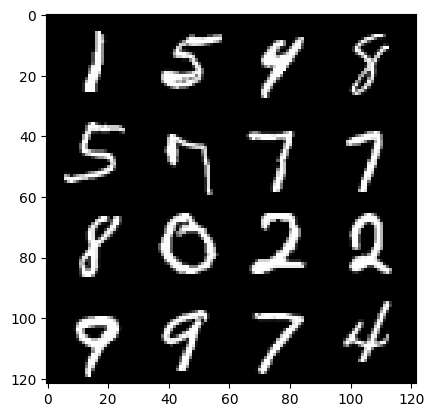

86: step 40800 / Gen loss: 3.083105463981628 / disc_loss: 0.14785220379630717


  0%|          | 0/469 [00:00<?, ?it/s]

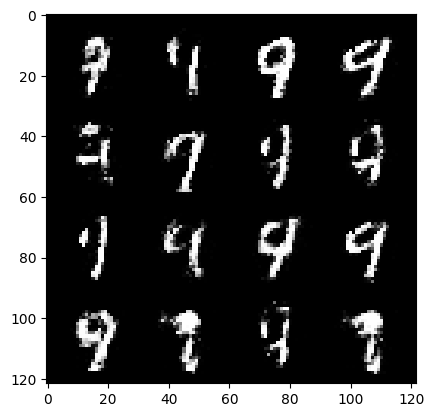

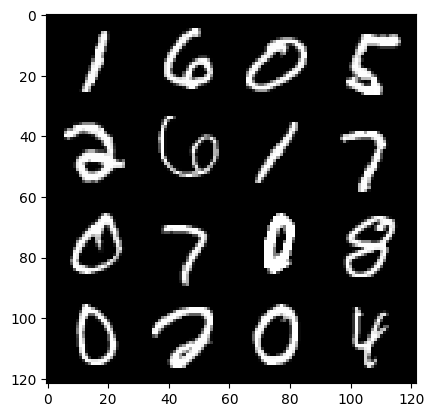

87: step 41100 / Gen loss: 2.962206141153968 / disc_loss: 0.16650057859718803


  0%|          | 0/469 [00:00<?, ?it/s]

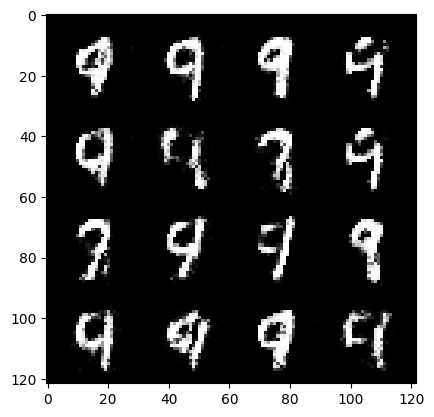

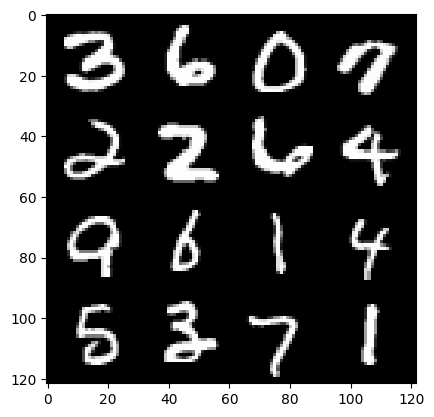

88: step 41400 / Gen loss: 2.880544002056121 / disc_loss: 0.17053246411184467


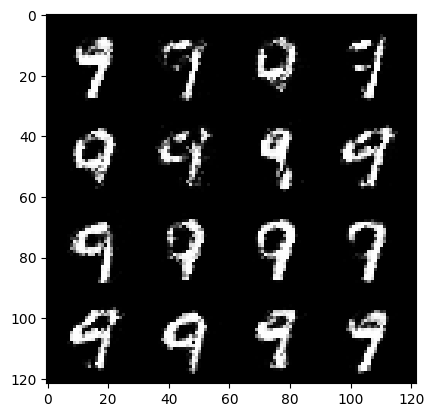

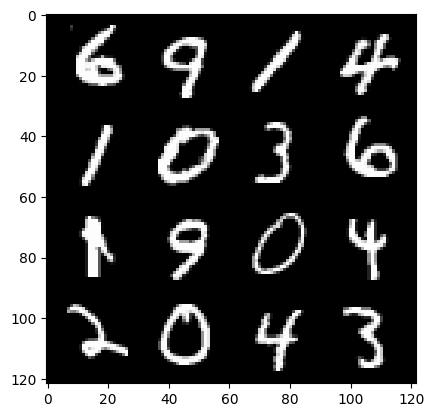

88: step 41700 / Gen loss: 2.821945521831512 / disc_loss: 0.1633452542622884


  0%|          | 0/469 [00:00<?, ?it/s]

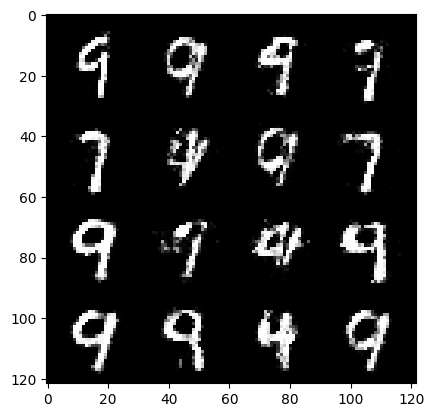

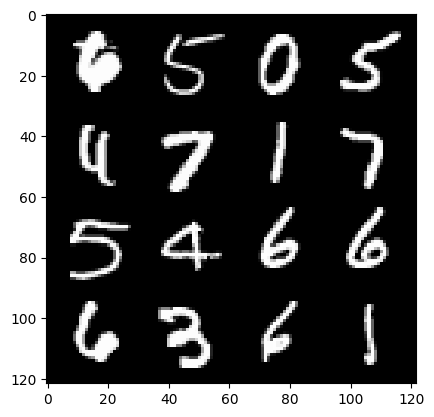

89: step 42000 / Gen loss: 2.9699916028976445 / disc_loss: 0.14814127144714193


  0%|          | 0/469 [00:00<?, ?it/s]

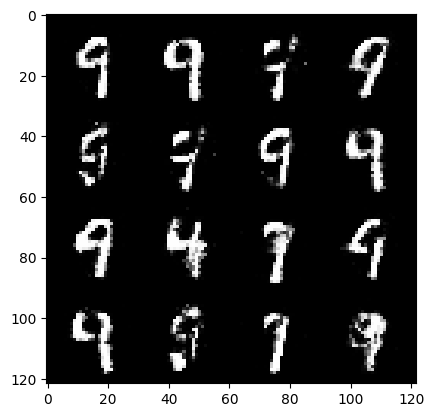

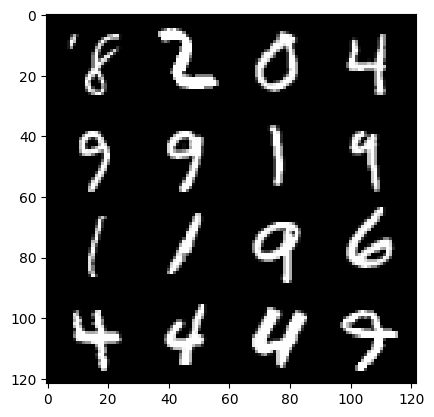

90: step 42300 / Gen loss: 3.0043239339192733 / disc_loss: 0.1461982264121373


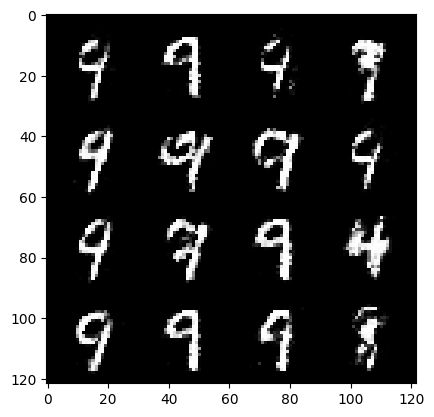

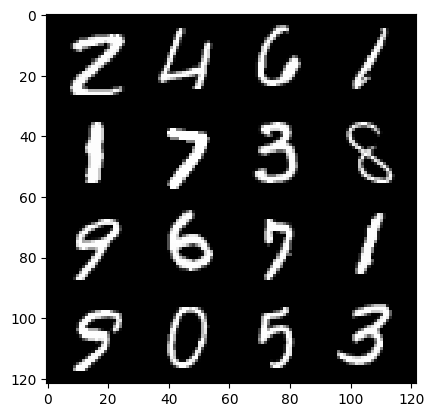

90: step 42600 / Gen loss: 3.1328991063435887 / disc_loss: 0.136013635372122


  0%|          | 0/469 [00:00<?, ?it/s]

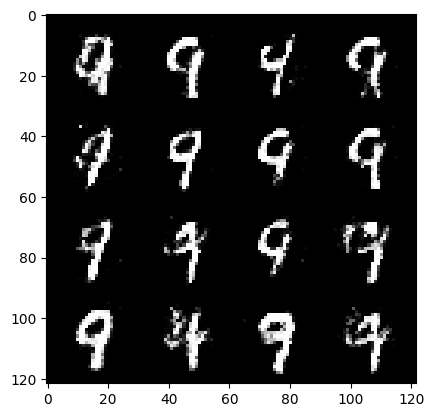

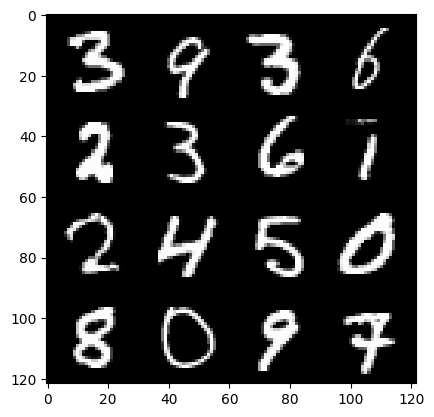

91: step 42900 / Gen loss: 3.029886048634843 / disc_loss: 0.15376588535805538


  0%|          | 0/469 [00:00<?, ?it/s]

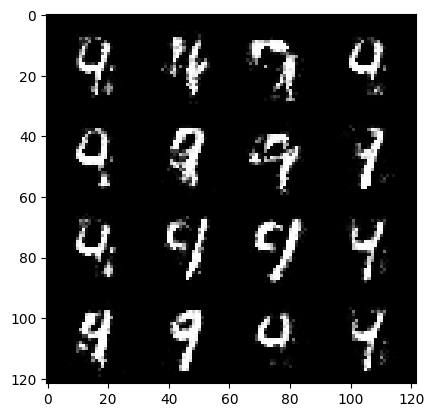

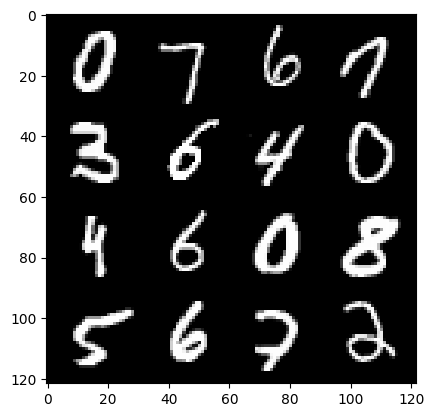

92: step 43200 / Gen loss: 3.041057075659433 / disc_loss: 0.14099679927031192


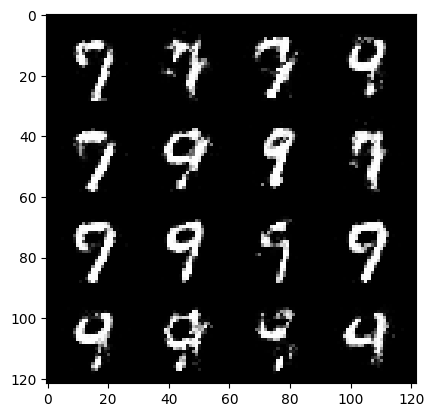

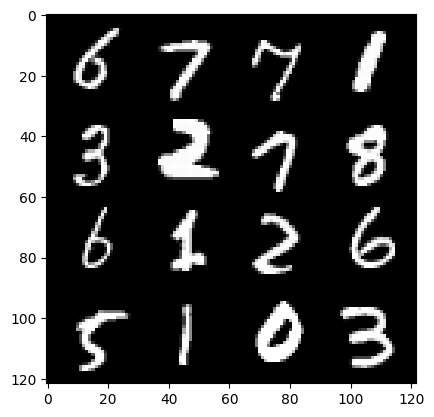

92: step 43500 / Gen loss: 2.88713169892629 / disc_loss: 0.1681319493303695


  0%|          | 0/469 [00:00<?, ?it/s]

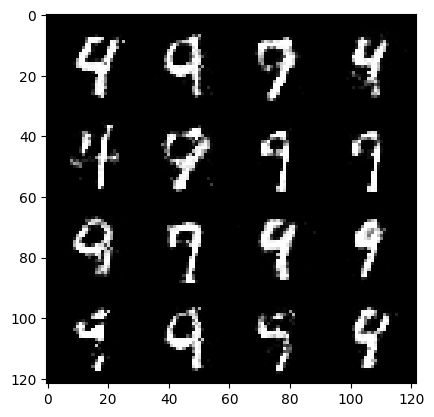

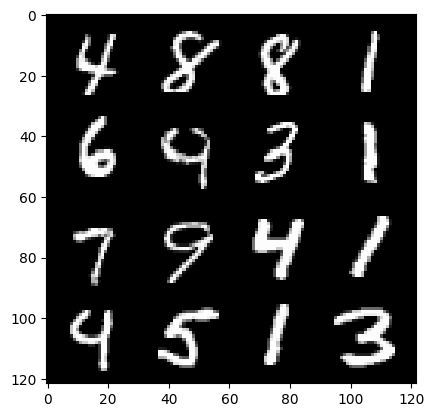

93: step 43800 / Gen loss: 3.008060060342151 / disc_loss: 0.14527657953401413


  0%|          | 0/469 [00:00<?, ?it/s]

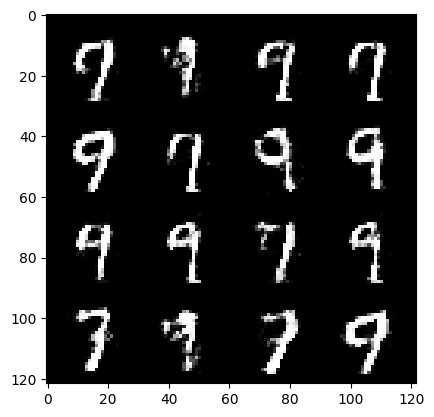

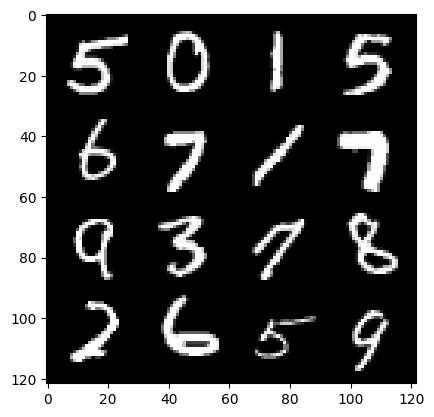

94: step 44100 / Gen loss: 3.009704065322875 / disc_loss: 0.1513022665182749


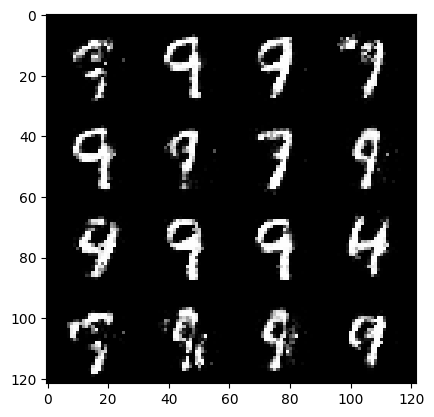

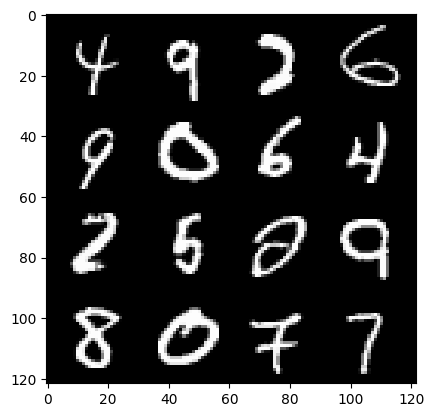

94: step 44400 / Gen loss: 2.928456593354543 / disc_loss: 0.1641939979294937


  0%|          | 0/469 [00:00<?, ?it/s]

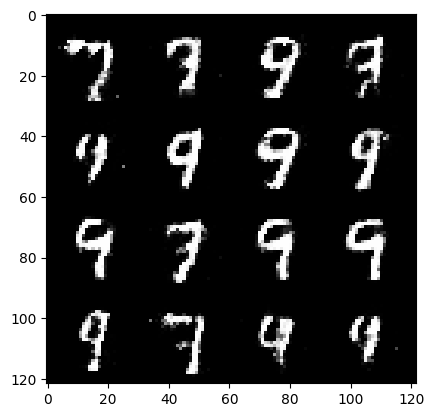

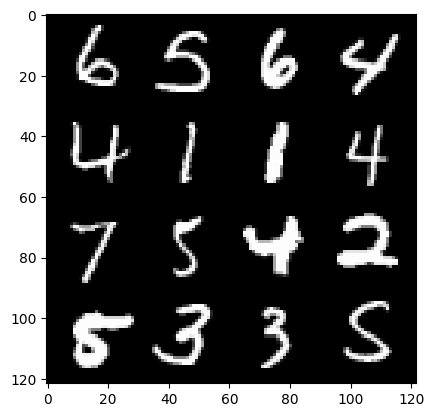

95: step 44700 / Gen loss: 2.9543729416529367 / disc_loss: 0.15466351451973126


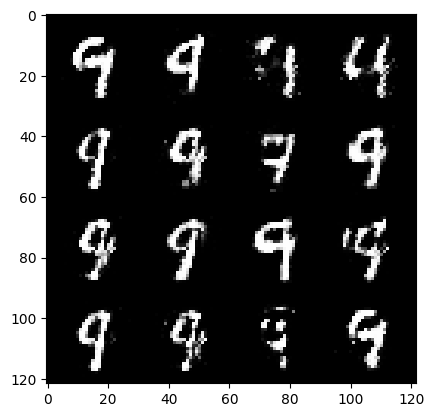

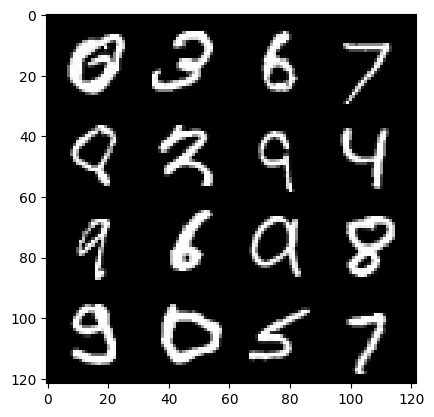

95: step 45000 / Gen loss: 2.86442906141281 / disc_loss: 0.16440825072427576


  0%|          | 0/469 [00:00<?, ?it/s]

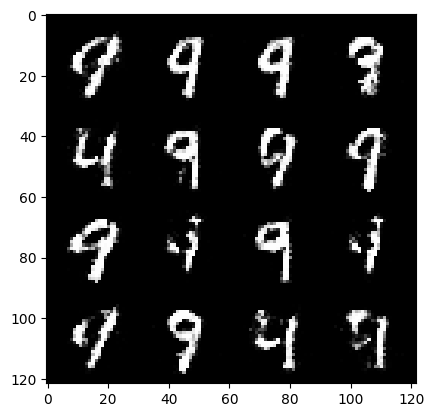

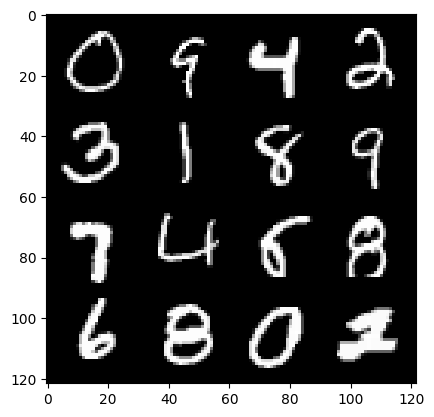

96: step 45300 / Gen loss: 2.9953438329696667 / disc_loss: 0.15432869230707483


  0%|          | 0/469 [00:00<?, ?it/s]

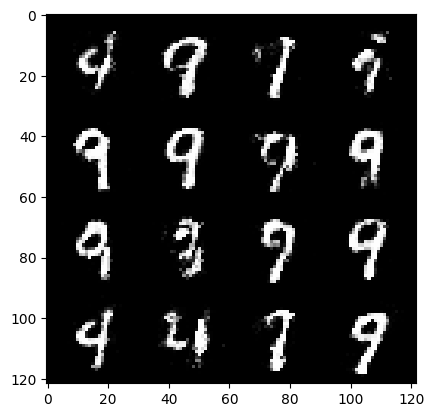

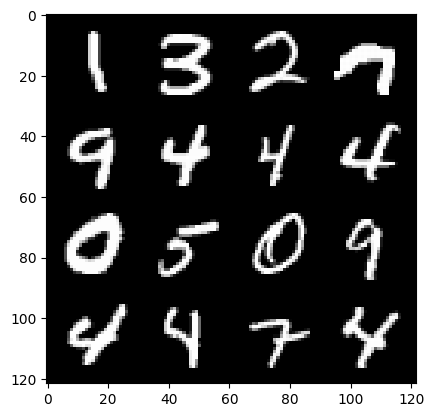

97: step 45600 / Gen loss: 2.935690673987071 / disc_loss: 0.152656831194957


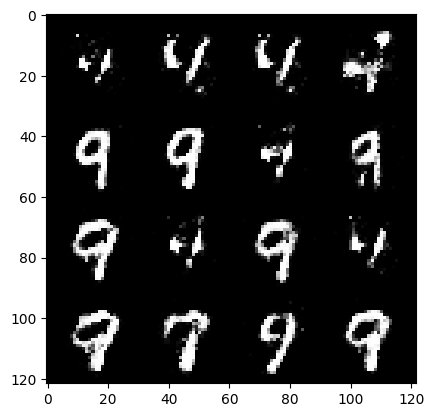

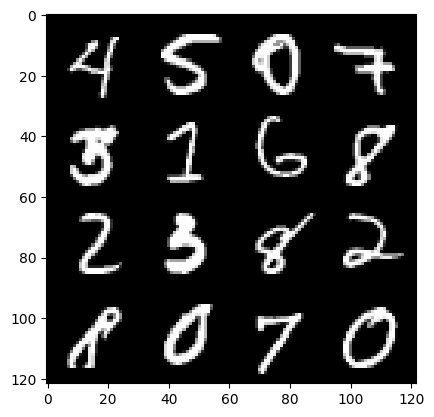

97: step 45900 / Gen loss: 2.830003143946331 / disc_loss: 0.17106158899764218


  0%|          | 0/469 [00:00<?, ?it/s]

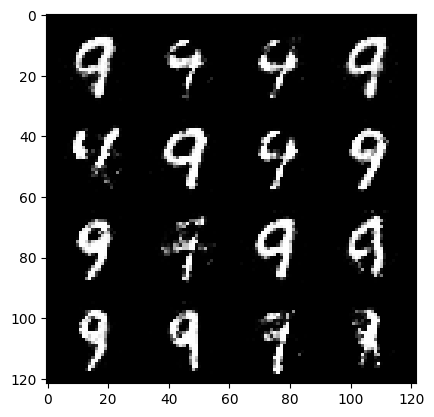

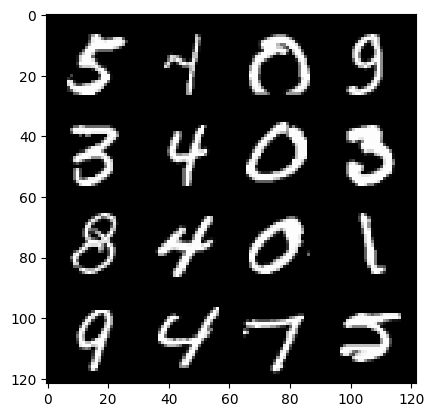

98: step 46200 / Gen loss: 2.8057675282160455 / disc_loss: 0.16695031796892496


  0%|          | 0/469 [00:00<?, ?it/s]

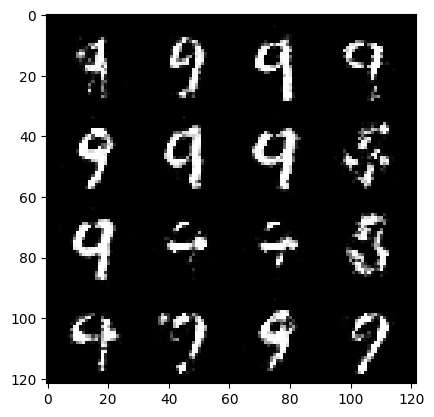

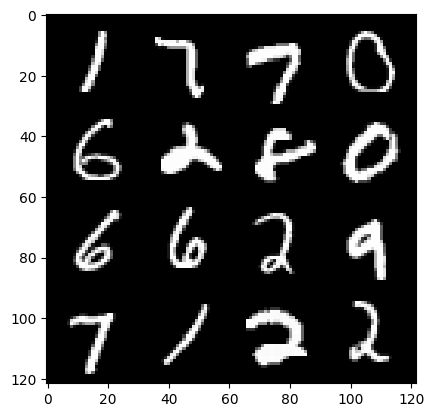

99: step 46500 / Gen loss: 2.8581249300638842 / disc_loss: 0.1619065474222103


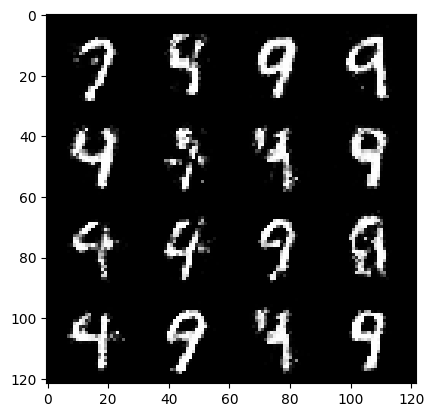

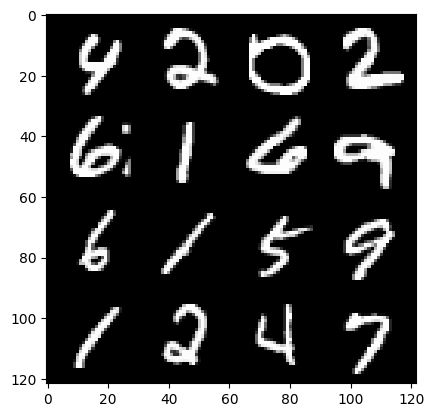

99: step 46800 / Gen loss: 2.842377247810362 / disc_loss: 0.16983534271518383


  0%|          | 0/469 [00:00<?, ?it/s]

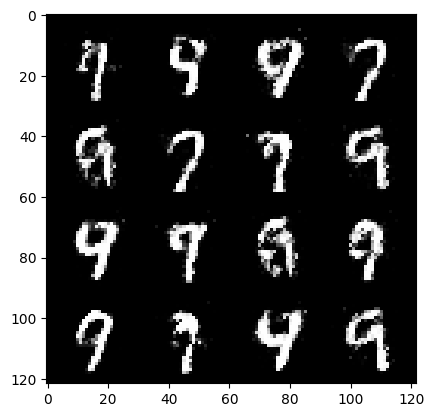

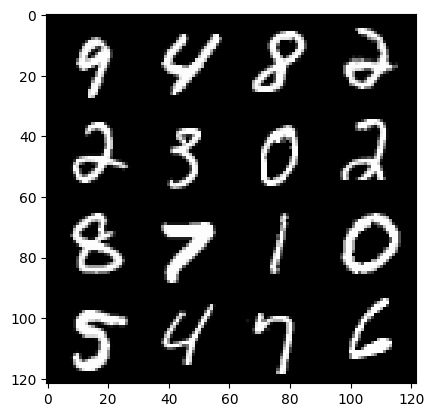

100: step 47100 / Gen loss: 2.6637709124883022 / disc_loss: 0.1919538985937834


  0%|          | 0/469 [00:00<?, ?it/s]

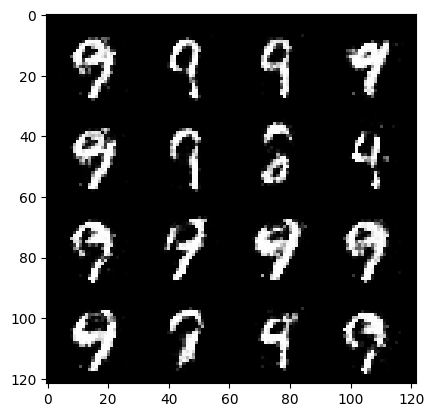

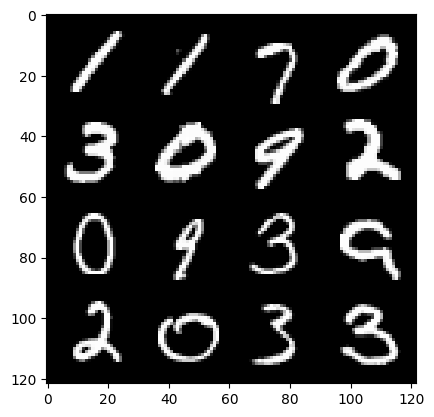

101: step 47400 / Gen loss: 2.8102374656995166 / disc_loss: 0.1731577843179306


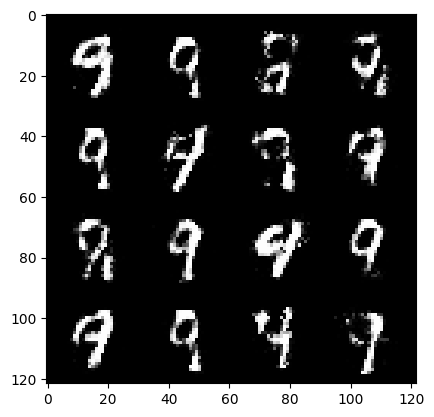

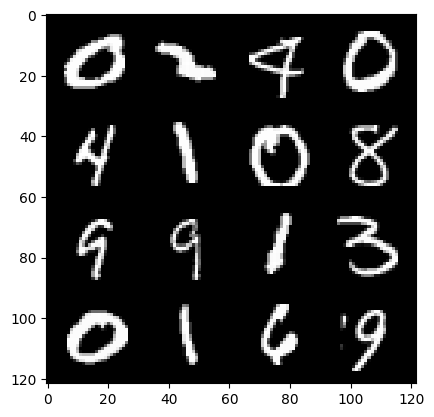

101: step 47700 / Gen loss: 2.8016366108258546 / disc_loss: 0.16992405436933042


  0%|          | 0/469 [00:00<?, ?it/s]

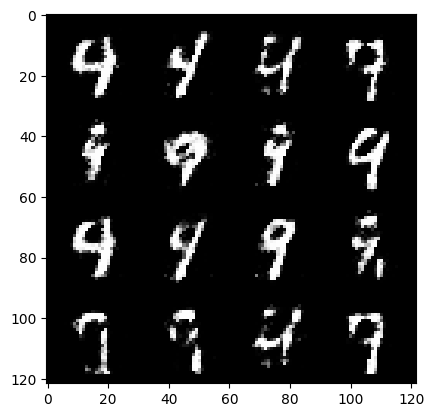

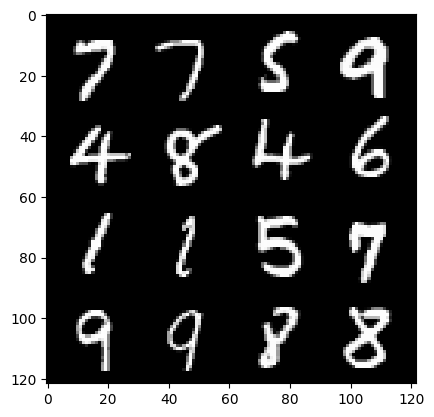

102: step 48000 / Gen loss: 2.9208451151847843 / disc_loss: 0.15655311798055954


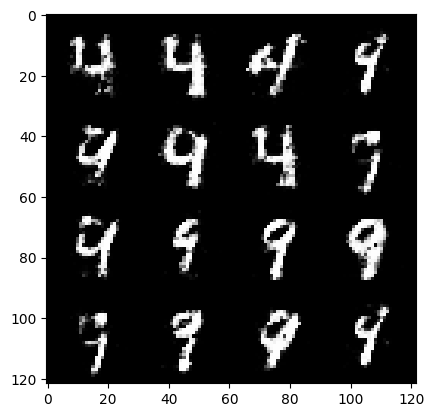

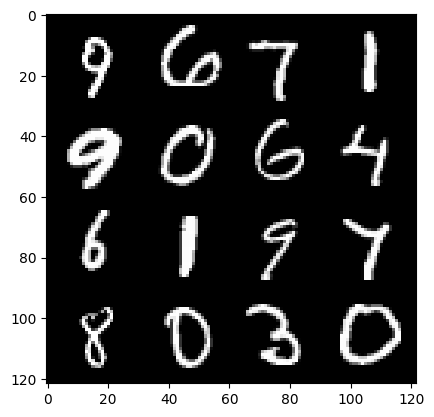

102: step 48300 / Gen loss: 2.6847550964355467 / disc_loss: 0.19073103082676734


  0%|          | 0/469 [00:00<?, ?it/s]

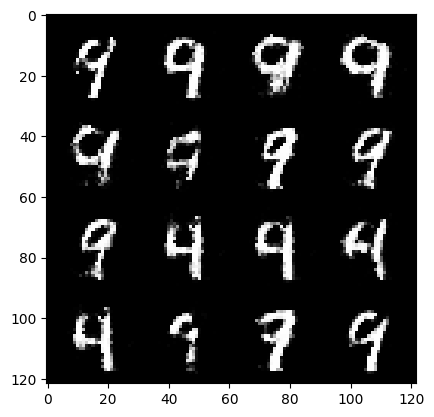

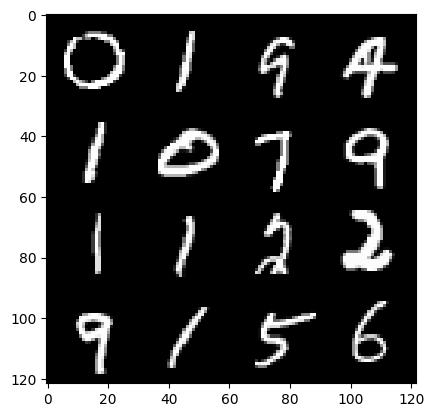

103: step 48600 / Gen loss: 2.7236102565129583 / disc_loss: 0.17423637390136734


  0%|          | 0/469 [00:00<?, ?it/s]

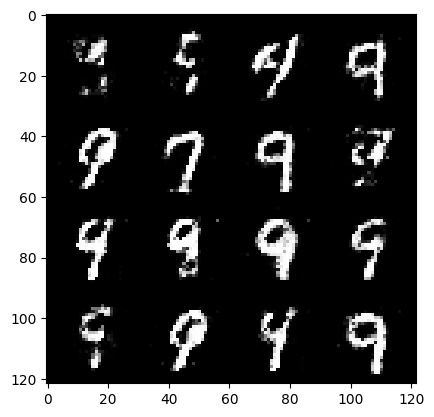

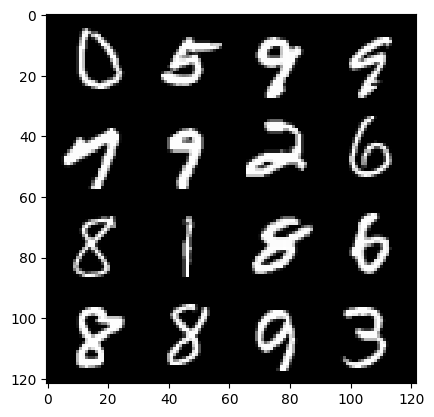

104: step 48900 / Gen loss: 2.8328567759195984 / disc_loss: 0.17370660814146202


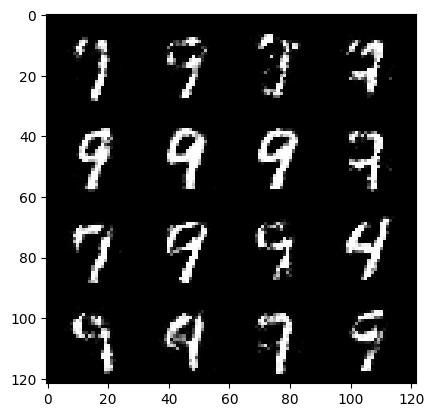

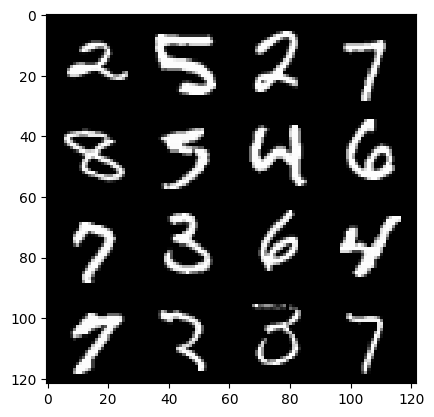

104: step 49200 / Gen loss: 2.7050675304730754 / disc_loss: 0.18583777705828342


  0%|          | 0/469 [00:00<?, ?it/s]

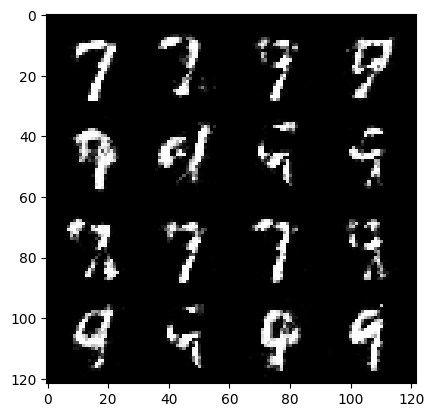

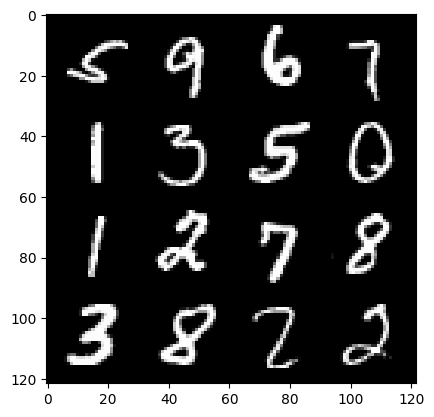

105: step 49500 / Gen loss: 2.7551190161705 / disc_loss: 0.17671064789096516


  0%|          | 0/469 [00:00<?, ?it/s]

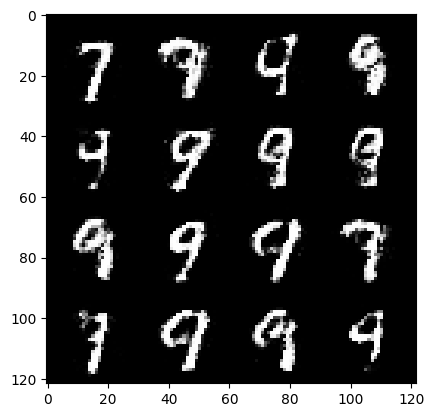

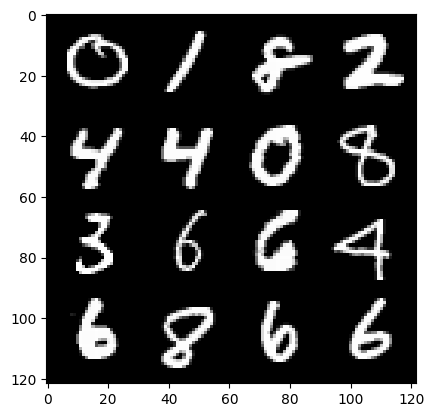

106: step 49800 / Gen loss: 2.70421818812688 / disc_loss: 0.17682218896845966


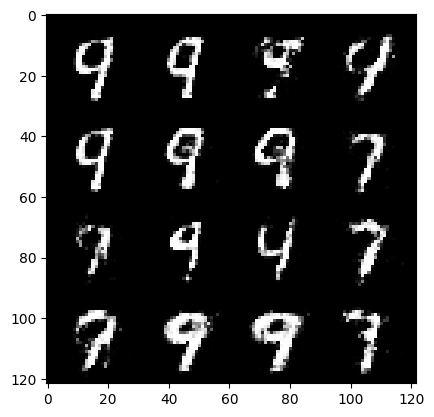

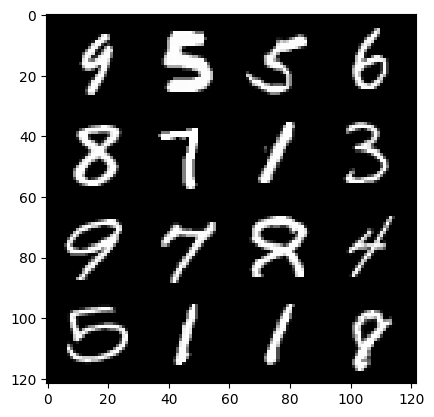

106: step 50100 / Gen loss: 2.753750143051145 / disc_loss: 0.17568754002451895


  0%|          | 0/469 [00:00<?, ?it/s]

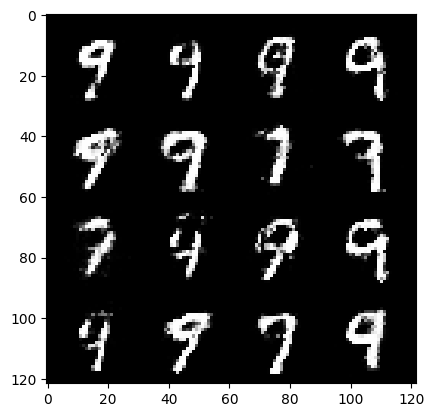

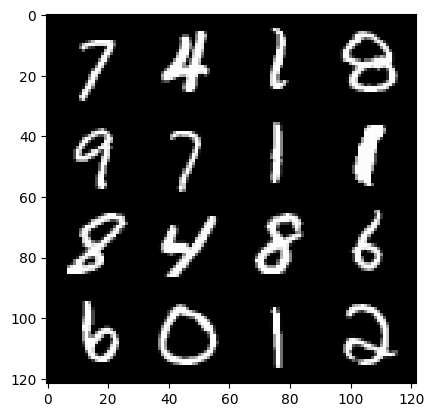

107: step 50400 / Gen loss: 2.7184237758318597 / disc_loss: 0.1725660240898529


  0%|          | 0/469 [00:00<?, ?it/s]

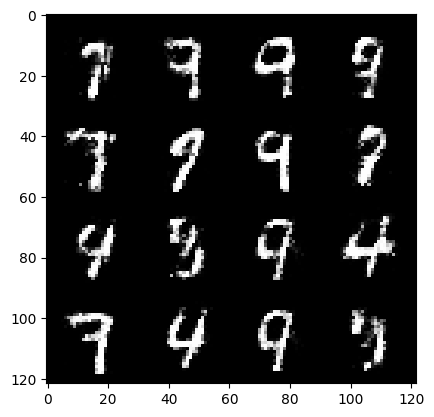

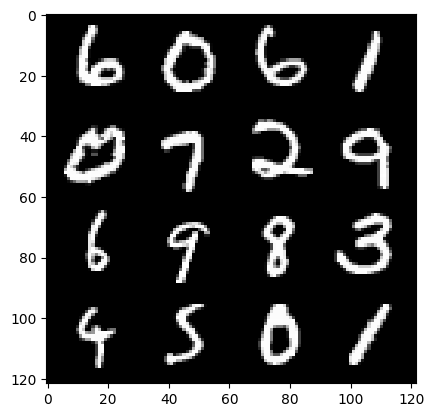

108: step 50700 / Gen loss: 2.6379724216461202 / disc_loss: 0.1906513194491467


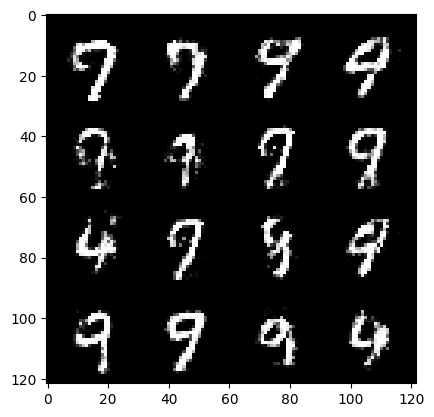

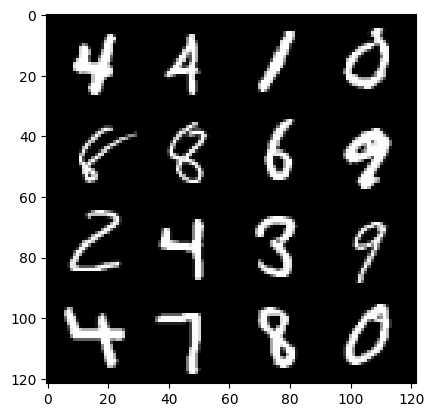

108: step 51000 / Gen loss: 2.5824081524213147 / disc_loss: 0.18794620223343378


  0%|          | 0/469 [00:00<?, ?it/s]

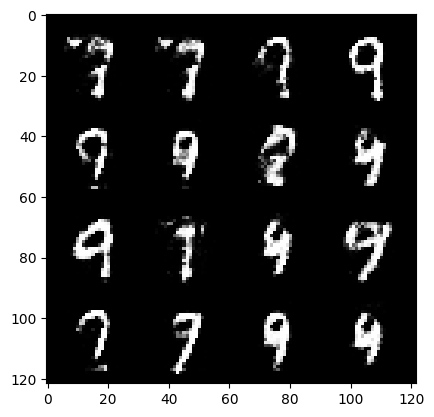

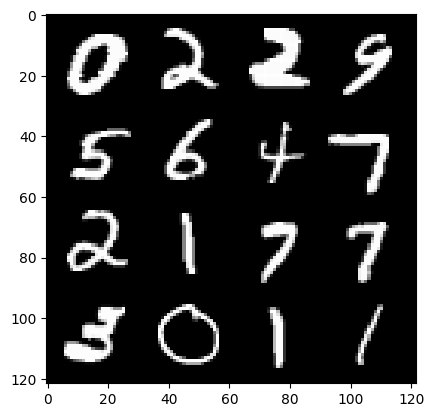

109: step 51300 / Gen loss: 2.576372655232746 / disc_loss: 0.19556641422212123


  0%|          | 0/469 [00:00<?, ?it/s]

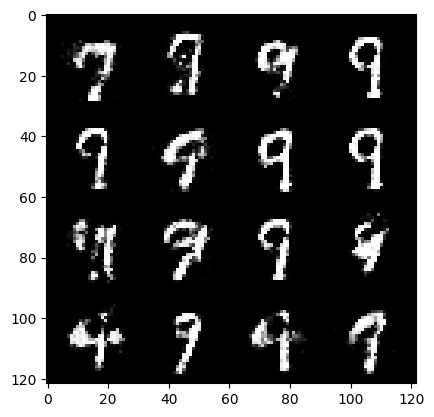

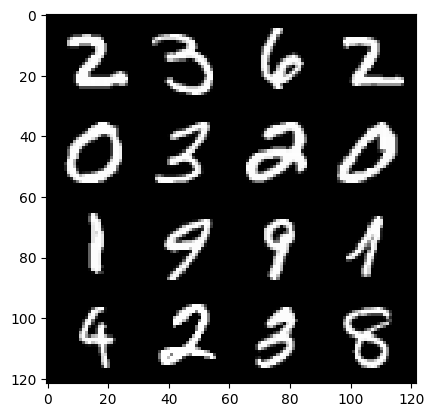

110: step 51600 / Gen loss: 2.6288467494646697 / disc_loss: 0.19587295020620027


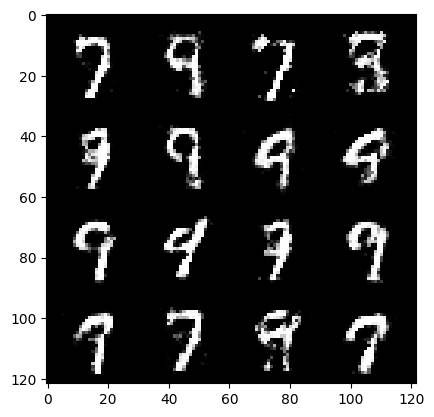

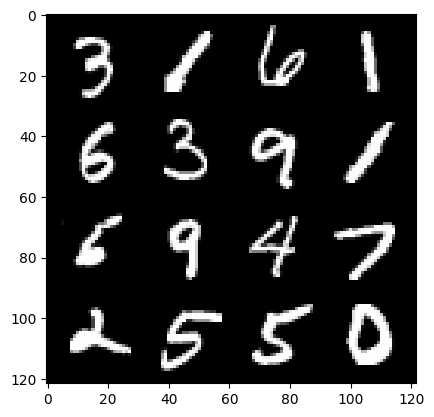

110: step 51900 / Gen loss: 2.610190525054932 / disc_loss: 0.19629212086399395


  0%|          | 0/469 [00:00<?, ?it/s]

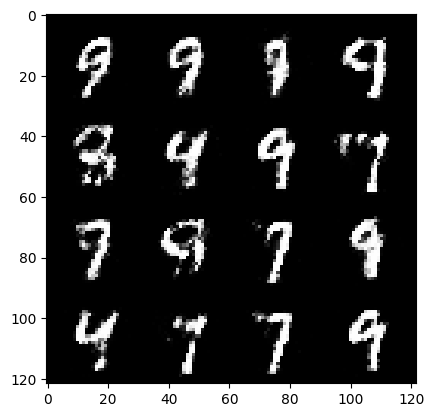

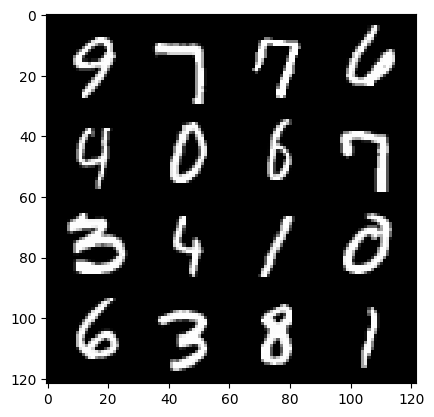

111: step 52200 / Gen loss: 2.671607999006909 / disc_loss: 0.18780551632245382


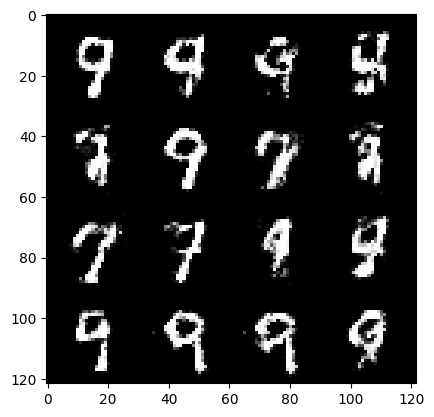

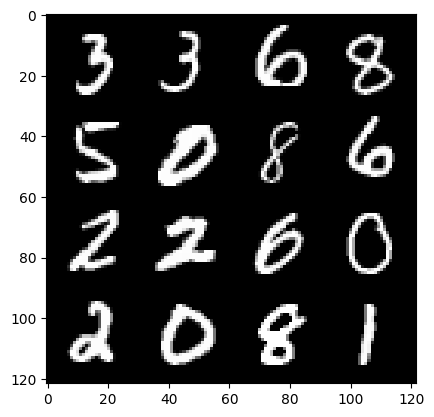

111: step 52500 / Gen loss: 2.5486849466959614 / disc_loss: 0.20700344490508238


  0%|          | 0/469 [00:00<?, ?it/s]

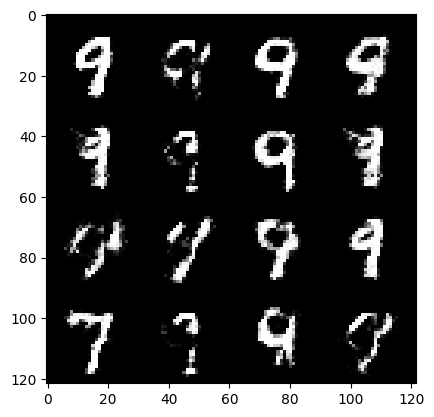

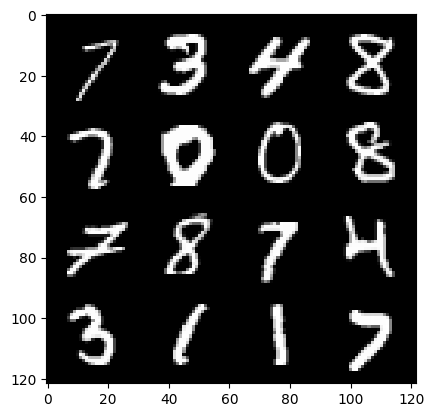

112: step 52800 / Gen loss: 2.442353454430899 / disc_loss: 0.21678241970638432


  0%|          | 0/469 [00:00<?, ?it/s]

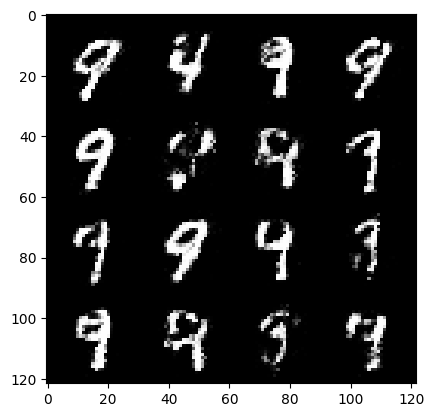

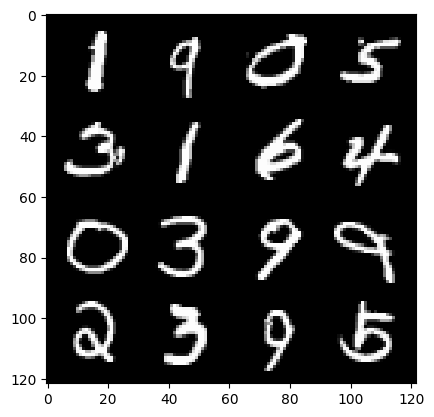

113: step 53100 / Gen loss: 2.501498242219289 / disc_loss: 0.20156455042461568


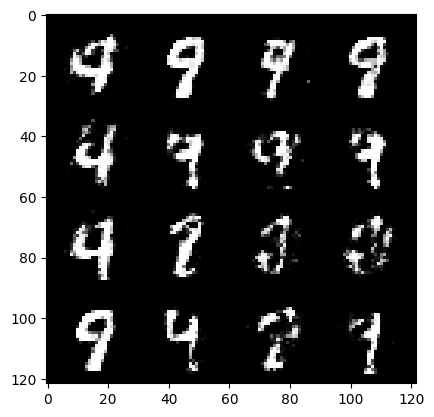

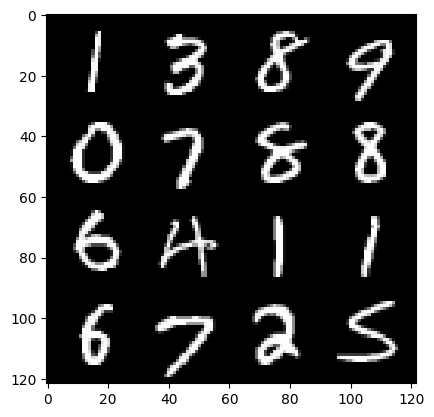

113: step 53400 / Gen loss: 2.5541375005245217 / disc_loss: 0.20082108686367653


  0%|          | 0/469 [00:00<?, ?it/s]

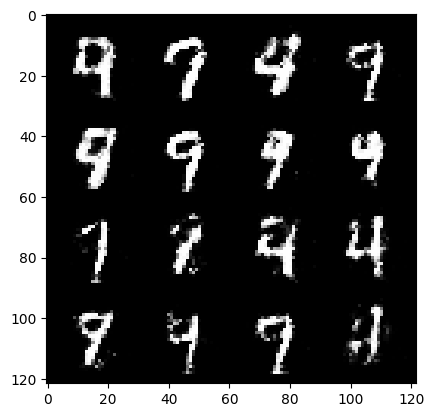

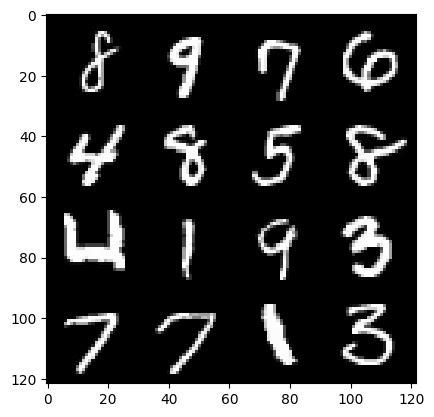

114: step 53700 / Gen loss: 2.5066141470273324 / disc_loss: 0.19852332832912606


  0%|          | 0/469 [00:00<?, ?it/s]

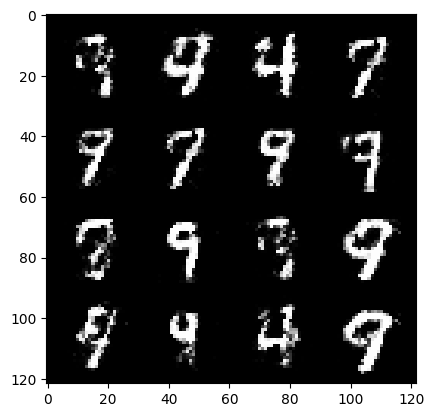

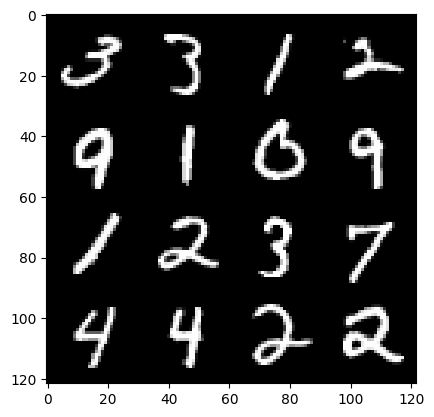

115: step 54000 / Gen loss: 2.616401550769805 / disc_loss: 0.19055024010439725


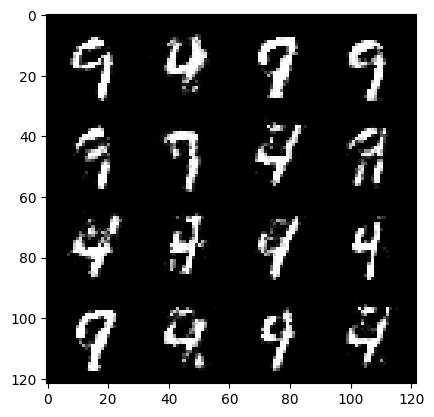

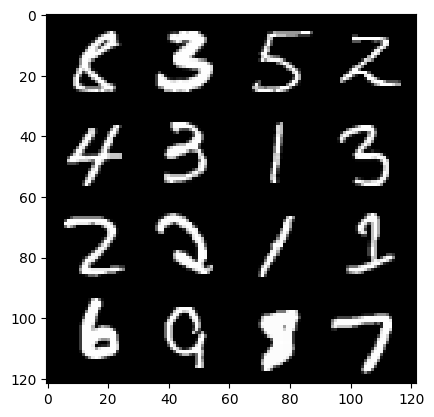

115: step 54300 / Gen loss: 2.5274035255114247 / disc_loss: 0.19965939645965908


  0%|          | 0/469 [00:00<?, ?it/s]

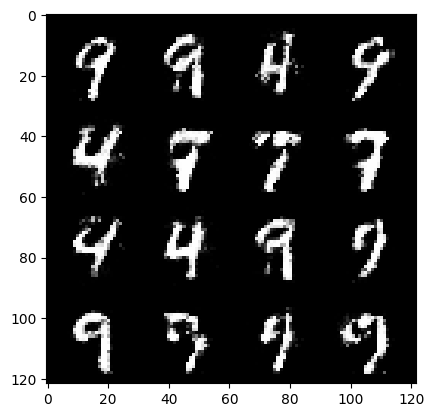

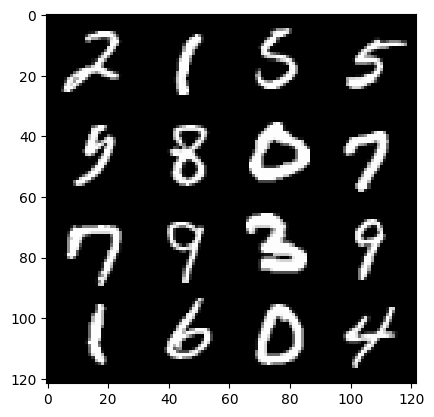

116: step 54600 / Gen loss: 2.4935649534066515 / disc_loss: 0.21353420029083878


In [ ]:
### 60000 / 128 = 468.75  = 469 steps in each epoch
### Each step is going to process 128 images = size of the batch (except the last step)

for epoch in range(epochs):
  for real, _ in tqdm(dataloader):
    ### discriminator
    disc_opt.zero_grad()

    cur_bs=len(real) # real: 128 x 1 x 28 x 28
    real = real.view(cur_bs, -1) # 128 x 784
    real = real.to(device)

    disc_loss = calc_disc_loss(loss_func,gen,disc,cur_bs,real,z_dim)
    disc_loss.backward(retain_graph=True)
    disc_opt.step()

    ### generator
    gen_opt.zero_grad()
    gen_loss = calc_gen_loss(loss_func,gen,disc,cur_bs,z_dim)
    gen_loss.backward(retain_graph=True)
    gen_opt.step()

    ### visualization & stats
    mean_disc_loss+=disc_loss.item()/info_step
    mean_gen_loss+=gen_loss.item()/info_step

    if cur_step % info_step == 0 and cur_step>0:
      fake_noise = gen_noise(cur_bs, z_dim)
      fake = gen(fake_noise)
      show(fake)
      show(real)
      print(f"{epoch}: step {cur_step} / Gen loss: {mean_gen_loss} / disc_loss: {mean_disc_loss}")
      mean_gen_loss, mean_disc_loss=0,0
    cur_step+=1
